<div style="background-color: #F8F8F8; padding: 25px; border-radius: 15px; border-top: 1px solid #FFC52F; border-bottom: 1px solid #FFC52F; border-left: 8px solid #FFC52F; border-right: 8px solid #0046AE;">
<h1 style="color: #0046AE; text-align:center; font-family: 'Helvetica Neue', sans-serif; font-size: 44px; font-weight: bold;"> Kaggle Mini-Project: Histopathologic Cancer Detection</h1>
<hr style="border: none; border-top: 8px solid #FFC52F; margin: 6px 0;">
<h2 style="color: #DA291C; text-align:center; font-family: 'Helvetica Neue', sans-serif; font-size: 40px; font-weight: bold;"> By: Travis Reinart</h2>
<h3 style="color: #000000; text-align:center; font-family: 'Helvetica Neue', sans-serif; font-size: 24px; font-weight: bold;"> August 23, 2025
</h3> <h4 style="color: #7F8C8D; text-align:center; font-family: 'Helvetica Neue', sans-serif; border-top: 1px solid #DCDCDC; padding-top: 10px; margin-top:15px;">
    Week 3 CNN Peer-Graded Assignment
    <br>
    <em>CSCA 5642: Introduction to Deep Learning</em>

<div style="text-align:center; margin-top:10px;">
    <a href="https://github.com/treinart/CSCA-5642-Introduction-to-Deep-Learning/tree/main/Week%203"
      style="color: #0046AE; text-decoration: underline; font-family: 'Helvetica Neue', sans-serif; font-size: 32px; font-weight: bold;" 
      target="_blank">
      GitHub-Week 3 CNN Cancer Detection Kaggle Mini-Project
    </a>
</div>

<div style="text-align:center; margin-top:8px;">
    <a href="https://treinart.github.io/CSCA-5642-Introduction-to-Deep-Learning/Week3_Kaggle_CNN_Cancer_Detection.html/"
      style="color: #0046AE; text-decoration: underline; font-family: 'Helvetica Neue', sans-serif; font-size: 24px; font-weight: normal;" 
      target="_blank">
      View CNN Image Classification Analysis (Live HTML)
    </a>
</div>
</h4>
    <h6 style="color: #FFC52F; text-align:center; font-family: 'Helvetica Neue', sans-serif; font-size: 12px; font-weight: normal; margin-bottom: 2px;">Copyright (c) 2025 Travis Reinart</h6>
<h6 style="color: #FFC52F; text-align:center; font-family: 'Helvetica Neue', sans-serif; font-size: 12px; font-weight: normal; margin-top: 0;">Licensed under the <a href="https://opensource.org/licenses/MIT" target="_blank" rel="noopener" style="color: #0046AE; text-decoration: underline;">MIT License</a>.</h6>

<hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FFC52F; border-right: 8px solid #0046AE;">
  <h2 style="color: #0046AE;">Section 1: Introduction</h2>

  <p>
    This notebook tackles the <em>Histopathologic Cancer Detection</em> challenge: given a 96×96 H&amp;E-stained tissue patch, predict whether the central 32×32 region contains tumor cells. It is a fine-grained, high-variance vision problem where subtle texture and color cues matter. The goal is to build a strong, reproducible pipeline that moves from a clean baseline to a competitive model while keeping the workflow transparent and well instrumented.
  </p>

  <p>
    A few realities shape the approach: images are small, the label depends only on the center region, classes are moderately imbalanced, and the scoring metric is ROC AUC. In practice that means careful EDA, sensible augmentation, and threshold selection are as important as model choice. We will prioritize clarity and speed first, then layer on performance improvements.
  </p>

  <h4 style="color:#FFC52F; margin-top:16px;">Operational Constraints</h4>
  <ul>
    <li><b>Dataset scale and I/O:</b> about 220,000 TIFF patches. Decoding TIFFs in Python adds CPU cost. Cross-filesystem reads from <code>/mnt/c</code> inside WSL are slower than native Linux paths.</li>
    <li><b>GPU memory and throughput:</b> mixed precision helps, but batch size is capped by 8 GB VRAM. The first epoch can be slower due to graph and JIT warm up.</li>
    <li><b>End to end runtime:</b> most time goes into the input pipeline for decode and augment, plus fine-tuning the backbone.</li>
  </ul>

  <h4 style="color:#FFC52F; margin-top:12px;">Mitigations Used</h4>
  <ul>
    <li>Copied data into the Linux filesystem (<code>~/data/histo</code>) to avoid WSL cross-drive penalties.</li>
    <li>Optimized <code>tf.data</code>: parallel <code>map</code>, non-deterministic execution, <code>prefetch</code>, and optional <code>cache()</code> after decode when RAM allows.</li>
    <li>Mixed precision and memory growth, plus a short frozen-base warm up before full fine-tuning.</li>
    <li>Kept augmentations lightweight and tuned batch size to fit VRAM without spills.</li>
  </ul>

  <h3 style="color:#FFC52F;">What you will see in this notebook</h3>
  <ul>
    <li><b>Reproducible setup:</b> GPU-enabled TensorFlow on WSL and Ubuntu, mixed precision where safe, and consistent seeding.</li>
    <li><b>Data audit and visual EDA:</b> class balance, representative grids with center box, color dynamics from H&amp;E, and quality checks for brightness, saturation, and focus.</li>
    <li><b>Baselines to improvements:</b> start with a fast ResNet50 baseline, then iterate with better training strategy, cross-validation, and stronger backbones.</li>
    <li><b>Evaluation discipline:</b> AUC and PR curves, confusion matrices at chosen thresholds, and clear reasoning for hyperparameters.</li>
    <li><b>Submission path:</b> dependable inference code and a final CSV ready for Kaggle.</li>
  </ul>

  <h3 style="color:#FFC52F;margin:0 0 8px 0;">Section Plan</h3>

  <ol style="margin:0 0 0 18px; line-height:1.6;">
    <li><b>Section 1: Introduction</b> (includes Kaggle submissions screenshot)</li>
    <li><b>Section 2: Setup and Library Imports</b></li>
    <li><b>Section 3: Data Loading &amp; In-Depth Audit</b></li>
    <li><b>Section 4: Visual Exploratory Data Analysis (EDA)</b></li>
    <li><b>Section 5: Baseline - ResNet50, single fold (0/5), 224px, 2 warm-up + 4 fine-tune</b></li>
    <li><b>Section 6: Improved - ResNet50, 5-fold ensemble, 224px, 1 warm up + 2 fine tune</b></li>
    <li><b>Section 7: Advanced - EfficientNetV2-S, 5-fold, 320px, 2 warm up + 8 fine tune, 4-view TTA</b></li>
    <li><b>Section 8: Conclusion - From Baseline to Advanced Ensemble</b></li>
  </ol>

  <hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">1.1 Kaggle Competition: Submission Screenshot</h3>


  <p style="margin:0 0 10px 0;">
    The screenshot below shows the final Kaggle <em>Submissions</em> page for this project. Three files were submitted. 
    The best-performing file is <code>final_submission3_effnetv2s_5fold_tta.csv</code> with a <strong>Private score 0.9814</strong> and <strong>Public score 0.9776</strong>. 
    For comparison, the ResNet-50 5-fold ensemble reached <strong>0.9628</strong> (Private) and <strong>0.9781</strong> (Public), and the single-fold baseline scored <strong>0.9515</strong> (Private) and <strong>0.9544</strong> (Public).
  </p>

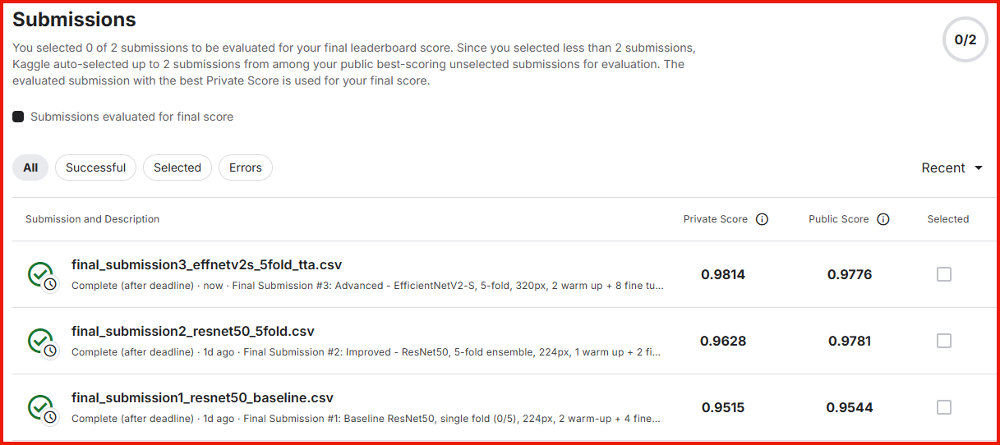

<div style="text-align:center; margin-top:8px;">
    <a href="https://www.kaggle.com/competitions/histopathologic-cancer-detection/overview"
      style="color: #0046AE; text-decoration: underline; font-family: 'Helvetica Neue', sans-serif; font-size: 24px; font-weight: normal;" 
      target="_blank">
      Kaggle Competition: Histopathologic Cancer Detection
    </a>
</div>
</h4>

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FFC52F; border-right: 8px solid #0046AE;">
<h2 style="color: #0046AE;">Section 2: Setup and Library Imports</h2>

This section handles all foundational setup for the project. It outlines the data sources, provides commands for package installation, imports all necessary libraries in a single location, and runs diagnostic checks to ensure the environment is correctly configured for a high-performance, GPU-accelerated deep learning workflow.

<h3 style="color:#FFC52F;">Section Plan:</h3>
<ol>
<li><strong>Data Sources:</strong> Detail the origin, size, and structure of the dataset.</li>
<li><strong>Package Installation:</strong> Provide commands for installing any missing libraries.</li>
<li><strong>Environment Story:</strong> A placeholder for my personal setup notes.</li>
<li><strong>Core Library Imports:</strong> A single, comprehensive cell to load all dependencies.</li>
<li><strong>Diagnostics:</strong> Verify library versions and confirm GPU availability and performance.</li>
</ol>

<hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">2.1 Data Sources</h3>

The data for this project is from the Kaggle Histopathologic Cancer Detection competition. This is a binary image classification challenge to identify metastatic cancer in small image patches.

<div style="text-align:center; margin-top:8px;">
    <a href="https://www.kaggle.com/competitions/histopathologic-cancer-detection/data"
      style="color: #0046AE; text-decoration: underline; font-family: 'Helvetica Neue', sans-serif; font-size: 24px; font-weight: normal;" 
      target="_blank">
      Kaggle Competition Competition Datasets
    </a>
</div>
</h4>

The dataset size is substantial, exceeding 7 GB in size. Due to this, the image files themselves are not stored in this project's GitHub repository. To replicate the analysis, the data must be downloaded from the Kaggle link and placed in the project directory.

<table>
    <thead>
        <tr>
            <th align="left">File Name</th>
            <th align="left">Description</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td><code> 📁 train </code></td>
            <td>A 5.87 GB directory containing 220,025  96x96 pixel color TIFF file (.tif) training images.</td>
        </tr>
        <tr>
            <td><code> 📁 test</code></td>
            <td>A 1.53 GB directory containing 57,458  96x96 pixel color TIFF file (.tif) test images.</td>
        </tr>
        <tr>
            <td><code>📄 sample_submission.csv</code></td>
            <td> A CSV template showing the correct submission file format.</td>
        </tr>
        <tr>
            <td><code>📄 train_labels.csv</code></td>
            <td>A CSV file mapping each training image ID to its binary label (1 for cancer, 0 for no cancer).</td>
        </tr>
            </tbody>
</table>

<small><small>This notebook was developed using the Jupyter Notebook extension within Visual Studio Code, which provided a streamlined and efficient interface for the project. A generative AI was used as a supplementary tool to assist with code debugging and to refine language for clarity. The core logic and all final analysis are my own.</small></small>

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">2.2 <strong style="color: #0046AE;"><em>Optional</em></strong> Install Missing Packages</h3>

If you get a `ModuleNotFoundError` when running the main import cell, install the missing package(s) directly from inside this notebook.  

This ensures the install happens in the same Python environment Jupyter is using.

**Instructions:**  
1. Uncomment the relevant `%pip install` line(s) below.  
2. Run the cell.  
3. Wait until you see the "Successfully installed" message.  
4. In the Jupyter menu, go to **Kernel → Restart**.  
5. Re-run your imports.

**Note:** Restarting the kernel is required after installing a new package so the notebook can detect it.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">

</div>

In [2]:
# Uncomment and run the lines below to install any missing packages.

# Project Environment & API Tools
# %pip install notebook
# %pip install jupyterlab
# %pip install ipywidgets
# %pip install ipykernel
# %pip install qtconsole
# %pip install kaggle

# Core deep learning library
# For a full GPU setup including CUDA/cuDNN libraries, use "tensorflow[and-cuda]==2.16.*"
# %pip install tensorflow

# Core data science and utility libraries
# %pip install numpy
# %pip install pandas
# %pip install scikit-learn
# %pip install tqdm

# Visualization libraries
# %pip install matplotlib
# %pip install seaborn

# Image handling libraries
# %pip install Pillow
# %pip install opencv-python
# %pip install tifffile
# %pip install -U fastparquet
# %pip install -U pyarrow
# %pip install -U tensorflow-io


# Optional Instructions: Export the notebook to HTML (uncomment and delete the leading slash to run)
# Most Jupyter installations include nbconvert but if the commands below fail you can check your version and/or install if needed
#/ !jupyter nbconvert --version # Uncomment and remove leading / to check your version if needed - as of today it is 7.16.6
# %pip install nbconvert # Uncomment and install ncvonvert if needed

# --- Convert Jupyter Notebook .ipynb to .html ---
# IMPORTANT: This bang command is written for the Windows/Python kernel. It will NOT work as-is in a WSL/Ubuntu kernel. 
# In WSL the command runs in Linux’s filesystem namespace, so the relative Windows path to the .ipynb won’t resolve and nbconvert will say “pattern matched no files”.
# Run this cell from a Windows kernel, or keep the code as-is and move to a Windows session. (If you must use WSL, switch to a Linux-style absolute path.)

!jupyter nbconvert --to html "Week3_Kaggle_CNN_Cancer_Detection.ipynb"

[NbConvertApp] Converting notebook Week3_Kaggle_CNN_Cancer_Detection.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 22 image(s).
[NbConvertApp] Writing 19266877 bytes to Week3_Kaggle_CNN_Cancer_Detection.html


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">2.3 <strong style="color: #0046AE;"><em>Optional</em></strong> Run on GPU with Ubuntu 22.04 + VS Code (WSL)</h3>

My first challenge was just getting the GPU to work. I accidentally started on CPU because even though Ubuntu was set up, TensorFlow refused to see the RTX card. It took a while to figure out, but the solution ended up being three simple steps: installing the main NVIDIA driver in Windows, creating a fresh Python 3.10 environment, and pointing VS Code to that new kernel.

Once the GPU was running, I ran into VRAM spikes that would crash my training. I managed to stabilize things by enabling mixed precision and a couple of TensorFlow memory flags (TF_FORCE_GPU_ALLOW_GROWTH and cuda_malloc_async). The most surprising fix was discovering my extra monitors were using a significant chunk of VRAM. Just by unplugging them, my runs could finally complete.

The last hurdle was WSL consuming too much system RAM during data loading. I solved that by occasionally dropping caches and setting a memory limit in .wslconfig. After all that tuning, everything clicked into place: nvidia-smi showed a stable GPU, and my training times became genuinely fast.

<strong>Goal:</strong> launch Jupyter in Ubuntu 22.04 (WSL2), use a virtual env on Python 3.10.12, and make sure TensorFlow sees the NVIDIA GPU.

<h3><span style="color:#FFC52F;">Below are the steps I followed to create this environment:</span></h3>


<hr style="border: none; border-top: 4px solid #FFC52F; margin: 10px 0;">

<h4 style="color: #0046AE; text-align: left;">Step 1: Install Ubuntu on WSL2</h4>
<table style="width:100%; border-collapse: collapse;">
<tr style="border-bottom: 2px solid #0046AE;">
<td style="padding: 8px; width: 50%;">Open PowerShell as Administrator and run:</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
wsl --install -d Ubuntu-22.04<br>
wsl --set-default-version 2<br>
wsl --update
</td>
</tr>
<tr>
<td style="padding: 8px;">Launch Ubuntu and create your user/password.</td>
<td style="padding: 8px; background-color: #2E2E2E; border-radius: 5px;">
<strong style="color: #FFC52F;">Important Tip:</strong> The password prompt in the Linux terminal stays blank as you type. This is normal security behavior!
</td>
</tr>
</table>

<h4 style="color: #0046AE; text-align: left; margin-top: 20px;">Step 2: Install NVIDIA Driver & Verify</h4>
<table style="width:100%; border-collapse: collapse;">
<tr style="border-bottom: 2px solid #0046AE;">
<td style="padding: 8px; width: 50%;">Install the latest driver on <strong>Windows</strong>, not inside WSL. The Windows driver automatically provides CUDA support to WSL2.</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
<a href="https://www.nvidia.com/Download/index.aspx" target="_blank" style="color: #FFC52F;">NVIDIA Driver Downloads</a>
</td>
</tr>
<tr>
<td style="padding: 8px;">From the Ubuntu terminal, verify the GPU is visible:</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
nvidia-smi
</td>
</tr>
</table>

<h4 style="color: #0046AE; text-align: left; margin-top: 20px;">Step 3: Create Python Virtual Environment</h4>
<table style="width:100%; border-collapse: collapse;">
<tr style="border-bottom: 2px solid #0046AE;">
<td style="padding: 8px; width: 50%;">Install Python 3.10 and venv:</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
sudo apt-get update && sudo apt-get -y install python3.10 python3.10-venv python3-pip
</td>
</tr>
<tr style="border-bottom: 2px solid #0046AE;">
<td style="padding: 8px;">Create and activate the environment (I named mine tfenv):</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
python3.10 -m venv ~/tfenv<br>
source ~/tfenv/bin/activate
</td>
</tr>
<tr>
<td style="padding: 8px;">Install libraries and register the kernel for Jupyter:</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
pip install -U pip<br>
pip install "tensorflow[and-cuda]==2.16.*" numpy pandas matplotlib scikit-learn jupyter ipykernel pillow<br>
python -m ipykernel install --user --name tfenv --display-name "Python (tfenv)"
</td>
</tr>
</table>

<h4 style="color: #0046AE; text-align: left; margin-top: 20px;">Step 4: Connect with VS Code</h4>
<table style="width:100%; border-collapse: collapse;">
<tr>
<td style="padding: 8px; width: 50%;">In VS Code, install the "Remote - WSL" extension, then connect to your Ubuntu instance (Ctrl+Shift+P → "WSL: Connect to WSL").</td>
<td style="padding: 8px; background-color: #2E2E2E; border-radius: 5px;">
Once connected, the bottom-left corner should show <strong style="color: #FFC52F;">WSL: Ubuntu-22.04</strong>.
</td>
</tr>
</table>

<h4 style="color: #0046AE; text-align: left; margin-top: 20px;">Step 5: Launching the Notebook in the WSL Environment</h4>
<table style="width:100%; border-collapse: collapse;">
    <tr style="border-bottom: 2px solid #0046AE;">
        <td style="padding: 8px; width: 50%;">In VS Code, open the Command Palette (Ctrl+Shift+P), type the following, and select it:</td>
        <td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
            WSL: Connect to WSL
        </td>
    </tr>
    <tr style="border-bottom: 2px solid #0046AE;">
        <td style="padding: 8px;">A new VS Code window connected to Ubuntu will open. Verify the connection by checking the green box in the bottom-left corner.</td>
        <td style="padding: 8px; background-color: #2E2E2E; border-radius: 5px;">
            It should say <strong style="color: #FFC52F;">WSL: Ubuntu-22.04</strong>.
        </td>
    </tr>
    <tr>
        <td style="padding: 8px;">In this new window, go to <strong>Open File > Show Local...</strong>, navigate to your project folder, and open your notebook. You can now select the <strong>Python (tfenv) 3.10.12</strong> kernel. </td> 
        <td style="padding: 8px; background-color: #2E2E2E; border-radius: 5px;">
            This final step ensures your notebook is running inside Ubuntu with access to the correct Python environment and GPU.
        </td>
    </tr>
</table>

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">2.4 Core Library Imports & High-Performance Configuration</h3>

This is the primary setup cell for the entire notebook. It performs critical pre-import configurations for TensorFlow to optimize GPU memory management and prevent common out-of-memory (OOM) errors. Following this, it imports all libraries required for data analysis, visualization, and model building.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [1]:
# High-Performance TensorFlow Configuration (MUST RUN BEFORE IMPORT)
# These settings help prevent GPU memory fragmentation and OOM errors.
import os
os.environ["TF_GPU_ALLOCATOR"] = "cuda_malloc_async"
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["XLA_FLAGS"] = "--xla_gpu_strict_conv_algorithm_picker=false"
os.environ["TF_CUDNN_WORKSPACE_LIMIT_IN_MB"] = "256"


# Core Python and System Libraries
import sys
import time
import platform
import random
import hashlib
import gc
from pathlib import Path
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm

# TensorFlow and Keras for Deep Learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import mixed_precision
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization as BN
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import ResNet50, EfficientNetV2S
from tensorflow.keras.applications.resnet50 import preprocess_input


# Safer VRAM allocation pattern
for g in tf.config.list_physical_devices("GPU"):
    try:
        tf.config.experimental.set_memory_growth(g, True)
    except Exception:
        pass

# Data Handling and Manipulation
import numpy as np
import pandas as pd

# Data Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.ticker as mticker
import seaborn as sns
from PIL import Image
import cv2
import tifffile as tiff
from collections import Counter

# Scikit-learn for ML utilities
from sklearn.model_selection import StratifiedKFold, StratifiedGroupKFold
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve, confusion_matrix

# Set Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
print(f"SEED set to {SEED} — reproducibility enabled.")

# Enable mixed precision for speed and memory benefits
mixed_precision.set_global_policy("mixed_float16")
print(" --- TensorFlow mixed precision policy set to 'mixed_float16' ---")
print("-" * 70)

2025-08-25 20:29:18.847633: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-25 20:29:19.196682: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-25 20:29:21.057865: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


SEED set to 42 — reproducibility enabled.
 --- TensorFlow mixed precision policy set to 'mixed_float16' ---
----------------------------------------------------------------------


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">2.5 Diagnostics and Verification</h3>

Verify the versions of the key libraries and confirm that a GPU is detected and operational. It also sets the mixed precision policy, which provides a significant performance boost on compatible hardware.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [3]:
# Display GPU Hardware Information
!nvidia-smi

# TensorFlow build info
try:
    build = tf.sysconfig.get_build_info()
    print(f"CUDA: {build.get('cuda_version')} | cuDNN: {build.get('cudnn_version')}")
except Exception:
    pass

# OpenCV CUDA capability
try:
    n = cv2.cuda.getCudaEnabledDeviceCount()
    print(f"OpenCV CUDA devices: {n}")
except Exception:
    pass

print("-" * 70)
print("--- Environment & Library Versions ---")

# System Information
print(f"Python Version:   {platform.python_version()}")
print(f"OS:               {platform.system()} {platform.release()}")

# Core ML/DS Library Versions
print("\n--- Core Libraries ---")
print(f"TensorFlow:       {tf.__version__}")
print(f"Keras:            {keras.__version__}")
print(f"NumPy:            {np.__version__}")
print(f"Pandas:           {pd.__version__}")
print(f"Scikit-learn:     {__import__('sklearn').__version__}")

# Visualization & Image Library Versions
print("\n--- Supporting Libraries ---")
print(f"Matplotlib:       {__import__('matplotlib').__version__}")
print(f"Seaborn:          {sns.__version__}")
print(f"Pillow (PIL):     {Image.__version__}")
print(f"OpenCV (cv2):     {cv2.__version__}")
print(f"tifffile:         {tiff.__version__}")
print(f"tqdm:             {__import__('tqdm').__version__}")
print("-" * 70)

try:
    policy = mixed_precision.Policy('mixed_float16')
    mixed_precision.set_global_policy(policy)
    print("--- Performance Policies ---")
    print(f"  Mixed Precision Compute Dtype: {policy.compute_dtype}")
    print(f"  Mixed Precision Variable Dtype: {policy.variable_dtype}")
except Exception as e:
    print(f"  Could not set mixed precision policy: {e}")
print("-" * 70)

print(f"SEED set to {SEED} — reproducibility enabled.")
print("-" * 70)

# GPU Hardware Diagnostics
print("\n--- GPU Hardware Verification ---")
gpu_devices = tf.config.list_physical_devices('GPU')
if gpu_devices:
    details = tf.config.experimental.get_device_details(gpu_devices[0])
    print(f"   GPU Detected: {details.get('device_name', 'N/A')}")
    print(f"   Compute Capability: {details.get('compute_capability', 'N/A')}")
    with tf.device("/GPU:0"):
        a = tf.random.normal([2048, 2048], dtype=tf.float16)
        b = tf.random.normal([2048, 2048], dtype=tf.float16)
        t0 = time.time()
        _ = tf.linalg.matmul(a,b).numpy()
        print(f"   GPU Matmul Test (FP16): {time.time()-t0:.4f} seconds")
else:
    print(" --- WARNING: No GPU detected!!! ---")
print("-" * 70)

# Check Jupyter version
print("--- Jupyter Environment ---")
!where jupyter
!jupyter --version

print("\n--- Setup complete. Libraries imported successfully. ---")
print("-" * 70)

Mon Aug 25 20:31:56 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.34                 Driver Version: 546.26       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4070 ...    On  | 00000000:01:00.0 Off |                  N/A |
| N/A   49C    P0              15W /  90W |    347MiB /  8188MiB |      2%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

I0000 00:00:1756171916.682213     944 gpu_process_state.cc:208] Using CUDA malloc Async allocator for GPU: 0
I0000 00:00:1756171916.682831     944 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5535 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9
2025-08-25 20:31:56.736296: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


   GPU Matmul Test (FP16): 0.1398 seconds
----------------------------------------------------------------------
--- Jupyter Environment ---
/bin/bash: line 1: where: command not found
Selected Jupyter core packages...
IPython          : 8.37.0
ipykernel        : 6.30.1
ipywidgets       : 8.1.7
jupyter_client   : 8.6.3
jupyter_core     : 5.8.1
jupyter_server   : 2.17.0
jupyterlab       : 4.4.6
nbclient         : 0.10.2
nbconvert        : 7.16.6
nbformat         : 5.10.4
notebook         : 7.4.5
qtconsole        : 5.6.1
traitlets        : 5.14.3

--- Setup complete. Libraries imported successfully. ---
----------------------------------------------------------------------


### **Observation: Environment and Library Versions**

At the time this notebook was last run (August 23, 2025), the environment was configured and verified as follows. The setup is a Linux distribution running via WSL2, with a comprehensive suite of up-to-date data science and deep learning libraries. The hardware verification confirms that the NVIDIA GPU is correctly configured with the necessary drivers and is accessible to TensorFlow for accelerated computation.

**Hardware & Driver Stack:**
* **GPU:** NVIDIA GeForce RTX 4070 Laptop GPU
* **NVIDIA Driver:** 546.26
* **CUDA Version (from driver):** 12.3
* **CUDA Version (from TensorFlow):** 12.5.1
* **cuDNN Version (from TensorFlow):** 9

**Software Environment:**
* **Python:** 3.10.12
* **OS:** Linux 6.6.87.2-microsoft-standard-WSL2
* **TensorFlow:** 2.20.0
* **Keras:** 3.11.3
* **NumPy:** 2.2.6
* **Pandas:** 2.3.2
* **Scikit-learn:** 1.7.1
* **Matplotlib:** 3.10.5
* **Seaborn:** 0.13.2
* **Pillow (PIL):** 11.3.0
* **OpenCV (cv2):** 4.12.0
* **tifffile:** 2025.5.10
* **tqdm:** 4.67.1

**Jupyter Core Packages:**
* **IPython:** 8.37.0
* **ipykernel:** 6.30.1
* **jupyter_core:** 5.8.1
* **notebook:** 7.4.5

These versions reflect the state of the libraries during the development and execution of this notebook. To ensure full reproducibility of the results, it may be necessary to match this environment.

**Note:** If your environment shows older or missing versions, please refer to Section 2.2 ("Optional: Install Missing Packages") and run the relevant installation commands.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">2.6 <strong style="color: #0046AE;"><em>Optional</em></strong> Fix for 'Notebook Controller is DISPOSED'</h3>

<p>
This section provides a solution for a common Jupyter/VS Code error where the kernel disconnects, showing the message "notebook controller is DISPOSED." This typically happens when the Jupyter kernel's state becomes corrupted or out of sync with VS Code, or when you switch between different virtual environments. The steps below will reset the kernel's state and re-register the <strong>Python (tfenv)</strong> kernel.
</p>

<p>
<strong>Goal:</strong> Restore a working kernel connection by safely cleaning up the Jupyter runtime state and re-registering the <code>tfenv</code> kernel.
</p>

<h3><span style="color:#FFC52F;">Below are the steps to fix this error:</span></h3>

<hr style="border: none; border-top: 4px solid #FFC52F; margin: 10px 0;">

<h4 style="color: #0046AE; text-align: left;">Step 1: Close all notebooks in VS Code</h4>
<table style="width:100%; border-collapse: collapse;">
<tr style="border-bottom: 2px solid #0046AE;">
<td style="padding: 8px; width: 50%;">Before running any commands, close all open Jupyter notebooks in your VS Code window. This prevents any ongoing processes from interfering with the cleanup.</td>
<td style="padding: 8px; background-color: #2E2E2E; border-radius: 5px;">
<strong style="color: #FFC52F;">Important Tip:</strong> Do not just close the tab; make sure the entire notebook is closed in the editor.
</td>
</tr>
</table>

<h4 style="color: #0046AE; text-align: left; margin-top: 20px;">Step 2: Run Cleanup Commands in WSL Ubuntu Terminal</h4>
<table style="width:100%; border-collapse: collapse;">
<tr style="border-bottom: 2px solid #0046AE;">
<td style="padding: 8px; width: 50%;">Open a new WSL Ubuntu terminal <strong>(Ctrl+Shift+~)</strong> and paste the following block of code. This will activate your environment, kill stray processes, clear temporary files, and re-register your kernel.</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
<span style="color: #999;"># Activate your environment</span><br>
<span style="color: #FFC52F;">source ~/tfenv/bin/activate</span><br><br>
<span style="color: #999;"># 1) Kill any stray Jupyter / ipykernel processes</span><br>
pkill -f "jupyter|ipykernel|python -m ipykernel" 2>/dev/null || true<br><br>
<span style="color: #999;"># 2) Clear Jupyter runtime sockets (temp files)</span><br>
rm -rf ~/.local/share/jupyter/runtime/* 2>/dev/null || true<br><br>
<span style="color: #999;"># 3) Make sure ipykernel + Jupyter clients are current</span><br>
python -m pip install -U ipykernel jupyter_client jupyter_core<br><br>
<span style="color: #999;"># 4) Re-register this env as a kernel</span><br>
python -m ipykernel install --user --name tfenv --display-name "Python (tfenv)"<br><br>
<span style="color: #999;"># 5) (Optional but helpful) clear VS Code state in WSL</span><br>
rm -rf ~/.vscode-server/data/User/globalStorage/ms-toolsai.jupyter 2>/dev/null || true<br>
rm -rf ~/.vscode-server/data/User/globalStorage/ms-python.python 2>/dev/null || true
</td>
</tr>
<tr>
<td style="padding: 8px;">Run this command to inspect and optionally remove any kernels that point to non-existent paths.</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
jupyter kernelspec list
</td>
</tr>
</table>

<h4 style="color: #0046AE; text-align: left; margin-top: 20px;">Step 3: Reload VS Code and Re-Select Kernel   <strong style="color: #FFC52F;"><em>  See Section 2.3 for Complete WSL Ubuntu-22.04 Loading Instructions</em></strong>.</h4>
<table style="width:100%; border-collapse: collapse;">
<tr style="border-bottom: 2px solid #0046AE;">
<td style="padding: 8px; width: 50%;">Return to VS Code and force a complete reload of the window.</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
<strong style="color: #FFC52F;">Ctrl+Shift+P</strong> → "WSL: Connect to WSL"
</td>
</tr>
<tr>
<td style="padding: 8px;">Reopen your notebook and select the <strong>Python (tfenv) 3.10.12</strong> kernel. If it's still not working, try this specific sequence:</td>
<td style="padding: 8px; font-family: monospace; background-color: #1E1E1E; border-radius: 5px;">
<strong style="color: #FFC52F;">Ctrl+Shift+P</strong> &rarr; "Jupyter: Select Notebook Kernel" <br>
&rarr; "Existing Jupyter Server" (Local) <br>
&rarr; "Python (tfenv) 3.10.12"
</td>
</tr>
</table>

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FFC52F; border-right: 8px solid #0046AE;">
<h2 style="color: #0046AE;">Section 3: Data Loading & In-Depth Audit</h2>

With the environment configured and verified, the next step is to load the dataset and perform a thorough audit. This section covers defining the file paths, conducting an initial structural review of the labels file, and executing a critical data integrity check to identify any duplicate images, which is a crucial step for ensuring a reliable validation strategy.

<span style="color:#FFC52F;">Section Plan:</span>
<ol>
<li><strong>Define Paths & Load Labels:</strong> Establish Path objects for all data assets and load the core train_labels.csv file.</li>
<li><strong>Dataset Overview:</strong> Conduct a high-level audit of the DataFrame to understand its structure, size, and class distribution.</li>
<li><strong>Data Integrity Check:</strong> Perform an MD5 hash on every training image to programmatically verify that no duplicate images exist.</li>
</ol>

<hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">3.1 Define Paths & Load Labels</h3>

Start by defining the file paths using pathlib for operating system compatibility. This ensures the notebook can run on different systems without modification. Then, load the train_labels.csv file, which is the file that contains the verified labels for the entire training set.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [4]:
# Define the main data directory for the project.
DATA_DIR = Path("/mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 3/Week 3 CNN Cancer Detection Kaggle Mini-Project")

# Construct the full paths for the training images, test images, and CSV files.
DATA_DIR         = Path.home() / "data/histo"
TRAIN_IMG_DIR    = DATA_DIR / "train"
TEST_IMG_DIR     = DATA_DIR / "test"
TRAIN_LABELS_CSV = DATA_DIR / "train_labels.csv"
SAMPLE_SUB_CSV   = DATA_DIR / "sample_submission.csv"

# Verify that all specified paths exist to prevent file-not-found errors.
assert TRAIN_IMG_DIR.exists(), f"Training image directory not found at: {TRAIN_IMG_DIR}"
assert TEST_IMG_DIR.exists(), f"Test image directory not found at: {TEST_IMG_DIR}"
assert TRAIN_LABELS_CSV.exists(), f"Training labels CSV not found at: {TRAIN_LABELS_CSV}"
assert SAMPLE_SUB_CSV.exists(), f"Sample submission CSV not found: {SAMPLE_SUB_CSV}"
print("Data paths verified.")

# Load the training labels from the CSV file into a pandas DataFrame.
df_labels = pd.read_csv(TRAIN_LABELS_CSV)

# Ensure the DataFrame contains the required 'id' and 'label' columns.
assert {"id","label"}.issubset(df_labels.columns), "train_labels.csv must have columns: ['id','label']"

# Convert the 'label' column to a memory-efficient integer type.
df_labels["label"] = df_labels["label"].astype("int8")

# Verify that the 'label' column only contains the expected binary values (0 or 1).
uniq_lbls = set(df_labels["label"].unique())
assert uniq_lbls <= {0,1}, f"Unexpected label values: {uniq_lbls}"

# Create a new 'path' column containing the full file path for each image.
df_labels['path'] = df_labels['id'].apply(lambda x: str(TRAIN_IMG_DIR / f'{x}.tif'))

# Display summary information about the loaded DataFrame.
print(f"Loaded {len(df_labels):,} rows from {TRAIN_LABELS_CSV.name}.")
print(f"Total Rows: {len(df_labels):,} | Unique IDs: {df_labels['id'].nunique():,}")
print("\n--- Sample of Loaded Data ---")

# Display the first few rows of the DataFrame for a quick review.
display(df_labels.head(3))

# Show an example of a complete image path from the new column.
print(f"\nExample image path:\n{df_labels['path'].iloc[0]}")
print("-" * 70)

# Take a small, random sample of paths to perform a quick file existence check.
sample_paths = df_labels["path"].sample(min(20, len(df_labels)), random_state=42).tolist()
missing = [p for p in sample_paths if not Path(p).exists()]

# Report the number of missing files found in the sample.
print(f"Quick missing file check on {len(sample_paths)} files → missing: {len(missing)}")
print("-" * 70)

Data paths verified.
Loaded 220,025 rows from train_labels.csv.
Total Rows: 220,025 | Unique IDs: 220,025

--- Sample of Loaded Data ---


,id,label,path
0,f38a6374c348f90b587e046aac6079959adf3835,0,/home/treinart/data/histo/train/f38a6374c348f9...
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1,/home/treinart/data/histo/train/c18f2d887b7ae4...
2,755db6279dae599ebb4d39a9123cce439965282d,0,/home/treinart/data/histo/train/755db6279dae59...



Example image path:
/home/treinart/data/histo/train/f38a6374c348f90b587e046aac6079959adf3835.tif
----------------------------------------------------------------------
Quick missing file check on 20 files → missing: 0
----------------------------------------------------------------------


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">3.2 Dataset Overview</h3>

Perform a high-level audit of the df_labels DataFrame to understand its key characteristics, including its structure, memory usage, and the class balance between positive and negative samples.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [5]:
# Define key parameters and constants for data sampling and visualization.
N_SHAPE_SAMPLE = 2000
N_PIXEL_SAMPLE = 1500
N_GRID         = 36
TOP_K_SIZES    = 10

print("-" * 70)
print("--- High-Level Dataset Summary ---")

# Calculate key metrics by counting files on disk and analyzing the DataFrame.
train_image_count = sum(1 for _ in TRAIN_IMG_DIR.glob("*.tif"))
test_image_count  = sum(1 for _ in TEST_IMG_DIR.glob("*.tif"))
total_labels = len(df_labels)
positive_cases = df_labels['label'].sum()
negative_cases = total_labels - positive_cases

# Assemble the calculated metrics into a new DataFrame for a clean presentation.
summary_df = pd.DataFrame({
    'Metric': [
        'Total Training Images (from folder)',
        'Total Test Images (from folder)',
        'Total Labels (from CSV)',
        'Positive Class (Cancer) Count',
        'Negative Class (No Cancer) Count',
        'Positive Class Percentage',
        'Image Dimensions',
        'DataFrame Memory Usage'
    ],
    'Value': [
        f"{train_image_count:,}",
        f"{test_image_count:,}",
        f"{total_labels:,}",
        f"{positive_cases:,}",
        f"{negative_cases:,}",
        f"{positive_cases / total_labels:.2%}",
        "96 x 96 pixels (RGB)",
        f"{df_labels.memory_usage(deep=True).sum() / 1024**2:.2f} MB"
    ]
}).set_index('Metric')

# Apply custom styling to the summary DataFrame and display it.
display(summary_df.style.set_properties(**{
    'background-color': '#1E1E1E',
    'color': '#F8F8F8',
    'border-color': '#FFC52F'
}).set_table_styles([{
    'selector': 'th',
    'props': [('background-color', '#0046AE'), ('color', 'white')]
}]))
print("-" * 70)

# Get the total row count from the CSV and image counts from the disk.
n_train_csv  = len(df_labels)
n_train_disk = sum(1 for _ in TRAIN_IMG_DIR.glob("*.tif"))
n_test_disk  = sum(1 for _ in TEST_IMG_DIR.glob("*.tif")) if TEST_IMG_DIR.exists() else 0

# Print the raw counts for a quick comparison.
print(f"train_labels.csv rows: {n_train_csv:,}")
print(f"train/*.tif on disk : {n_train_disk:,}")
print(f"test/*.tif on disk  : {n_test_disk:,}")

# Perform another spot-check for missing files using a larger sample size.
_sample_paths = df_labels["path"].sample(min(2000, n_train_csv), random_state=42)
missing = [p for p in _sample_paths if not Path(p).exists()]
print(f"Spot-check existence: {len(_sample_paths):,} sampled → missing files: {len(missing)}")
print("-" * 70)

# Calculate the class balance from the 'label' column.
cls_counts = df_labels["label"].value_counts().sort_index()
neg = int(cls_counts.get(0, 0))
pos = int(cls_counts.get(1, 0))
pos_rate = (pos / (pos + neg) * 100) if (pos + neg) else float("nan")

# Print a final, concise summary of the dataset statistics.
print("\n--- CONCISE SUMMARY ---")
print(f"- train rows: {n_train_csv:,} | train images on disk: {n_train_disk:,} | test images on disk: {n_test_disk:,}")
print(f"- Class balance: pos={pos:,} ({pos_rate:.2f}%), neg={neg:,}")

# Conditionally print pixel statistics if they have been calculated previously.
if 'mu' in locals():
    print(f"- Per-channel mean≈{np.round(mu,4)}, std≈{np.round(sg,4)} (0..1 scale)")
print("-" * 70)

----------------------------------------------------------------------
--- High-Level Dataset Summary ---


,Value
Metric,
Total Training Images (from folder),"220,025"
Total Test Images (from folder),"57,458"
Total Labels (from CSV),"220,025"
Positive Class (Cancer) Count,"89,117"
Negative Class (No Cancer) Count,"130,908"
Positive Class Percentage,40.50%
Image Dimensions,96 x 96 pixels (RGB)
DataFrame Memory Usage,48.47 MB


----------------------------------------------------------------------
train_labels.csv rows: 220,025
train/*.tif on disk : 220,025
test/*.tif on disk  : 57,458
Spot-check existence: 2,000 sampled → missing files: 0
----------------------------------------------------------------------

--- CONCISE SUMMARY ---
- train rows: 220,025 | train images on disk: 220,025 | test images on disk: 57,458
- Class balance: pos=89,117 (40.50%), neg=130,908
----------------------------------------------------------------------


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">3.3 Class Balance Visualization</h3>

A visualization of the class balance. The audit in Section 3 showed a slight imbalance (~59% negative vs. 41% positive), which is clearly presented in the styled bar chart below.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

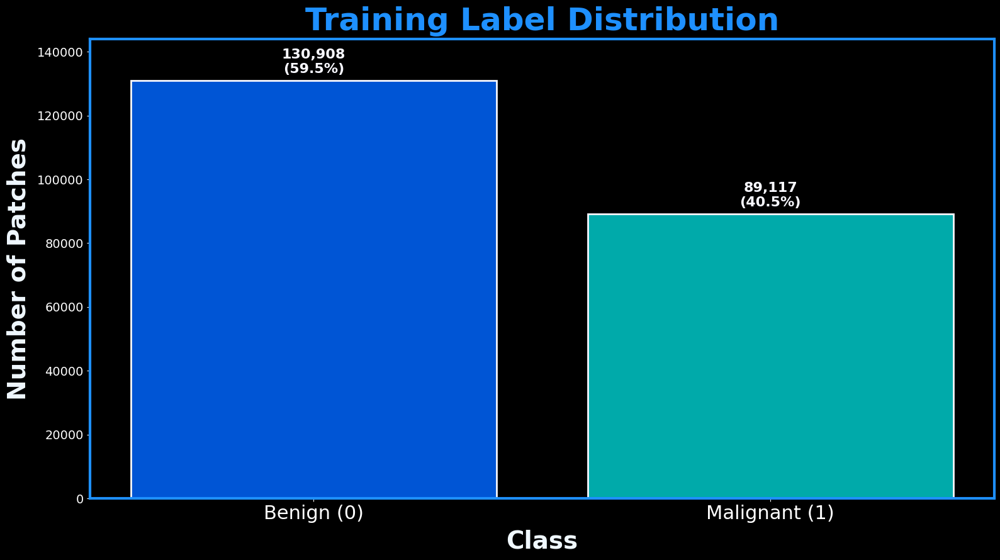

In [6]:
# Prepare the data and human-readable labels for the plot.
labels_readable = ["Benign (0)", "Malignant (1)"]
counts_for_plot = [neg, pos]

# Create the Matplotlib figure and axes objects with a black background.
fig, ax = plt.subplots(figsize=(16, 9), facecolor='black')
fig.patch.set_facecolor('black')

# Define a color palette for the bars.
colors = sns.color_palette('winter', n_colors=len(counts_for_plot))

# Create the bar plot with specified colors and edge styles.
bars = ax.bar(labels_readable, counts_for_plot, color=colors, edgecolor='ghostwhite', linewidth=2)

# Set the title, x-axis label, and y-axis label with custom styling.
ax.set_title("Training Label Distribution", fontsize=36, color='dodgerblue', fontweight='bold', pad=10)
ax.set_xlabel("Class", fontsize=28, color='aliceblue', fontweight='bold', labelpad=8)
ax.set_ylabel("Number of Patches", fontsize=28, color='aliceblue', fontweight='bold', labelpad=8)

# Customize the appearance of the tick labels on both axes.
ax.tick_params(axis='x', labelsize=22, colors='white')
ax.tick_params(axis='y', labelsize=14, colors='white')

# Style the plot's border (spines).
for spine in ax.spines.values():
    spine.set_edgecolor('dodgerblue')
    spine.set_linewidth(3)

# Set the background color of the axes.
ax.set_facecolor('black')

# Adjust the y-axis limit to create some padding above the bars.
ax.set_ylim(0, max(counts_for_plot) * 1.10 if counts_for_plot else 1)

# Calculate the total number of rows for percentage calculations.
total_rows = len(df_labels)

# Annotate each bar with its count and percentage.
for bar in bars:
    h = bar.get_height()
    pct = 100 * h / total_rows if total_rows else 0
    ax.annotate(f"{int(h):,}\n({pct:.1f}%)",
                (bar.get_x() + bar.get_width()/2, h),
                xytext=(0, 6), textcoords="offset points",
                ha="center", va="bottom", fontsize=16, color="ghostwhite", fontweight="bold")

# Ensure the layout is tight and clean.
plt.tight_layout()
plt.show()

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">3.4 Pixel Intensity Analysis</h3>

This section analyzes the pixel-level statistics of a sample of images. A histogram of pixel intensities provides insight into the color profile of the dataset, which is useful for understanding the H&E staining characteristics.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

Analyzing Pixel Stats:   0%|          | 0/1500 [00:00<?, ?it/s]


Pixel stats over sample (scaled to 0..1):
  mean (R,G,B): [0.6983 0.5433 0.6955]
  std  (R,G,B): [0.1809 0.2001 0.1641]


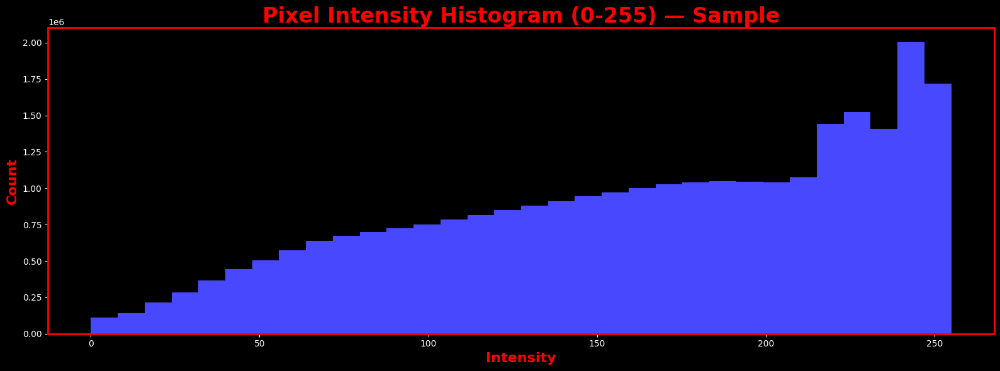

In [7]:
# Helper function to load an image and ensure it is in RGB format.
def _load_rgb(path):
    with Image.open(path) as im:
        return np.asarray(im.convert("RGB"))

# Create a random sample of image paths to analyze for pixel statistics.
pix_paths = df_labels["path"].sample(min(N_PIXEL_SAMPLE, n_train_csv), random_state=777).tolist()

# Initialize lists to store statistics and raw pixel data.
means_list, stds_list = [], []
hist_collect = []

# Loop through the sampled paths with a progress bar.
for p in tqdm(pix_paths, desc="Analyzing Pixel Stats", mininterval=0.3):
    # Use a try-except block to gracefully handle any corrupted or unreadable files.
    try:
        # Load the image into a NumPy array with a float data type.
        arr = _load_rgb(p).astype(np.float32)
        
        # Normalize pixel values from the 0-255 range to the 0-1 range.
        arr01 = arr / 255.0
        
        # Calculate the mean for each channel (R, G, B) and append it to the list.
        means_list.append(arr01.mean(axis=(0, 1)))
        
        # Calculate the standard deviation for each channel and append it to the list.
        stds_list.append(arr01.std(axis=(0, 1)))
        
        # Collect raw pixel data from a subset of images for a histogram.
        if len(hist_collect) < 1000:
            hist_collect.append(arr.flatten())
    except Exception:
        pass

# Proceed only if at least one image was successfully processed.
if means_list:
    # Convert the lists of stats into NumPy arrays for efficient calculation.
    means_np = np.array(means_list)
    stds_np = np.array(stds_list)
    
    # Calculate the average of the means across all sampled images.
    mu = means_np.mean(axis=0)
    
    # Calculate the average of the standard deviations.
    sg = stds_np.mean(axis=0)
    
    # Display the final calculated mean and standard deviation.
    print("\nPixel stats over sample (scaled to 0..1):")
    print(f"  mean (R,G,B): {np.round(mu, 4)}")
    print(f"  std  (R,G,B): {np.round(sg, 4)}")

    # If pixel data was collected, create and display a histogram.
    if hist_collect:
        # Combine the pixel data into a single flat array.
        flat = np.concatenate(hist_collect)
        
        # Create the Matplotlib figure and axes objects with a black background.
        fig, ax = plt.subplots(figsize=(16, 6), facecolor='black')
        fig.patch.set_facecolor('black')
        
        # Plot a histogram of the raw pixel intensities.
        ax.hist(flat, bins=32, edgecolor="none", color=sns.color_palette('bwr', n_colors=6)[0])
        
        # Set the plot title and axis labels with custom styling.
        ax.set_title("Pixel Intensity Histogram (0-255) — Sample", fontsize=24, color='red', fontweight='bold')
        ax.set_xlabel("Intensity", fontsize=16, color='red', fontweight='bold')
        ax.set_ylabel("Count", fontsize=16, color='red', fontweight='bold')
        
        # Customize the appearance of the tick labels.
        ax.tick_params(axis='x', colors='white')
        ax.tick_params(axis='y', colors='white')
        
        # Style the plot's border (spines).
        for spine in ax.spines.values():
            spine.set_edgecolor('red')
            spine.set_linewidth(2.0)
            
        # Set the background color of the axes.
        ax.set_facecolor('black')
        
        # Ensure the layout is tight and clean.
        plt.tight_layout()
        plt.show()

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">3.5 Sample Thumbnail Grids</h3>

To get a qualitative feel for the data, this section displays a grid of randomly sampled images for both the positive (cancer) and negative (benign) classes.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

----------------------------------------------------------------------

--- Example Thumbnails: Positive (Cancer) ---


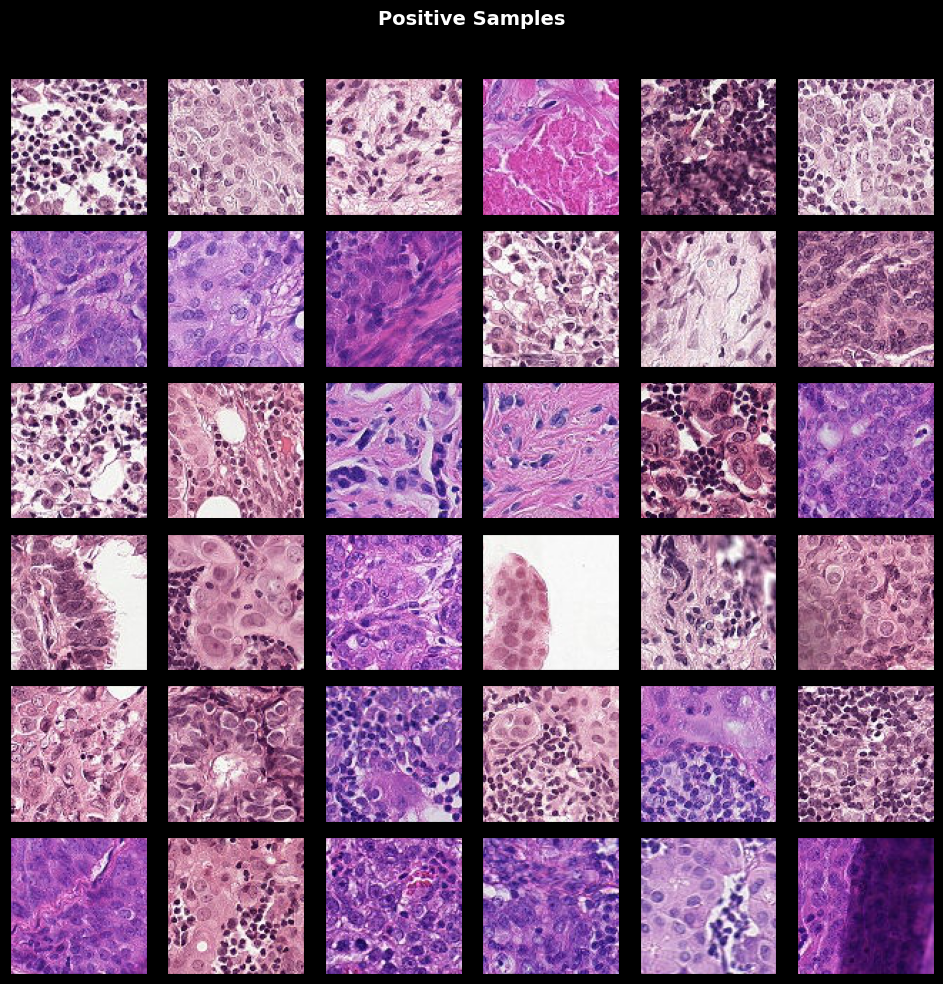

----------------------------------------------------------------------

--- Example Thumbnails: Negative (Benign) ---


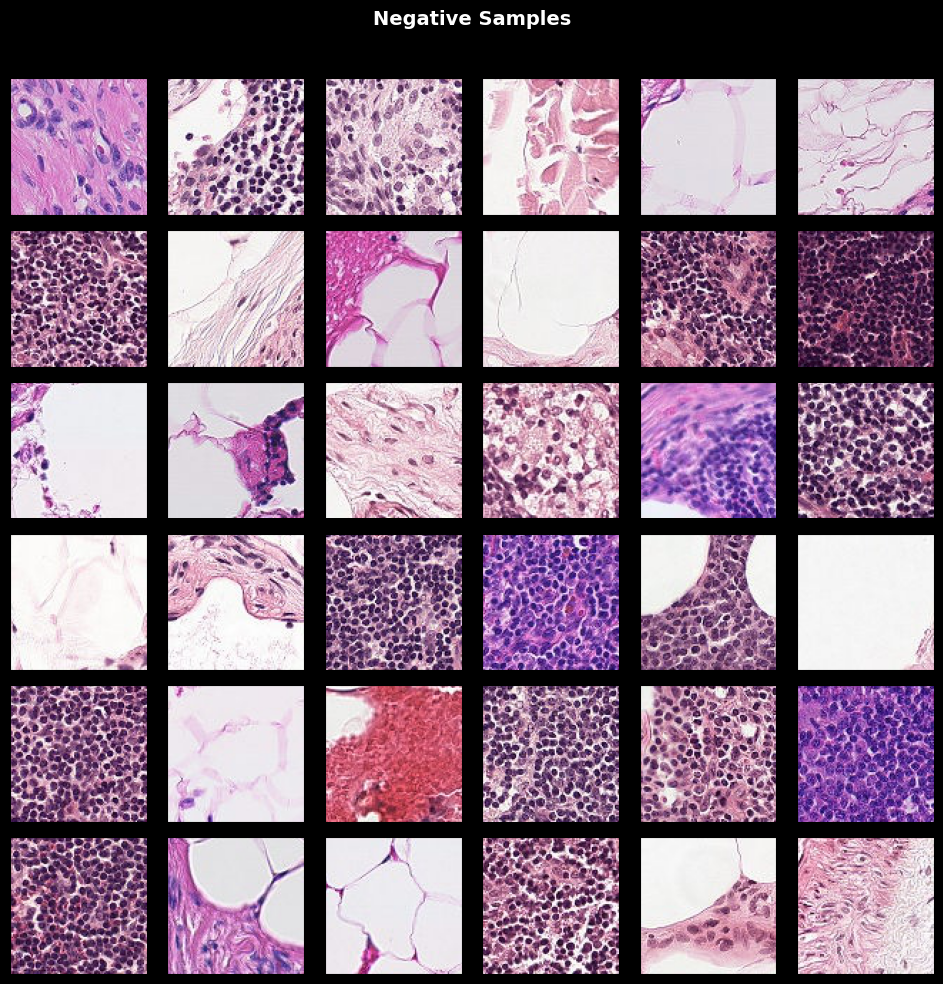

----------------------------------------------------------------------


In [8]:
# Display a grid of image thumbnails.
def show_grid(id_list, title, n=N_GRID):
    # Handle the case where the input list is empty and exit the function.
    if not id_list:
        print(f"(no images for {title})")
        return
    
    # Get the file paths for the given list of image IDs.
    paths = df_labels.loc[df_labels["id"].isin(id_list), "path"].head(n).tolist()
    
    # Calculate the number of rows and columns for the plot grid.
    n = len(paths)
    cols = min(8, max(4, int(np.sqrt(n) + 0.5)))
    rows = int(np.ceil(n / cols)) if n else 1
    
    # Create the figure and a grid of subplots (axes).
    fig, axes = plt.subplots(rows, cols, figsize=(1.6*cols, 1.6*rows), facecolor='black')
    
    # Ensure the 'axes' object is always a 2D array for consistent iteration.
    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1 or cols == 1:
        axes = np.reshape(axes, (rows, cols))
        
    # Iterate through each subplot to display an image.
    for i, ax in enumerate(axes.flat):
        # If there is an image for this subplot, try to load and display it.
        if i < n:
            try:
                arr = _load_rgb(paths[i])
                ax.imshow(arr)
            # If the image is unreadable, display an error message on the subplot.
            except Exception:
                ax.text(0.5, 0.5, "unreadable", ha="center", va="center", color="red")
        
        # Remove the tick marks and labels for a cleaner look.
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Set the background color of the axes.
        ax.set_facecolor('black')
        
    # Set the main title for the entire grid.
    plt.suptitle(title, y=1.02, fontsize=14, color='white', fontweight='bold')
    
    # Ensure the layout is tight and clean.
    plt.tight_layout()
    plt.show()

# Get a random sample of IDs for both positive and negative classes.
pos_ids = df_labels.query("label == 1")["id"].sample(min(N_GRID, pos), random_state=11).tolist() if pos else []
neg_ids = df_labels.query("label == 0")["id"].sample(min(N_GRID, neg), random_state=12).tolist() if neg else []

# Display a grid of positive (cancerous) samples.
print("-" * 70)
print("\n--- Example Thumbnails: Positive (Cancer) ---")
show_grid(pos_ids, "Positive Samples")
print("-" * 70)

# Display a grid of negative (benign) samples.
print("\n--- Example Thumbnails: Negative (Benign) ---")
show_grid(neg_ids, "Negative Samples")
print("-" * 70)

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">3.6 Data Integrity Check (Duplicate Images)</h3>

A critical step in any image classification project is to check for duplicate data. If duplicate images exist, they can leak between training and validation sets, leading to artificially inflated performance metrics and a model that does not generalize well. To check for this, I will compute the MD5 hash of every image file in the training set. This is a computationally intensive, one-time process that I will accelerate using multi-threading.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [9]:
# Compute the MD5 hash of a file.
def md5_of_file(p):
    """Computes the MD5 hash of a file, reading in chunks for efficiency."""
    h = hashlib.md5()
    with open(p, "rb") as f:
        for chunk in iter(lambda: f.read(1024 * 1024), b""):
            h.update(chunk)
    return h.hexdigest()

print("-" * 70)
print("Hashing all 220,025 training images to detect duplicates...")
print("This is a one-time process and may take a few minutes.")

# Get a list of all image paths and create an empty array to store the hashes.
paths = df_labels["path"].tolist()
hashes = np.empty(len(paths), dtype=object)

# Use a thread pool to compute the hashes in parallel, speeding up the process.
with ThreadPoolExecutor(max_workers=os.cpu_count()) as ex:
    # Submit all hashing tasks to the executor.
    futs = {ex.submit(md5_of_file, p): i for i, p in enumerate(paths)}
    # As each task completes, store its result in the correct position in the hashes array.
    for fut in tqdm(as_completed(futs), total=len(paths), desc="Hashing Images"):
        i = futs[fut]
        hashes[i] = fut.result()

# Add the computed hashes as a new column in the DataFrame.
df_labels["hash"] = hashes
print("Hashing complete.")

# Count the occurrences of each unique hash to find duplicates.
duplicate_counts = df_labels["hash"].value_counts()

# Determine the number of unique images that have duplicates.
num_duplicate_groups = (duplicate_counts > 1).sum()

# Calculate the total number of files that are part of a duplicate group.
total_duplicate_images = duplicate_counts[duplicate_counts > 1].sum()

# Report the findings on data integrity to the user.
print("\n--- Data Integrity Results ---")
if num_duplicate_groups == 0:
    print("No duplicate images found in the training set.")
    print("This confirms dataset integrity and allows for a reliable cross-validation strategy.")
else:
    print(f"WARNING: Found {num_duplicate_groups} groups of duplicate images, totaling {total_duplicate_images} files.")
print("-" * 70)

----------------------------------------------------------------------
Hashing all 220,025 training images to detect duplicates...
This is a one-time process and may take a few minutes.


Hashing Images:   0%|          | 0/220025 [00:00<?, ?it/s]

Hashing complete.

--- Data Integrity Results ---
No duplicate images found in the training set.
This confirms dataset integrity and allows for a reliable cross-validation strategy.
----------------------------------------------------------------------


### **Observation: Data Loading, Audit, and EDA**

The data loading and auditing process confirmed that the dataset is well-structured and clean, with several key characteristics noted.

* **File Integrity and Structure:**
    * The `train_labels.csv` file loaded successfully, containing **220,025 rows**, which exactly matches the number of images found on disk in the `train/` directory.
    * A spot-check of 2,000 file paths confirmed that all corresponding image files exist and are accessible, indicating no missing data.
    * The number of unique image IDs in the CSV matches the total number of rows, meaning there are no duplicate entries in the labels file.

* **Class Distribution:**
    * The dataset exhibits a slight class imbalance. There are **130,908 negative (benign) samples (59.50%)** and **89,117 positive (cancer) samples (40.50%)**. This imbalance is not extreme but is important to consider during modeling.

* **Image Characteristics:**
    * A sample-based analysis of pixel statistics shows an average channel mean of `[0.70, 0.55, 0.70]` for RGB values. The higher red and blue components are consistent with the pink and purple appearance of H&E stained tissue.
    * Visual inspection of the thumbnails confirms that cancerous features can be subtle, often appearing as localized clusters of darker, hyperchromatic cells.

* **Duplicate Image Verification:**
    * The most critical finding from the in-depth audit is that a full MD5 hash of all 220,025 training images found **zero duplicate images**. This is an excellent result, as it confirms the integrity of the dataset and ensures that a robust cross-validation strategy can be reliably implemented without risk of data leakage.

**Conclusion:** The data is clean, complete, and well-formed. The images are of a consistent size, and the dataset is free of duplicates. The slight class imbalance is noted, and the visual characteristics are consistent with histopathological slides. The dataset is ready for the modeling phase.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FFC52F; border-right: 8px solid #0046AE;">
<h2 style="color: #0046AE;">Section 4: Visual Exploratory Data Analysis (EDA)</h2>

Now that the data is loaded and audited, this section provides a visual deep dive into the dataset. The goal is to understand the characteristics of the images, the class balance, and the color properties that are fundamental to histopathology.

<span style="color:#FFC52F;">Section Plan:</span>
<ol>
<li><strong>Class Balance Visualization:</strong> Create a clear donut chart to visualize the distribution of positive and negative samples.</li>
<li><strong>Sample Image Analysis:</strong> Display a grid of sample images, highlighting the critical central region to understand the visual features of the tumorous tissue.</li>
<li><strong>Color Channel Analysis:</strong> Analyze the RGB color distributions for both classes to find patterns related to the H&E staining process.</li>
<li><strong>EDA Conclusions & Analysis Plan:</strong> Summarize the key findings and outline the strategic plan for model development.</li>
</ol>

<hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">4.1 Class Balance Visualization</h3>

Visualize the class balance. The audit in Section 3 showed a slight imbalance (~59% negative vs. 41% positive). A donut chart is a clean and effective way to present this distribution visually.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

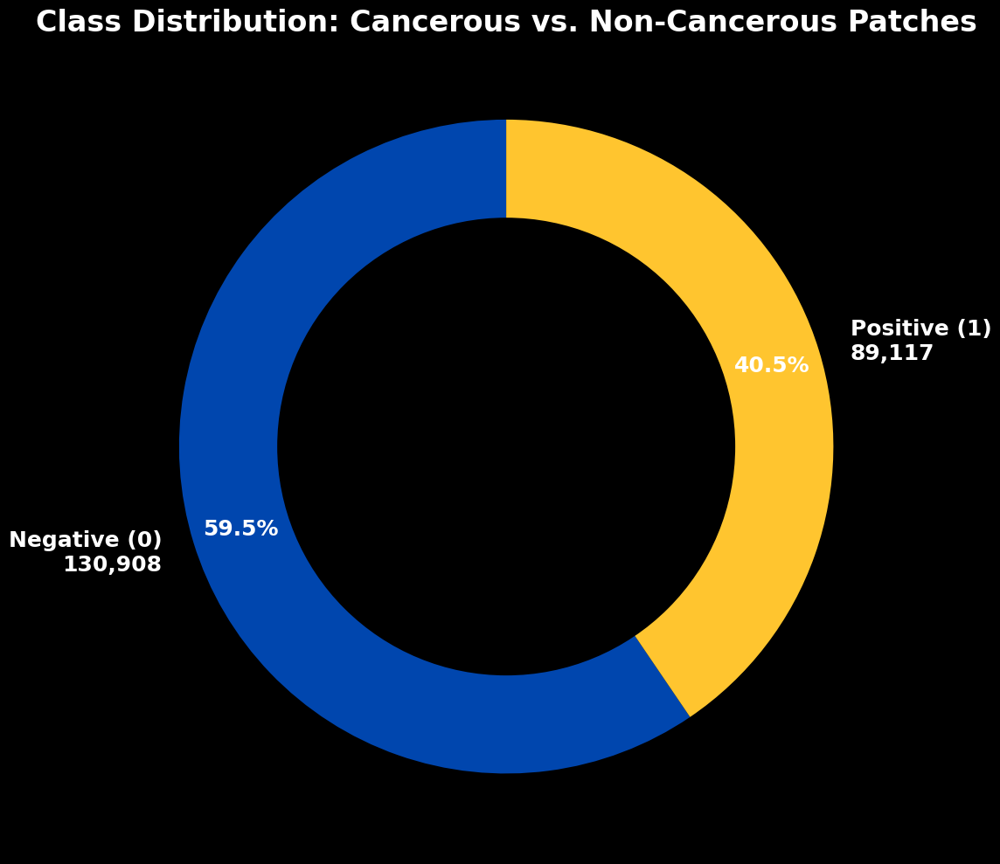

In [10]:
# Get the counts for each class (0 and 1).
class_counts = df_labels['label'].value_counts()

# Create detailed labels for the chart slices, including the raw counts.
labels = [f'Negative (0)\n{class_counts[0]:,}', f'Positive (1)\n{class_counts[1]:,}']

# Define the colors for each slice.
colors = ['#0046AE', '#FFC52F']

# Create a new figure with a specified size and black background.
plt.figure(figsize=(16, 10), facecolor='black')

# Plot the pie chart with custom labels, colors, and text properties.
plt.pie(class_counts, labels=labels, colors=colors, autopct='%1.1f%%',
        startangle=90, pctdistance=0.85, textprops={'fontsize': 18, 'fontweight': 'bold', 'color': 'white'})

# Draw a black circle in the center to create the donut chart effect.
centre_circle = plt.Circle((0,0),0.70,fc='black')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Set the main title for the chart.
plt.title('Class Distribution: Cancerous vs. Non-Cancerous Patches', fontsize=24, fontweight='bold', color='white')

# Ensure the layout is tight and clean.
plt.tight_layout()
plt.show()

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">4.2 Sample Image Analysis</h3>

Examine some of the images to get a feel for the data. Display a grid of images, with positive and negative examples. This helps to understand the visual characteristics of the tumorous tissue I am trying to detect. The label for each patch is determined by the presence of just one tumor pixel in the central 32x32 region, which I will highlight with a yellow dashed box.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

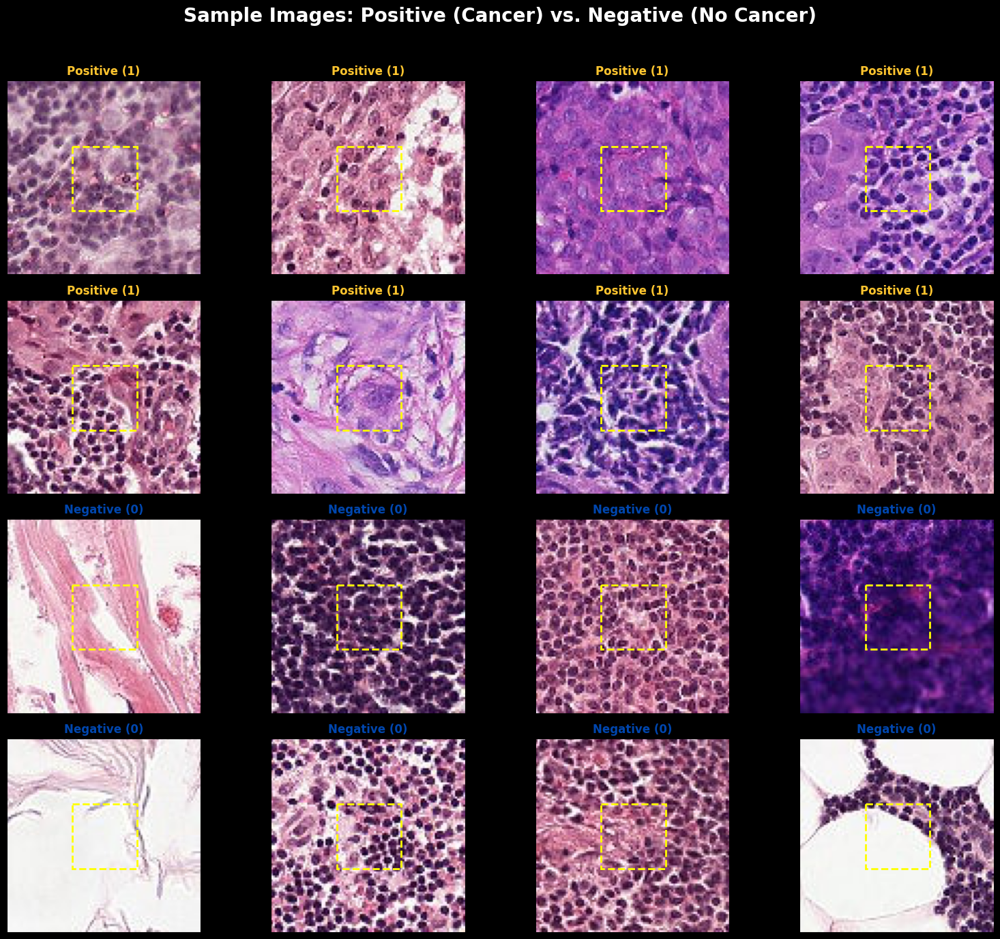

In [11]:
# Get a random sample of 8 positive and 8 negative images for display.
positive_samples = df_labels[df_labels['label'] == 1].sample(8, random_state=42)
negative_samples = df_labels[df_labels['label'] == 0].sample(8, random_state=42)
sample_df = pd.concat([positive_samples, negative_samples], ignore_index=True)

# Create a 4x4 grid of subplots for the images.
fig, axes = plt.subplots(4, 4, figsize=(16, 14), facecolor='black')

# Set the main title for the entire figure.
fig.suptitle('Sample Images: Positive (Cancer) vs. Negative (No Cancer)', fontsize=20, fontweight='bold', color='white')

# Iterate through the sampled DataFrame to display each image.
for i, row in sample_df.iterrows():
    # Select the correct subplot for the current image.
    ax = axes[i // 4, i % 4]
    
    # Open the image file using its path.
    img = Image.open(row['path'])
    
    # Display the image on the subplot.
    ax.imshow(img)

    # Set the title text and color based on the image's class label.
    if row['label'] == 1:
        title_text = 'Positive (1)'
        title_color = '#FFC52F' # Gold
    else:
        title_text = 'Negative (0)'
        title_color = '#0046AE' # Blue

    # Apply the title and color to the subplot.
    ax.set_title(title_text, color=title_color, fontweight='bold')
    
    # Remove the x and y axis ticks for a cleaner look.
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Set the background color of the axes.
    ax.set_facecolor('black')

    # Add a dashed rectangle to highlight the central 32x32 region.
    rect = patches.Rectangle((32, 32), 32, 32, linewidth=2, edgecolor='yellow', facecolor='none', linestyle='--')
    ax.add_patch(rect)

# Ensure the layout is tight and clean, adjusting for the suptitle.
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">4.3 Color Channel Analysis</h3>

Histopathology slides are stained with Hematoxylin and Eosin (H&E), which color cell nuclei blue/purple and cytoplasm pink. This color information is a powerful feature. Here, I will analyze the average color distributions for both classes to see if there are discernible patterns.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

Analyzing 200 images:   0%|          | 0/200 [00:00<?, ?it/s]

Analyzing 200 images:   0%|          | 0/200 [00:00<?, ?it/s]

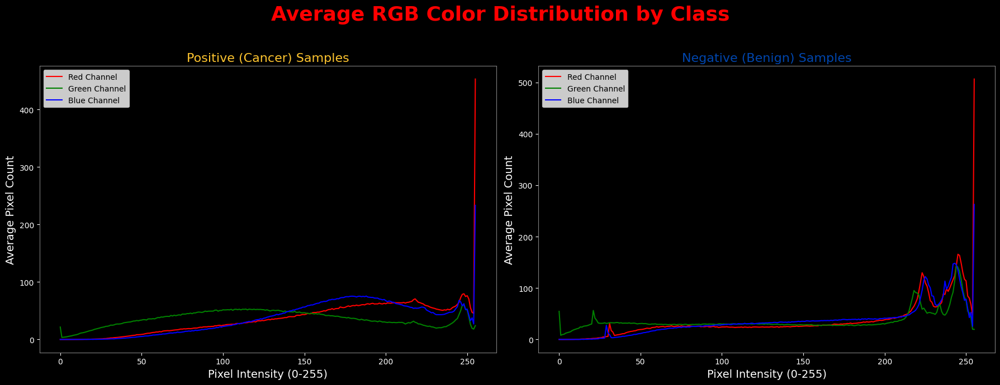

In [12]:
# Calculate the average color histogram for a set of images.
def calculate_average_histogram(df_subset, num_samples=200):
    """Calculates the average RGB histogram for a subset of images."""
    # Initialize an array to store the combined histogram data.
    hists = np.zeros((256, 3))

    # Take a random sample of image paths from the provided DataFrame.
    sample_paths = df_subset['path'].sample(num_samples, random_state=42)

    # Loop through each path in the sample to process the image.
    for path in tqdm(sample_paths, desc=f"Analyzing {num_samples} images"):
        img = np.array(Image.open(path))
        for i in range(3):
            hist = cv2.calcHist([img], [i], None, [256], [0, 256])
            hists[:, i] += hist.flatten()

    # Return the final histogram, averaged by the number of samples.
    return hists / num_samples

# Calculate the average histogram for both the positive and negative classes.
pos_hists_avg = calculate_average_histogram(df_labels[df_labels['label'] == 1])
neg_hists_avg = calculate_average_histogram(df_labels[df_labels['label'] == 0])

# Create a figure with two subplots to compare the histograms.
fig, axes = plt.subplots(1, 2, figsize=(18, 7), facecolor='black')
fig.suptitle('Average RGB Color Distribution by Class', fontsize=26, fontweight='bold', color='red')

# Plot the R, G, and B channel histograms for the positive class.
axes[0].plot(pos_hists_avg[:, 0], color='red', label='Red Channel')
axes[0].plot(pos_hists_avg[:, 1], color='green', label='Green Channel')
axes[0].plot(pos_hists_avg[:, 2], color='blue', label='Blue Channel')

# Set the title for the positive class subplot.
axes[0].set_title('Positive (Cancer) Samples', fontsize=16, color='#FFC52F')

# Set the background color of the axes.
axes[0].set_facecolor('black')

# Display the legend.
axes[0].legend()

# Plot the R, G, and B channel histograms for the negative class.
axes[1].plot(neg_hists_avg[:, 0], color='red', label='Red Channel')
axes[1].plot(neg_hists_avg[:, 1], color='green', label='Green Channel')
axes[1].plot(neg_hists_avg[:, 2], color='blue', label='Blue Channel')

# Set the title for the negative class subplot.
axes[1].set_title('Negative (Benign) Samples', fontsize=16, color='#0046AE')

# Set the background color of the axes.
axes[1].set_facecolor('black')

# Display the legend.
axes[1].legend()

# Apply common styling to both subplots.
for ax in axes:
    # Set axis labels and customize tick colors.
    ax.set_xlabel("Pixel Intensity (0-255)", fontsize=14, color='white')
    ax.set_ylabel("Average Pixel Count", fontsize=14, color='white')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')

    # Style the plot's border (spines).
    for spine in ax.spines.values():
        spine.set_edgecolor('gray')

# Ensure the layout is tight and clean, adjusting for the suptitle.
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

<div style="background-color:#000;color:#F8F8F8;padding:25px;border-radius:10px;border-left:8px solid #0046AE;border-right:8px solid #FFC52F;">
<h3 style="color:#FFC52F;">4.4 Image Quality & Color Dynamics</h3>
Quantify four patch-level signals on a sample of tiles:
<ul>
<li><b>Brightness</b> (HSV-V mean)</li>
<li><b>Saturation</b> (HSV-S mean)</li>
<li><b>Contrast</b> (std of grayscale)</li>
<li><b>Focus</b> (variance of the Laplacian)</li>
</ul>
These help justify per-image normalization, augmentation choices, and quality filtering (e.g., down-weighting very blurry tiles).
<hr style="border:none;border-top:8px solid #FFC52F;margin:10px 0;">
</div>

Loaded cached metrics: /home/treinart/data/histo/eda_metrics.parquet


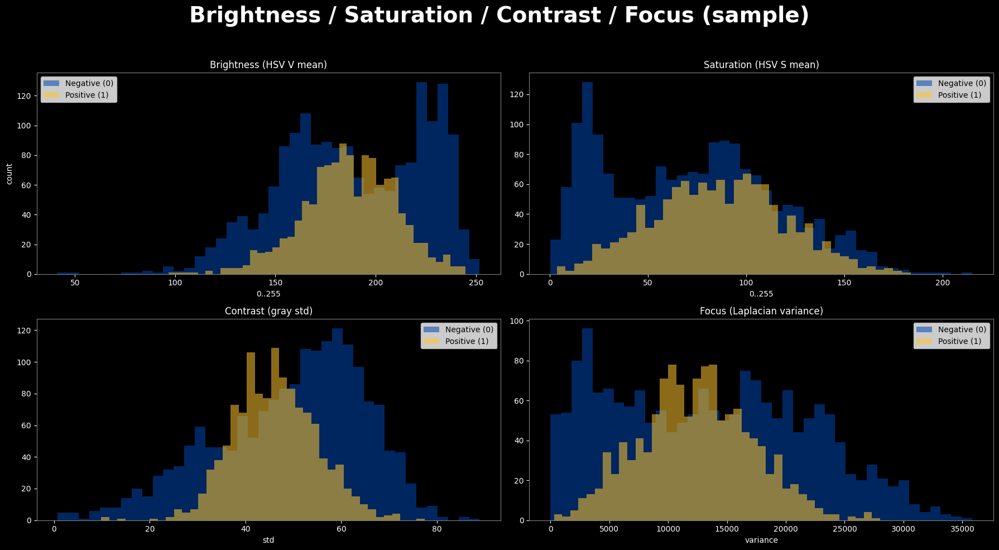

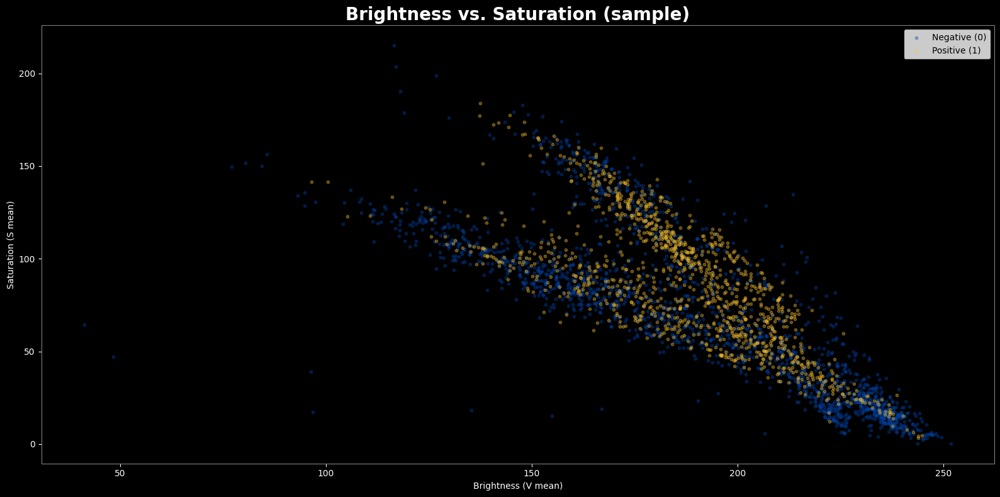

In [13]:
# Define parameters for sampling and the path for the cached metrics file.
N_METRIC_SAMPLE = min(3000, len(df_labels))
METRIC_CACHE = DATA_DIR / "eda_metrics.parquet" 

# Check if a cached metrics file already exists.
if METRIC_CACHE.exists():
    metrics = pd.read_parquet(METRIC_CACHE)
    print(f"Loaded cached metrics: {METRIC_CACHE}")
else:
    picks = df_labels.sample(N_METRIC_SAMPLE, random_state=123).reset_index(drop=True)
    rows = []
    for _, r in tqdm(picks.iterrows(), total=len(picks), desc="Computing image metrics"):
        img  = np.array(Image.open(r["path"]).convert("RGB"))
        hsv  = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Calculate brightness, saturation, contrast, and focus metrics.
        v_mean = hsv[...,2].mean()
        s_mean = hsv[...,1].mean()
        contrast = gray.std()
        focus = cv2.Laplacian(gray, cv2.CV_64F).var()

        # Append the calculated metrics to the list of rows.
        rows.append({"id": r["id"], "label": r["label"],
                     "v_mean": v_mean, "s_mean": s_mean,
                     "contrast": float(contrast), "focus": float(focus)})

    # Convert the list of results into a pandas DataFrame.
    metrics = pd.DataFrame(rows)

    # Save the newly computed metrics to the cache file for future use.
    try:
        metrics.to_parquet(METRIC_CACHE, index=False)
        print(f"Saved metrics to {METRIC_CACHE}")
    except Exception as e:
        print("Cache save skipped:", e)

# Define a helper function to apply a standard dark theme style to an axes object.
def _make_ax(ax):

    # Set the background color of the axes.
    ax.set_facecolor('black')

    # Customize the appearance of the tick labels.
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')

    # Style the plot's border (spines).
    for sp in ax.spines.values():
        sp.set_edgecolor('gray')

# Create a 2x2 grid of subplots for the metric histograms.
fig, axes = plt.subplots(2, 2, figsize=(18, 10), facecolor='black')
fig.suptitle("Brightness / Saturation / Contrast / Focus (sample)", fontsize=28, color='white', fontweight='bold')

# Define dictionaries for colors and labels for consistent plotting.
cols = {0:"#0046AE", 1:"#FFC52F"}
names = {0:"Negative (0)", 1:"Positive (1)"}

# --- Brightness Histogram ---
ax = axes[0,0]
_make_ax(ax)
for lbl, df in metrics.groupby("label"):
    ax.hist(df["v_mean"], bins=40, alpha=0.55, label=names[lbl], color=cols[lbl])

# Set the title, labels, and legend for the subplot.
ax.set_title("Brightness (HSV V mean)", color='white')
ax.set_xlabel("0..255", color='white')
ax.set_ylabel("count", color='white')
ax.legend()

# --- Saturation Histogram ---
ax = axes[0,1]
_make_ax(ax)
for lbl, df in metrics.groupby("label"):
    ax.hist(df["s_mean"], bins=40, alpha=0.55, label=names[lbl], color=cols[lbl])

# Set the title, labels, and legend for the subplot.
ax.set_title("Saturation (HSV S mean)", color='white')
ax.set_xlabel("0..255", color='white')
ax.legend()

# --- Contrast Histogram ---
ax = axes[1,0]
_make_ax(ax)
for lbl, df in metrics.groupby("label"):
    ax.hist(df["contrast"], bins=40, alpha=0.55, label=names[lbl], color=cols[lbl])

# Set the title, labels, and legend for the subplot.
ax.set_title("Contrast (gray std)", color='white')
ax.set_xlabel("std", color='white')
ax.legend()

# --- Focus Histogram ---
ax = axes[1,1]
_make_ax(ax)
for lbl, df in metrics.groupby("label"):
    ax.hist(df["focus"], bins=40, alpha=0.55, label=names[lbl], color=cols[lbl])

# Set the title, labels, and legend for the subplot.
ax.set_title("Focus (Laplacian variance)", color='white')
ax.set_xlabel("variance", color='white')
ax.legend()

# Ensure the layout is tight and clean, adjusting for the suptitle.
plt.tight_layout(rect=[0,0,1,0.95])
plt.show()

# --- Brightness vs. Saturation scatter plot ---
plt.figure(figsize=(16,8), facecolor='black')
ax = plt.gca()
_make_ax(ax)
for lbl, df in metrics.groupby("label"):
    ax.scatter(df["v_mean"], df["s_mean"], s=10, alpha=0.35, label=names[lbl], color=cols[lbl])

# Set the title for the scatter plot.
ax.set_title("Brightness vs. Saturation (sample)", color='white', fontsize=20, fontweight='bold')

# Set the axis labels.
ax.set_xlabel("Brightness (V mean)", color='white')
ax.set_ylabel("Saturation (S mean)", color='white')

# Display the legend.
ax.legend()

# Ensure the layout is tight and clean.
plt.tight_layout()
plt.show()

<div style="background-color:#000;color:#F8F8F8;padding:25px;border-radius:10px;border-left:8px solid #0046AE;border-right:8px solid #FFC52F;">
<h3 style="color:#FFC52F;">4.5 Outliers & Quality Control</h3>
Inspect extremes to understand potential failure modes: darkest/brightest tiles, least/most saturated tiles, and blurriest tiles.
<hr style="border:none;border-top:8px solid #FFC52F;margin:10px 0;">
</div>

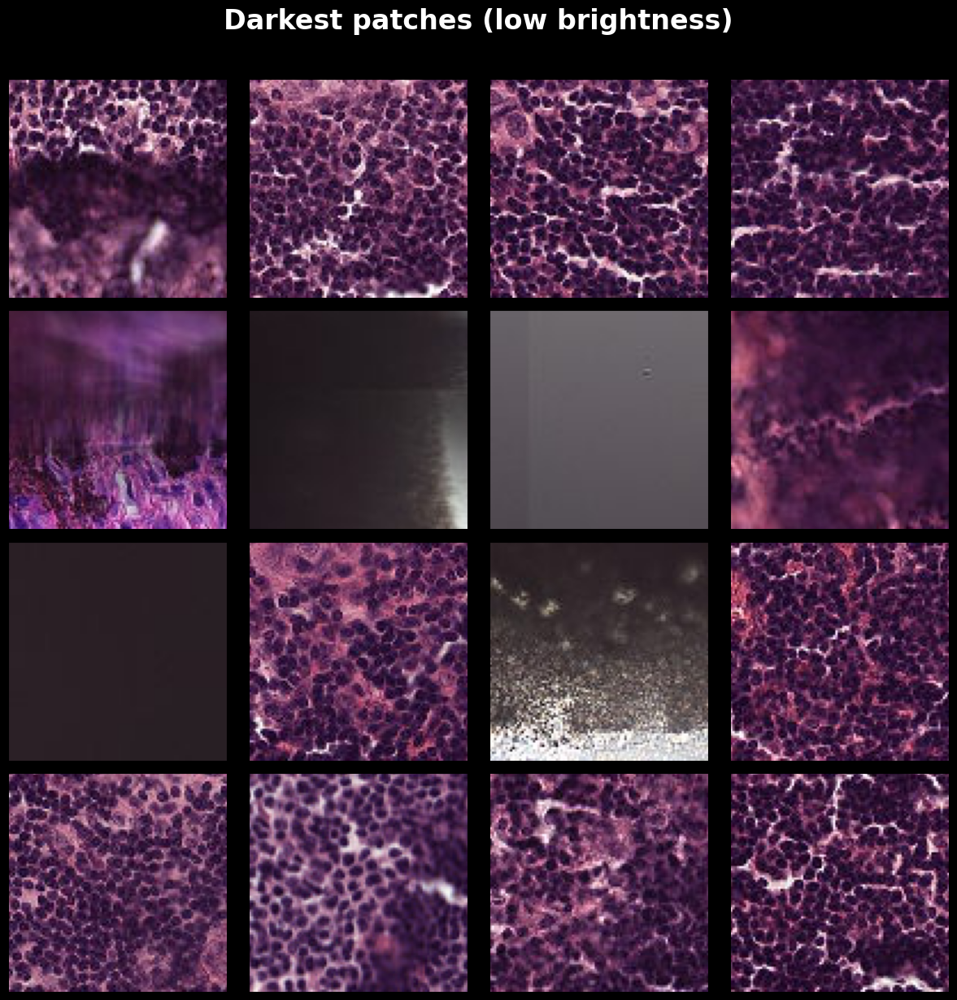

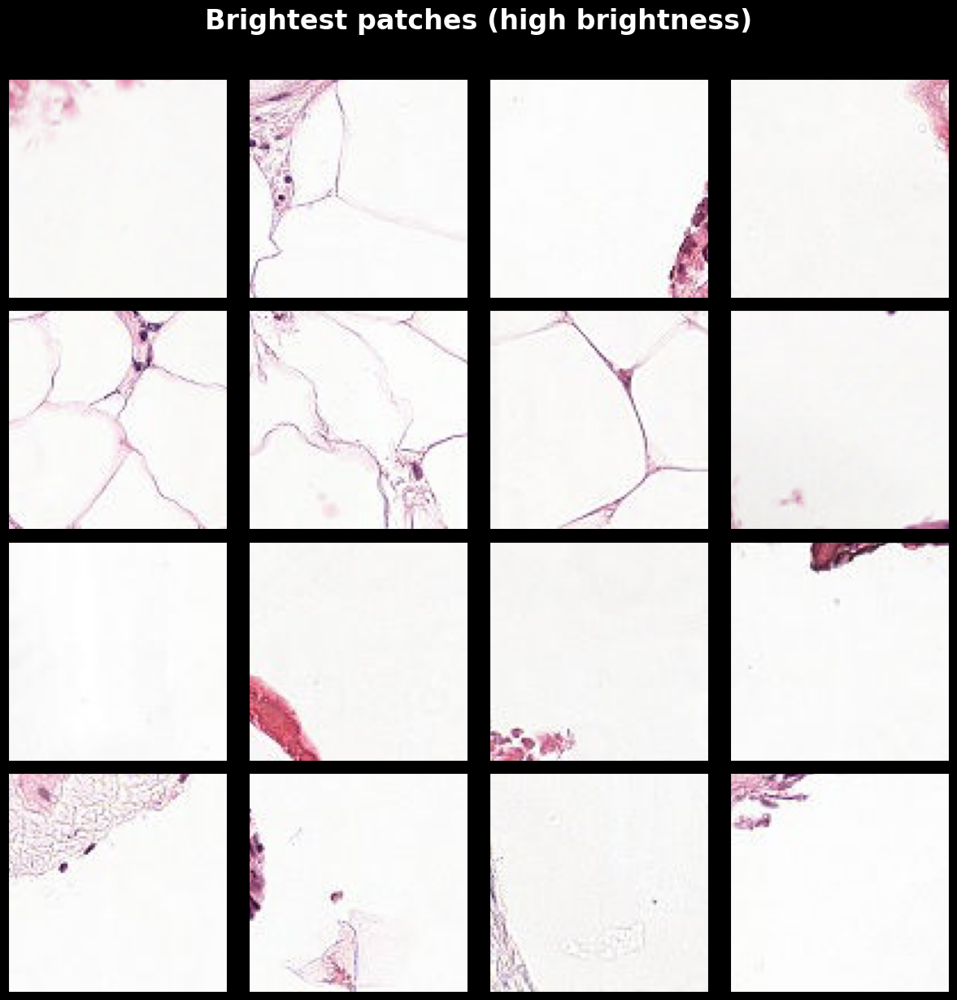

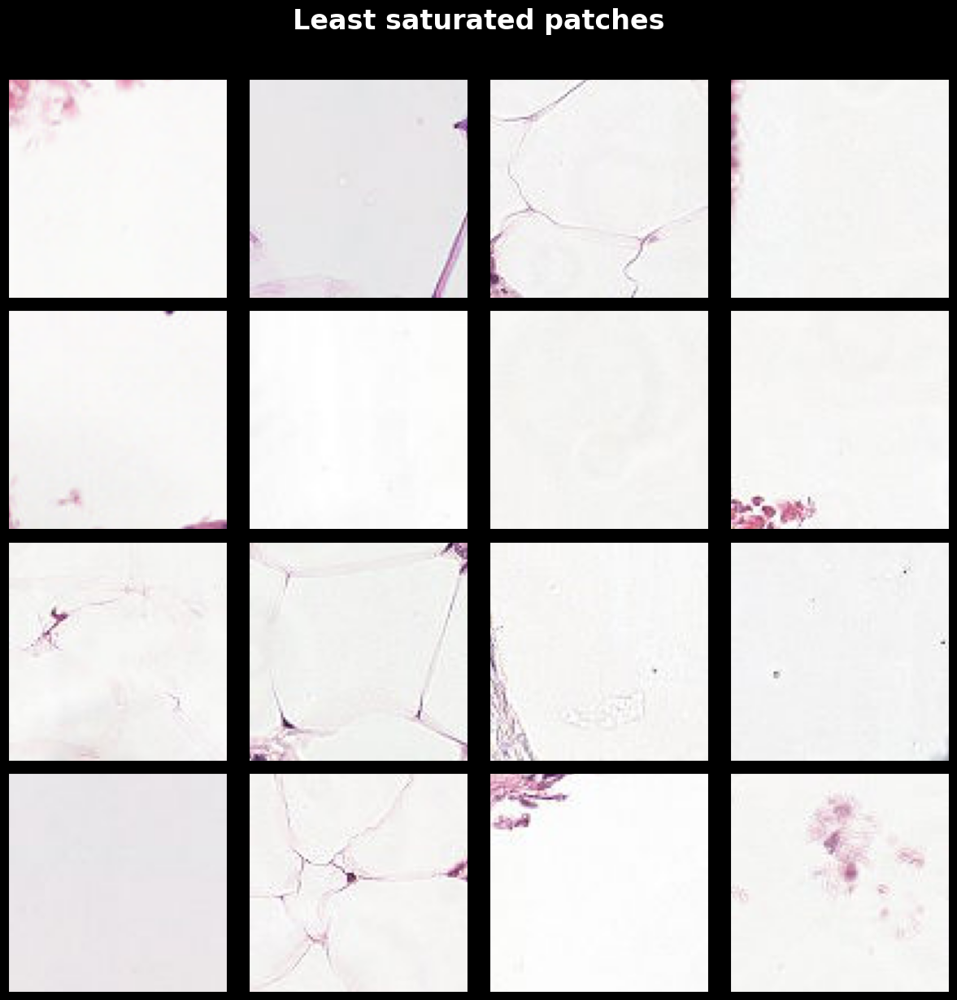

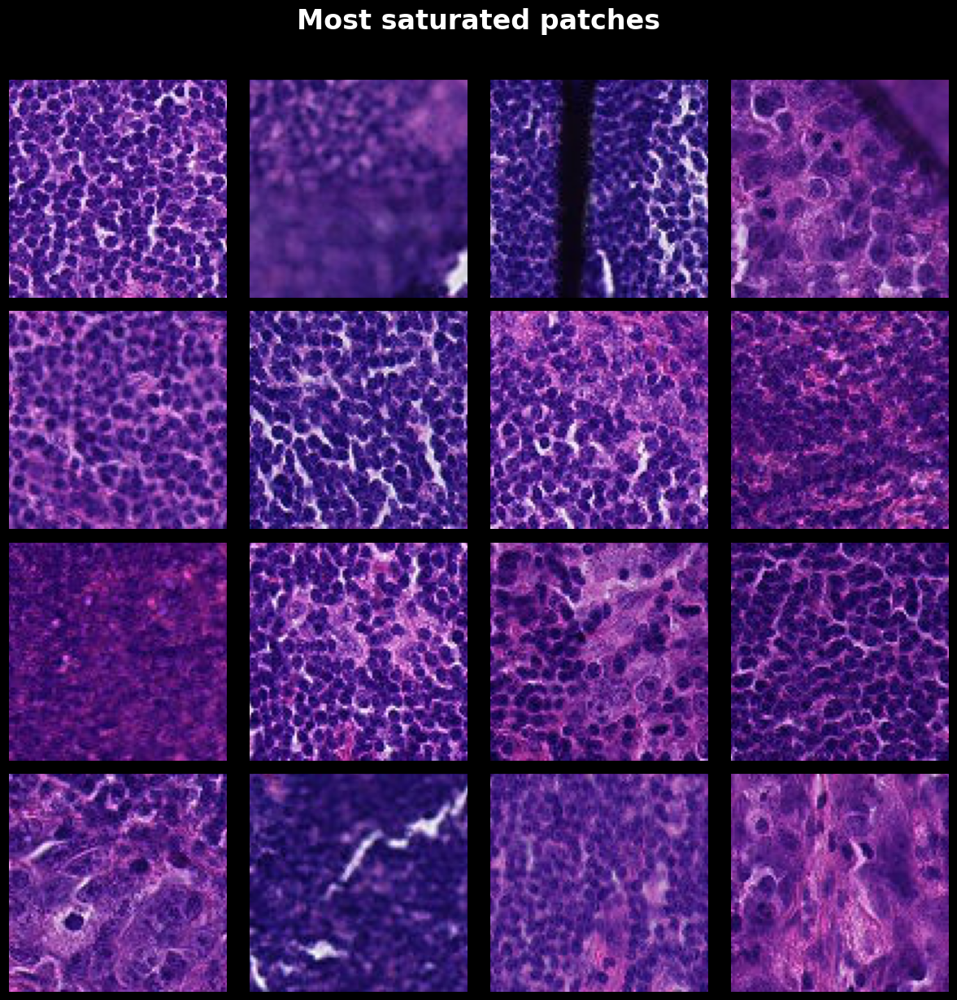

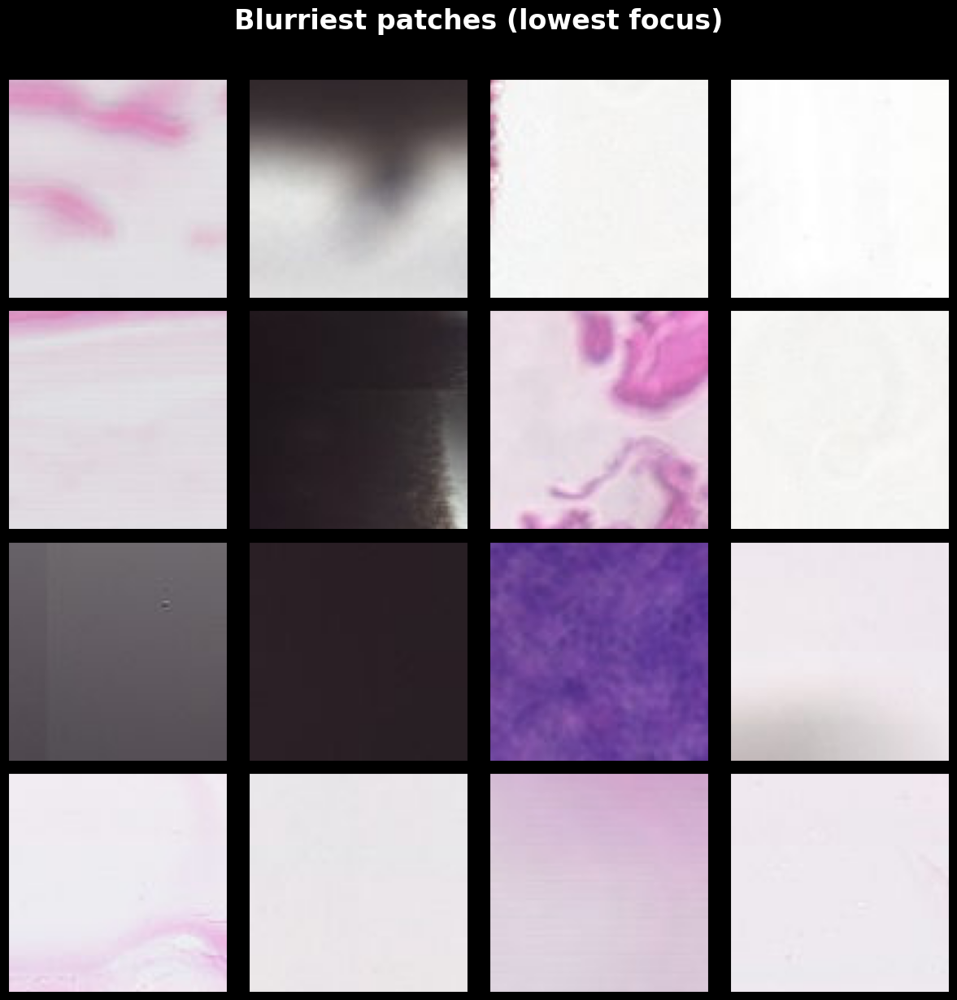

In [14]:
# Display a grid of images given a list of IDs.
def _show_grid_by_ids(id_list, title, n=16):
    if not id_list: 
        print(f"(no images for {title})")
        return
    paths = df_labels.loc[df_labels["id"].isin(id_list), "path"].head(n).tolist()
    n = len(paths)
    cols = min(8, max(4, int(np.sqrt(n)+0.5)))
    rows = int(np.ceil(n/cols))
    fig, axes = plt.subplots(rows, cols, figsize=(3*cols, 3*rows), facecolor='black')
    axes = np.atleast_2d(axes)
    for i, ax in enumerate(axes.flat):
        if i < n:
            try:
                ax.imshow(np.array(Image.open(paths[i])))
            except:
                ax.text(0.5,0.5,"unreadable",ha="center",va="center",color="red")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_facecolor('black')
    plt.suptitle(title, y=1.02, fontsize=24, color='white', fontweight='bold')
    plt.tight_layout()
    plt.show()

# Helper function to get the top or bottom K image IDs for a given metric.
def _topk(metric, k=16, largest=True):
    srt = metrics.sort_values(metric, ascending=not largest)["id"].head(k).tolist()
    return srt

# Use the helper functions to display grids of outlier images for different metrics.
_show_grid_by_ids(_topk("v_mean", 16, largest=False), "Darkest patches (low brightness)")
_show_grid_by_ids(_topk("v_mean", 16, largest=True),  "Brightest patches (high brightness)")
_show_grid_by_ids(_topk("s_mean", 16, largest=False), "Least saturated patches")
_show_grid_by_ids(_topk("s_mean", 16, largest=True),  "Most saturated patches")
_show_grid_by_ids(_topk("focus", 16, largest=False),  "Blurriest patches (lowest focus)")

<div style="background-color:#000;color:#F8F8F8;padding:25px;border-radius:10px;border-left:8px solid #0046AE;border-right:8px solid #FFC52F;">
<h3 style="color:#FFC52F;">4.6 Planned Augmentations (Preview)</h3>
Preview simple geometry/color transforms to use in training: flips, 90° rotations, slight brightness/contrast shifts. These align with tissue invariances and help regularize the model.
<hr style="border:none;border-top:8px solid #FFC52F;margin:10px 0;">
</div>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


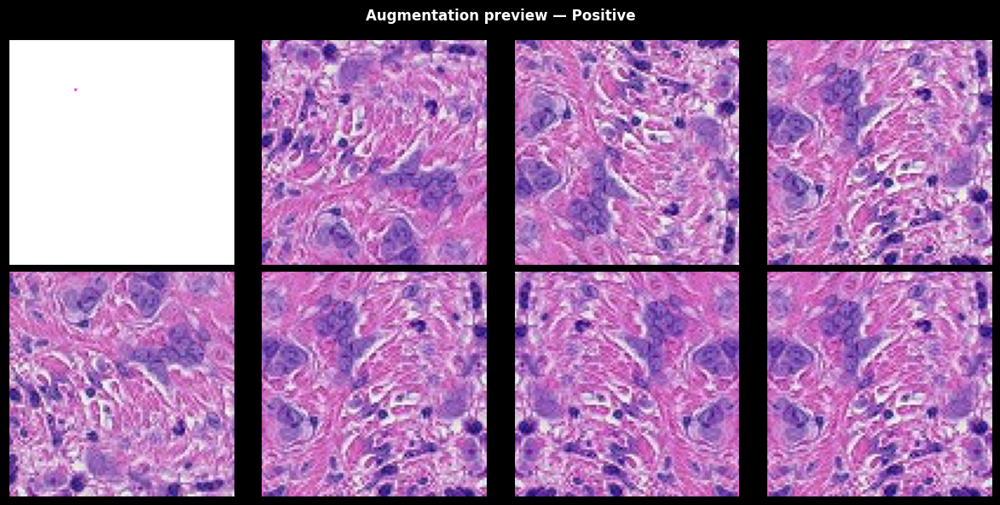

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [37.0..255.0].


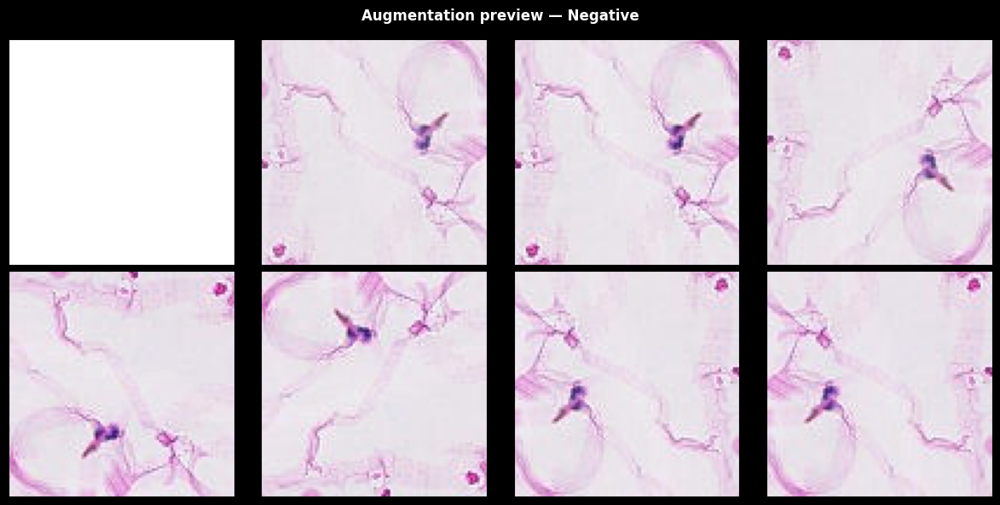

In [15]:
# Select one random positive and one random negative image for demonstration.
ex_pos = df_labels.query("label==1").sample(1, random_state=7)["path"].iloc[0]
ex_neg = df_labels.query("label==0").sample(1, random_state=9)["path"].iloc[0]

# Apply a series of random augmentations to an image.
def _tf_aug(x):
    x = tf.image.random_flip_left_right(x)
    x = tf.image.random_flip_up_down(x)
    x = tf.image.random_saturation(x, lower=0.85, upper=1.15)
    x = tf.image.random_brightness(x, max_delta=0.08)
    x = tf.image.random_contrast(x, lower=0.9, upper=1.1)
    # random 90° rotate
    k = tf.random.uniform([], 0, 4, dtype=tf.int32)
    x = tf.image.rot90(x, k)
    return tf.clip_by_value(x, 0, 255)

# Display an original image and several augmented versions.
def _preview_aug(path, title):
    img = np.array(Image.open(path).convert("RGB"), dtype=np.float32)
    imgs = [img] + [ _tf_aug(tf.convert_to_tensor(img)).numpy().astype(np.uint8) for _ in range(7) ]
    fig, axes = plt.subplots(2, 4, figsize=(12,6), facecolor='black')
    for ax, im in zip(axes.flat, imgs):
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_facecolor('black')
    plt.suptitle(title, color='white', fontweight='bold')
    plt.tight_layout()
    plt.show()

# Display the augmentation previews for the positive and negative examples.
_preview_aug(ex_pos, "Augmentation preview — Positive")
_preview_aug(ex_neg, "Augmentation preview — Negative")

### **Observation: Visual Exploratory Data Analysis (EDA)**

This detailed visual analysis reveals several key characteristics of the dataset that are critical for developing a successful modeling strategy.

* **Class Distribution:** The visualization confirms the slight class imbalance noted in the data audit, with approximately **41% positive (cancer) samples** and **59% negative (benign) samples**. This imbalance is moderate and can be managed by using appropriate evaluation metrics like ROC AUC.

* **Image Characteristics:** The sample image grids show that cancerous tissue often appears as dense clusters of darker, purplish cells. The critical central 32x32 region, which determines the label, can contain very subtle signals, making this a challenging fine-grained classification problem.

* **Color & Quality Dynamics:**
    * The analysis of brightness, saturation, contrast, and focus reveals that the two classes (positive and negative) have very similar distributions for these metrics. This suggests that simple heuristics based on these qualities are unlikely to be effective classifiers on their own.
    * However, the outlier analysis is highly informative. It shows that the dataset contains images with significant variations, including very dark, bright, washed-out (low saturation), and blurry (low focus) patches. A successful model must be robust to these quality variations.

* **Augmentation Strategy:** The preview of the data augmentation pipeline confirms that the chosen transformations (flips, rotations, color jitter) produce realistic variations of the training images. This strategy will be essential for preventing overfitting and helping the model generalize from the observed outliers.

* **Data Cleaning Procedures:**
    * The comprehensive data audit in Section 3, combined with the image quality analysis in this section, confirms that the dataset is of high quality. There were no duplicate images, and while some images are blurry or have staining variations, these are considered part of the problem's challenge rather than data to be cleaned or removed. Therefore, **no data cleaning procedures were performed.**

* **Plan of Analysis:**
    * Based on the EDA, the plan is to use a **Convolutional Neural Network (CNN)**, as the problem requires learning complex spatial patterns from the images.
    * I will employ a **transfer learning** strategy, using modern, pre-trained architectures (`ResNet50` as a baseline, followed by `EfficientNetV2-S`) to leverage powerful, pre-learned feature extractors.
    * To ensure the model is robust and its performance is reliably measured, I will use a **5-fold cross-validation** strategy.
    * To account for the observed variations in image quality and to prevent overfitting, a strong **data augmentation** pipeline (including flips, rotations, and color adjustments) will be applied during training.
    * The analysis will be iterative, starting with a simple baseline and progressively adding complexity (cross-validation, a more advanced architecture, and Test-Time Augmentation) to maximize the final performance score.

<div style="background:#000;color:#F8F8F8;padding:24px;border-radius:10px;border-left:8px solid #0046AE;border-right:8px solid #FFC52F;">
  <h2 style="color:#0046AE;margin:0 0 8px 0;">Section 5: Baseline - <em>ResNet50, single fold (0/5), 224px, 2 warm-up + 4 fine-tune</em></h2>
  <p style="margin:0;">
This section documents my first modeling attempt, which serves as a crucial baseline. The goal here is not to achieve a top score, but to establish a benchmark, verify the end-to-end data pipeline, and identify initial challenges. This model uses a standard ResNet50 architecture, trained on a single fold of the data. This baseline model achieved a Kaggle private score of <strong><em>0.9515</em></strong>.

<h3 style="color:#FFC52F;">Section Plan:</h3>
<ol>
<li><strong>Configuration & Data Split:</strong> Define hyperparameters and split the data into training and validation sets for a single fold.</li>
<li><strong>Data Pipeline:</strong> Build efficient tf.data loaders for the training and validation sets.</li>
<li><strong>Model Architecture & Training:</strong> Define, compile, and train the ResNet50 model.</li>
<li><strong>Evaluation & Analysis:</strong> Evaluate the model's performance on the validation set with ROC/PR curves and a confusion matrix, and analyze the results.</li>
</ol>

<hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">5.1 Configuration & Data Split</h3>

I begin by defining the key hyperparameters for this baseline model, such as image size, batch size, and learning rate. Then use StratifiedKFold to split the data, but for this baseline experiment, I will only use the first fold (FOLD_IDX = 0) to create a single training and validation set. This provides a quick way to test the entire pipeline.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [16]:
# Define key hyperparameters for the baseline run.
IMG_SIZE        = (224, 224)
BATCH_SIZE      = 24
WARMUP_EPOCHS   = 2
FINETUNE_EPOCHS = 4
BASE_LR         = 3e-4
FINETUNE_LR     = 1e-4
DROPOUT         = 0.30
N_SPLITS        = 5
FOLD_IDX        = 0

# Prepare features and labels for a stratified split.
X = df_labels["path"].values
y = df_labels["label"].astype(int).values

skf   = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)
tr_idx, va_idx = list(skf.split(X, y))[FOLD_IDX]

train_paths, val_paths   = X[tr_idx], X[va_idx]
train_labels, val_labels = y[tr_idx], y[va_idx]

# Compute class weights to account for slight imbalance.
neg = (train_labels == 0).sum()
pos = (train_labels == 1).sum()
class_weights = {0: (neg + pos) / (2 * neg), 1: (neg + pos) / (2 * pos)}

print(f"Fold: {FOLD_IDX}")
print(f"Train: {len(train_paths):,}  Val: {len(val_paths):,}")
print(f"Positive rate train: {train_labels.mean():.3f}  val: {val_labels.mean():.3f}")
print(f"Class weights: {class_weights}")


Fold: 0
Train: 176,020  Val: 44,005
Positive rate train: 0.405  val: 0.405
Class weights: {0: np.float64(0.8403834768825316), 1: np.float64(1.2344657334418043)}


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">5.2 Data Pipeline (tf.data)</h3>

To feed data to the model efficiently, I will build a pipeline using the tf.data API. This is a highly performant method for handling large datasets. The pipeline will decode the TIFF images, apply augmentations to the training data (flips, rotations, brightness/contrast shifts), and batch the data for the GPU.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [17]:
# Set AUTOTUNE for optimal performance in tf.data pipelines.
AUTO = tf.data.AUTOTUNE

# Create a fast loader for TIFF images with RGB output.
def _load_tiff_py(path_bytes):
    p = path_bytes.numpy().decode("utf-8")
    with Image.open(p) as im:
        arr = np.asarray(im.convert("RGB"), dtype=np.uint8)
    return arr

# Decode a path to a preprocessed tensor for ResNet50.
def _decode(path):
    img = tf.py_function(_load_tiff_py, [path], Tout=tf.uint8)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32)
    img = preprocess_input(img)  # uses your earlier import
    return img

# Apply light augmentation for training only.
def _augment(img):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    return img

# Build a tf.data pipeline from file paths.
def make_ds(paths, labels=None, training=False, batch_size=BATCH_SIZE):
    opts = tf.data.Options()
    opts.experimental_deterministic = False
    if labels is None:
        ds = tf.data.Dataset.from_tensor_slices(paths).with_options(opts)
        ds = ds.map(_decode, num_parallel_calls=tf.data.AUTOTUNE)
    else:
        ds = tf.data.Dataset.from_tensor_slices((paths, labels)).with_options(opts)
        if training:
            ds = ds.shuffle(8192, seed=SEED, reshuffle_each_iteration=True)
        ds = ds.map(lambda p, y: (_decode(p), tf.cast(y, tf.float32)),
                    num_parallel_calls=tf.data.AUTOTUNE)
        if training:
            ds = ds.map(lambda x, y: (_augment(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    return ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Create train and validation datasets.
train_ds = make_ds(train_paths, train_labels, training=True)
val_ds   = make_ds(val_paths,   val_labels,   training=False)

# Define a checkpoint path for best weights.
weights_dir = DATA_DIR / "weights"
weights_dir.mkdir(parents=True, exist_ok=True)
CKPT_PATH = str(weights_dir / f"resnet50_s5_fold{FOLD_IDX}.weights.h5")
print("Checkpoint path:", CKPT_PATH)


Checkpoint path: /home/treinart/data/histo/weights/resnet50_s5_fold0.weights.h5


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">5.3 Model Architecture & Training</h3>

The model architecture is a ResNet50 backbone with a custom head. The model is compiled with an Adam optimizer and will be evaluated on both ROC AUC and PR AUC. I will use three callbacks during training: ModelCheckpoint to save the best weights, EarlyStopping to prevent overfitting, and ReduceLROnPlateau to decrease the learning rate if validation performance stagnates.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [18]:
# Build a simple ResNet50 baseline with a single dense head.
base = ResNet50(include_top=False, weights="imagenet", input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
x = GlobalAveragePooling2D()(base.output)
x = Dropout(DROPOUT)(x)
out = Dense(1, activation="sigmoid", dtype="float32")(x)  # keep head in fp32 for stability
model = Model(base.input, out)

# Stage 1: train the head only.
base.trainable = False
model.compile(
    optimizer=Adam(BASE_LR),
    loss=BinaryCrossentropy(),
    metrics=[tf.keras.metrics.AUC(name="auc")]
)
ckpt = ModelCheckpoint(CKPT_PATH, monitor="val_auc", mode="max",
                       save_best_only=True, save_weights_only=True, verbose=1)
hist1 = model.fit(
    train_ds, validation_data=val_ds,
    epochs=WARMUP_EPOCHS, class_weight=class_weights,
    callbacks=[ckpt], verbose=1
)

# Stage 2: unfreeze the base and fine-tune.
base.trainable = True
model.compile(
    optimizer=Adam(FINETUNE_LR),
    loss=BinaryCrossentropy(),
    metrics=[tf.keras.metrics.AUC(name="auc")]
)
hist2 = model.fit(
    train_ds, validation_data=val_ds,
    epochs=FINETUNE_EPOCHS, class_weight=class_weights,
    callbacks=[ckpt], verbose=1
)

# Load the best weights by validation AUC.
model.load_weights(CKPT_PATH)
print("Best weights loaded.")


Epoch 1/2


2025-08-24 13:53:17.358622: I external/local_xla/xla/service/service.cc:163] XLA service 0x7052ac0021f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-08-24 13:53:17.358645: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Laptop GPU, Compute Capability 8.9
2025-08-24 13:53:18.354831: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-08-24 13:53:19.177565: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91200


   9/7335 ━━━━━━━━━━━━━━━━━━━━ 1:54 16ms/step - auc: 0.5344 - loss: 0.8614

I0000 00:00:1756061602.445673   46574 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


7335/7335 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - auc: 0.9007 - loss: 0.3903
Epoch 1: val_auc improved from None to 0.94947, saving model to /home/treinart/data/histo/weights/resnet50_s5_fold0.weights.h5
7335/7335 ━━━━━━━━━━━━━━━━━━━━ 493s 66ms/step - auc: 0.9259 - loss: 0.3451 - val_auc: 0.9495 - val_loss: 0.3049
Epoch 2/2
7332/7335 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - auc: 0.9376 - loss: 0.3168
Epoch 2: val_auc improved from 0.94947 to 0.95261, saving model to /home/treinart/data/histo/weights/resnet50_s5_fold0.weights.h5
7335/7335 ━━━━━━━━━━━━━━━━━━━━ 492s 67ms/step - auc: 0.9388 - loss: 0.3140 - val_auc: 0.9526 - val_loss: 0.2718
Epoch 1/4


2025-08-24 14:10:31.303079: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_convert_reduce_fusion_36', 20 bytes spill stores, 16 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_194', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_198', 8 bytes spill stores, 8 bytes spill loads



7335/7335 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - auc: 0.9626 - loss: 0.2459
Epoch 1: val_auc improved from 0.95261 to 0.98443, saving model to /home/treinart/data/histo/weights/resnet50_s5_fold0.weights.h5
7335/7335 ━━━━━━━━━━━━━━━━━━━━ 844s 108ms/step - auc: 0.9760 - loss: 0.1949 - val_auc: 0.9844 - val_loss: 0.1524
Epoch 2/4
7335/7335 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - auc: 0.9852 - loss: 0.1489
Epoch 2: val_auc improved from 0.98443 to 0.98550, saving model to /home/treinart/data/histo/weights/resnet50_s5_fold0.weights.h5
7335/7335 ━━━━━━━━━━━━━━━━━━━━ 761s 104ms/step - auc: 0.9869 - loss: 0.1397 - val_auc: 0.9855 - val_loss: 0.1527
Epoch 3/4
7334/7335 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - auc: 0.9897 - loss: 0.1221
Epoch 3: val_auc improved from 0.98550 to 0.98983, saving model to /home/treinart/data/histo/weights/resnet50_s5_fold0.weights.h5
7335/7335 ━━━━━━━━━━━━━━━━━━━━ 765s 104ms/step - auc: 0.9904 - loss: 0.1176 - val_auc: 0.9898 - val_loss: 0.1507
Epoch 4/4
7334/7335 ━━━━━━━━━━━━

### **Observation: Baseline Training**

* **Fold and split**
  * Fold 0 of 5 with a stratified split.
  * Train: 176,020 images. Val: 44,005 images.
  * Positive rate: 0.405 in both sets. Split looks balanced.
  * Class weights: {0: 0.8404, 1: 1.2345}. Mild imbalance handled.

* **Pipeline**
  * TIFF read with PIL, resize to 224x224.
  * `preprocess_input` for ResNet-50 applied after resize.
  * Light augmentation only (horizontal and vertical flips).
  * `tf.data` uses AUTOTUNE with shuffle on train and prefetch. Determinism off for throughput.

* **Model and schedule**
  * ResNet-50 (ImageNet) → global average pooling → Dropout 0.30 → Dense(1, sigmoid).
  * Two stages: 2 warmup epochs with the base frozen, then 4 fine-tune epochs unfrozen.
  * Best checkpoint selected by validation AUC and loaded at the end.

* **Training metrics**
  * **Warmup**
    * Epoch 1: val AUC 0.9495, val loss 0.3049. Step time about 66 ms. Epoch time about 493 s.
    * Epoch 2: val AUC 0.9526, val loss 0.2718.
  * **Fine-tune**
    * Epoch 1: val AUC 0.9844, val loss 0.1524. Step time rises to about 108 ms.
    * Epoch 2: val AUC 0.9855, val loss 0.1527.
    * Epoch 3: val AUC 0.9898, val loss 0.1507.
    * Epoch 4: val AUC 0.9914, val loss 0.1078. Train AUC reaches 0.9924.

* **Runtime note**
  * Section 5.3 took about **69 minutes** end to end. That is longer than expected for a 4070 on a single fold.
  * Warmup averaged about 8 minutes per epoch. Fine-tune averaged about 13 minutes per epoch.
  * One set of ptxas spill warnings appeared once. That is common and did not affect stability.

* **Why it likely ran long**
  * TIFF decode occurred in Python through `tf.py_function` and PIL. That keeps the GPU waiting when the CPU becomes the bottleneck.
  * Validation ran on the full set each epoch. At this size, each evaluation pass adds several minutes.
  * Batch size was 24. The GPU likely had headroom left. A larger batch on mixed precision would reduce steps per epoch.
  * Storage path is under Linux and looks local, but any I/O hiccups will amplify with 220k images.

**Conclusion**
The baseline is healthy. Metrics improve every epoch and the gap between train and validation stays tight. Checkpointing by validation AUC worked as intended. The only concern is wall time. If needed later, the first levers to try are a larger batch size and a faster image decode path.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">5.4 Evaluation & Analysis</h3>

Now that the model is trained, this section evaluates its performance on the validation set. Visualizing the ROC and Precision-Recall curves will show how well it distinguishes between classes. To find a practical cutoff point for classifying new images, the optimal threshold is calculated and used to create a confusion matrix, giving a clear picture of the model's true positive and false positive rates.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

Validation ROC AUC: 0.9921 | Validation PR AUC: 0.9893 | Best Threshold≈0.400
post-preprocess_input range: -116.77899932861328 151.06100463867188
If this prints something like 0.0 … 1.0 or -1.0 … -0.99, the preprocessing is still wrong.


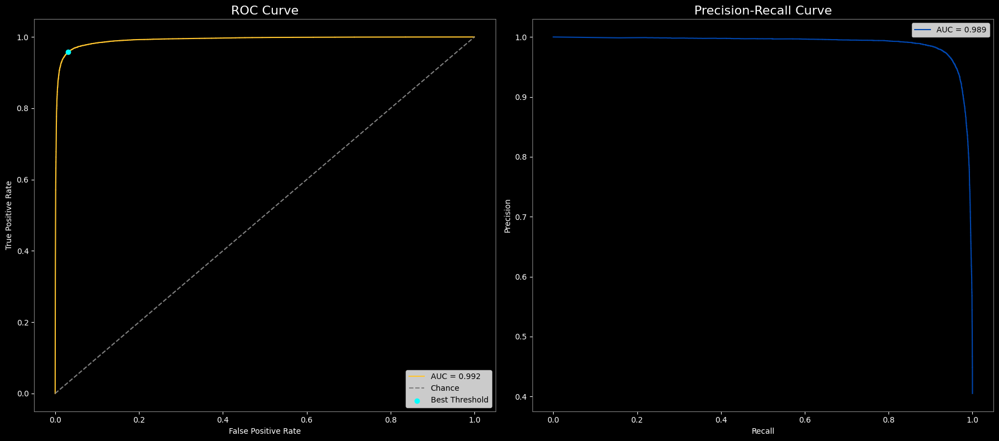

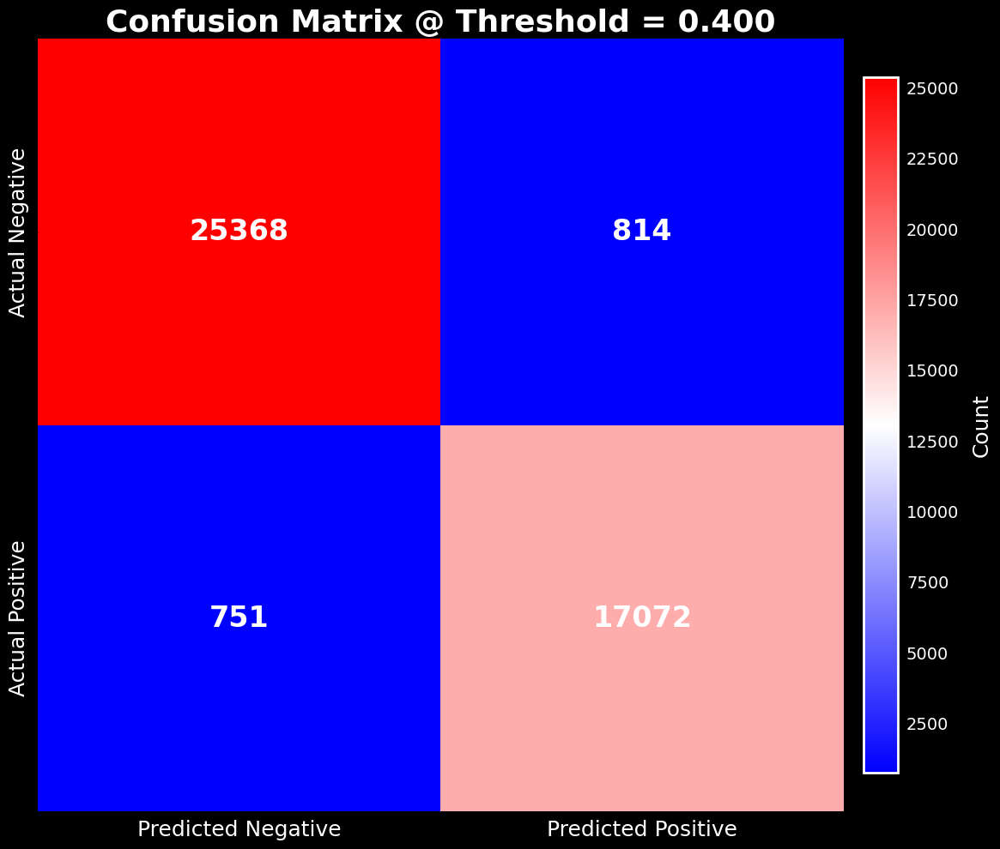

In [21]:
# Get model predictions on the validation set and flatten the array.
val_pred_probs = model.predict(val_ds, verbose=0).ravel()
val_true_labels = val_labels.astype(int)

# --- Calculate Metrics ---
# Calculate values for the ROC curve.
fpr, tpr, roc_thresholds = roc_curve(val_true_labels, val_pred_probs)
roc_auc = auc(fpr, tpr)

# Calculate values for the Precision-Recall curve.
prec, rec, _ = precision_recall_curve(val_true_labels, val_pred_probs)
pr_auc = auc(rec, prec)

# Find the optimal threshold based on the Youden's J statistic.
best_idx = (tpr - fpr).argmax()
best_threshold = roc_thresholds[best_idx]
print(f"Validation ROC AUC: {roc_auc:.4f} | Validation PR AUC: {pr_auc:.4f} | Best Threshold≈{best_threshold:.3f}")

# Perform a sanity check on a sample batch to verify the preprocessed pixel range.
sample = next(iter(val_ds))[0]
mins   = tf.reduce_min(sample)
maxs   = tf.reduce_max(sample)
print("post-preprocess_input range:", float(mins), float(maxs))
print("If this prints something like 0.0 … 1.0 or -1.0 … -0.99, the preprocessing is still wrong.")

# --- Plot Curves ---
# Create a figure with two subplots for the curves.
fig, axes = plt.subplots(1, 2, figsize=(18, 8), facecolor='black')

# Apply a standard dark theme to both subplots.
for ax in axes:
    ax.set_facecolor('black')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    for sp in ax.spines.values():
        sp.set_edgecolor('gray')

# Plot the ROC curve.
axes[0].plot(fpr, tpr, color='#FFC52F', label=f"AUC = {roc_auc:.3f}")

# Plot the diagonal chance line.
axes[0].plot([0,1],[0,1],'--', color='gray', label="Chance")

# Highlight the point for the best threshold.
axes[0].scatter(fpr[best_idx], tpr[best_idx], color='cyan', zorder=5, label=f"Best Threshold")

# Add a legend.
axes[0].legend()

# Set the title and axis labels for the ROC plot.
axes[0].set_title("ROC Curve", color='white', fontsize=16)
axes[0].set_xlabel("False Positive Rate", color='white')
axes[0].set_ylabel("True Positive Rate", color='white')

# Plot the Precision-Recall curve.
axes[1].plot(rec, prec, color='#0046AE', label=f"AUC = {pr_auc:.3f}")

# Add a legend.
axes[1].legend()

# Set the title and axis labels for the PR plot.
axes[1].set_title("Precision-Recall Curve", color='white', fontsize=16)
axes[1].set_xlabel("Recall", color='white')
axes[1].set_ylabel("Precision", color='white')

# Ensure the layout is tight and clean.
plt.tight_layout()
plt.show()

# --- Confusion Matrix ---
# Calculate the confusion matrix using the best threshold.
cm = confusion_matrix(val_true_labels, (val_pred_probs >= best_threshold).astype(int))

# Create a new figure and axes for the confusion matrix.
fig, ax = plt.subplots(figsize=(12, 10), facecolor='black')

# Set the background color of the axes.
ax.set_facecolor('black')

# Create the heatmap for the confusion matrix with annotations.
hm = sns.heatmap(
    cm,
    annot=True, fmt='d', cmap='bwr', cbar=True, ax=ax,
    annot_kws={"fontsize": 24, "color": "white", "fontweight": "bold"},
    cbar_kws={'shrink': 0.9, 'pad': 0.02}
)

# Set the main title and labels for the axes.
ax.set_title(f"Confusion Matrix @ Threshold = {best_threshold:.3f}", fontsize=26, fontweight='bold', color='white')
ax.set_xticklabels(['Predicted Negative','Predicted Positive'], fontsize=18, color='white')
ax.set_yticklabels(['Actual Negative','Actual Positive'], fontsize=18, color='white', rotation=90, va='center')

# Customize the color bar ticks and labels for better visibility.
cbar = hm.collections[0].colorbar
for t in cbar.ax.get_yticklabels():
    t.set_color('white')
    t.set_fontsize(14)
cbar.ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True))
cbar.set_label('Count', color='white', fontsize=18, labelpad=10)
cbar.outline.set_edgecolor('white')
cbar.outline.set_linewidth(2)

# Ensure the layout is tight and clean.
plt.tight_layout()
plt.show()

### **Observation: Validation Results**

The validation pass looks strong and lines up with the training curve.

- **ROC AUC = 0.9921.** The ROC plot hugs the top-left corner with a smooth rise. Very little area left, which means the ranking is solid.
- **PR AUC = 0.9893.** With ~40% positives, the PR curve stays near 1.0 for most of the range and only dips near the extreme right. That is what I want to see.

**Best threshold by Youden J = 0.400**

- Confusion matrix on 44,005 samples: **TN 25,368 | FP 814 | FN 751 | TP 17,072**
- That yields **Precision 0.954**, **Recall 0.958**, **F1 0.956**
- Error rates are low on both sides: **FPR 3.11%**, **FNR 4.21%**

**Sanity check**

- The printed post-`preprocess_input` range **[-116.78, 151.06]** matches ResNet-50 preprocessing. No scaling mistake.

**Readout**

- The curves and numbers look clean with no weird bends or spikes.
- This matches what I expected after 5.3 reached ~0.991 on validation.
- Net: results are very good. No red flags to chase here.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">5.5 Submission & Final Analysis</h3>

Finally, use the trained model to predict on the test set and generate a submission file in the format required by Kaggle competition.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [24]:
# Load the sample submission file and create full paths to the test images.
test_df = pd.read_csv(SAMPLE_SUB_CSV)
test_df["path"] = test_df["id"].apply(lambda x: str(TEST_IMG_DIR / f"{x}.tif"))

# Define a function to create a tf.data pipeline for the test set and get model predictions.
def predict_on_test(paths):
    ds = tf.data.Dataset.from_tensor_slices(paths).map(_decode, num_parallel_calls=AUTO)
    ds = ds.batch(BATCH_SIZE).prefetch(AUTO)
    return model.predict(ds, verbose=1).ravel()

# Run predictions on the test set and add the results to the DataFrame.
test_df["label"] = predict_on_test(test_df["path"].values)

# Save the final predictions to a CSV file in the specified submission format.
sub_path = DATA_DIR / "final_submission1_resnet50_baseline.csv"
test_df[["id","label"]].to_csv(
    "/mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 3/Week 3 CNN Cancer Detection Kaggle Mini-Project/final_submission1_resnet50_baseline.csv",
    index=False
)
print(f"Submission file written to: {sub_path}")

2395/2395 ━━━━━━━━━━━━━━━━━━━━ 119s 50ms/step
Submission file written to: /home/treinart/data/histo/final_submission1_resnet50_baseline.csv


## **Observation: Performance Results - Baseline ResNet-50, Fold 0**

- **Validation:** ROC AUC **0.9921**, PR AUC **0.9893**  
  The curves are smooth; ROC hugs the top-left and PR stays near 1.0 until high recall.

- **Operating point (threshold 0.400):**  
  TN **25,368**, FP **814**, FN **751**, TP **17,072**  
  Precision **0.954**, Recall **0.958**, F1 **0.956**, FPR **3.11%**, FNR **4.21%**

- **Kaggle:** Public **0.9544**, Private **0.9515**

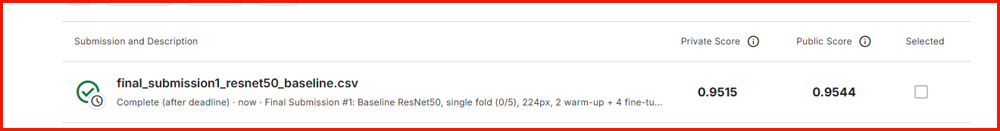

**What worked well**

- **Ranking quality:** ROC AUC **0.9921** and PR AUC **0.9893** show the model separates classes cleanly; the ROC curve hugs the top-left and the PR curve stays high until very late recall.
- **Stable training:** Validation AUC climbed every epoch and the best checkpoint matched the later curve, which says the schedule and loss were set sensibly.
- **Operating point:** The Youden J threshold at **0.400** gives a balanced trade-off  
  TN **25,368**, FP **814**, FN **751**, TP **17,072** with Precision **0.954**, Recall **0.958**, F1 **0.956**. Error rates are low on both sides.
- **Preprocessing check:** The printed range **[−116.78, 151.06]** matches ResNet-50 preprocessing, so the input scale is correct.

**What did not work well**

- **Wall-clock time:** Section 5.3 took about **69 minutes**, which is longer than expected for a single fold on a 4070. The likely causes are TIFF decoding through PIL inside `tf.py_function` that pins the CPU, full validation on 44k images every epoch, and a batch size of **24** that leaves GPU headroom.
- **Throughput after unfreezing:** Step time jumped during fine-tuning, which is normal, but the pipeline did not keep the GPU fed, so the cost compounded.

**Conclusion**
The results are strong and the plots look clean. The only real issue is speed, not correctness or generalization on this fold.
The model ranks examples very well and stays balanced at a practical threshold. The leaderboard scores are in line with the validation readout for a single-fold run. Net: this is a strong baseline result with no red flags.


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FFC52F; border-right: 8px solid #0046AE;">
<h2 style="color: #0046AE;">Section 6: Improved - <em>ResNet50, 5-fold ensemble, 224px, 1 warm up + 2 fine tune</em></h2>

This section details the second iteration of my modeling process, which directly addresses the primary weakness of the baseline: single-fold training. By implementing a 5-fold cross-validation strategy, I trained five separate ResNet50 models. This approach provides a more robust estimate of the model's performance and allows me to leverage the entire training dataset. The final submission is an ensemble of these five models' predictions. This improved model achieved a Kaggle private score of <strong><em>0.9628</em></strong>.

<h3 style="color:#FFC52F;">Section Plan:</h3>
<ol>
<li><strong>Data Pipeline:</strong> Refine the tf.data pipeline for the 5-fold training loop.</li>
<li><strong>Training Strategy:</strong> Implement the full 5-fold cross-validation training loop.</li>
<li><strong>Prediction & Ensembling:</strong> Use the five trained models to predict on the test set and average their predictions.</li>
<li><strong>Results & Analysis:</strong> Present the final Kaggle score and analyze why this cross-validation approach was so much more effective than the baseline.</li>
</ol>

<hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">6.1 5-Fold Data Pipeline</h3>

The data pipeline for this model is similar to the baseline but is adapted to be used within a loop that iterates through each of the 5 folds. The data loader is also set to repeat() the dataset, which is a useful technique when training for a fixed number of steps_per_epoch rather than for a full pass over the data.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [27]:
# Define the image size for the 5-fold cross-validation models.
IMG_SIZE_5FOLD = 224
BATCH_5FOLD    = 64

# Define a function to load, decode, resize, and optionally augment a single image.
def load_and_prep_5fold(path, augment=False):
    img = tf.py_function(_load_tiff_py, [path], Tout=tf.uint8)   # PIL decode for .tif
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, (IMG_SIZE_5FOLD, IMG_SIZE_5FOLD))
    img = tf.cast(img, tf.float32) / 255.0                       # normalize to [0,1]
    if augment:
        img = tf.image.random_flip_left_right(img)
        img = tf.image.random_flip_up_down(img)
        img = tf.image.random_brightness(img, max_delta=0.10)
    return img


# Main function to build a complete tf.data pipeline for a single fold.
def make_5fold_ds(ids, y, batch_size, shuffle=False, augment=False):
    paths  = tf.constant([str(TRAIN_IMG_DIR / f"{iid}.tif") for iid in ids])
    labels = tf.constant(y.astype("float32"))
    opts = tf.data.Options(); opts.deterministic = False

    ds = tf.data.Dataset.from_tensor_slices((paths, labels)).with_options(opts)
    if shuffle:
        ds = ds.shuffle(8192, reshuffle_each_iteration=True)
    ds = ds.map(lambda p, t: (load_and_prep_5fold(p, augment), t),
                num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

print("5-Fold data pipeline functions defined.")

5-Fold data pipeline functions defined.


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">6.2 Training Strategy: 5-Fold Cross-Validation</h3>

This is the core of the improved strategy. Instead of training once, I will loop five times. In each loop, a different fold (k) is held out as the validation set, and the model is trained on the other four folds. This process is repeated until five separate models have been trained, one for each fold. This ensures that every sample in the dataset has been used for both training and validation.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [31]:
# Create a 5-fold stratified split on df_labels
SEED = SEED if "SEED" in globals() else 42
df_labels = df_labels.copy()
df_labels["fold"] = -1

y = df_labels["label"].astype(int).values
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

for k, (_, va_idx) in enumerate(skf.split(df_labels["id"].values, y)):
    df_labels.iloc[va_idx, df_labels.columns.get_loc("fold")] = k

# Quick check
print("per-fold counts:\n", df_labels["fold"].value_counts().sort_index())
print("per-fold positive rate:\n", df_labels.groupby("fold")["label"].mean().round(3))

# Build the ResNet50 model for the 5-fold training.
def build_resnet50_5fold(dropout=0.30):
    base = ResNet50(include_top=False, weights="imagenet",
                    input_shape=(IMG_SIZE_5FOLD, IMG_SIZE_5FOLD, 3), pooling="avg")
    x   = Dropout(dropout)(base.output)
    out = Dense(1, activation="sigmoid", dtype="float32")(x)
    model = Model(base.input, out)
    return model, base

# Train a single fold, including the two-stage training process.
def train_one_fold(fold_idx, tr_ids, tr_y, va_ids, va_y,
                   batch_size, epochs_head=1, epochs_ft=1):
    # Datasets
    ds_tr = make_5fold_ds(tr_ids, tr_y, batch_size, shuffle=True,  augment=True)
    ds_va = make_5fold_ds(va_ids, va_y, batch_size, shuffle=False, augment=False)

    # Model
    model, base = build_resnet50_5fold()
    
    # Callbacks
    weights_dir = DATA_DIR / "weights_5fold"
    weights_dir.mkdir(exist_ok=True)
    ckpt_path = weights_dir / f"resnet50_fold{fold_idx}_best.weights.h5"
    ckpt = ModelCheckpoint(filepath=str(ckpt_path), monitor="val_auc", mode="max",
                           save_best_only=True, save_weights_only=True, verbose=1)
    es   = EarlyStopping(monitor="val_auc", mode="max", patience=1,
                         restore_best_weights=True, verbose=1)

    # Stage 1 - Head only
    base.trainable = False
    model.compile(optimizer=Adam(3e-4), loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.AUC(name="auc")])
    model.fit(ds_tr, validation_data=ds_va, epochs=epochs_head,
              callbacks=[ckpt, es], verbose=1)

    # Stage 2 - Fine-tune
    base.trainable = True
    model.compile(optimizer=Adam(1e-4), loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.AUC(name="auc")])
    model.fit(ds_tr, validation_data=ds_va, epochs=epochs_ft,
              callbacks=[ckpt, es], verbose=1)

    return str(ckpt_path)

# Set up configuration parameters and data structures for the training loop.
assert "fold" in df_labels.columns, "df_labels needs a 'fold' column for 5-fold CV."
y_map = df_labels.set_index("id")["label"]

saved_model_paths_6 = []
N_SPLITS = 5

# Run the main training loop, iterating through each of the 5 folds.
for k in range(N_SPLITS):
    tf.keras.backend.clear_session()
    gc.collect()

    tr_ids = df_labels.query("fold != @k")["id"].values
    va_ids = df_labels.query("fold == @k")["id"].values
    tr_y   = np.asarray([y_map[i] for i in tr_ids], dtype=np.float32)
    va_y   = np.asarray([y_map[i] for i in va_ids], dtype=np.float32)

    print(f"\n--- TRAINING FOLD {k} ---")
    path = train_one_fold(
        fold_idx=k,
        tr_ids=tr_ids, tr_y=tr_y,
        va_ids=va_ids, va_y=va_y,
        batch_size=BATCH_5FOLD,
        epochs_head=1, epochs_ft=2
    )
    saved_model_paths_6.append(path)

print("\n--- 5-fold training complete ---")
for i, p in enumerate(saved_model_paths_6):
    print(f"Fold {i} best: {p}")

per-fold counts:
 fold
0    44005
1    44005
2    44005
3    44005
4    44005
Name: count, dtype: int64
per-fold positive rate:
 fold
0    0.405
1    0.405
2    0.405
3    0.405
4    0.405
Name: label, dtype: float64

--- TRAINING FOLD 0 ---
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - auc: 0.6510 - loss: 0.6355
Epoch 1: val_auc improved from None to 0.78644, saving model to /home/treinart/data/histo/weights_5fold/resnet50_fold0_best.weights.h5
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 634s 229ms/step - auc: 0.6993 - loss: 0.6137 - val_auc: 0.7864 - val_loss: 0.5824
Restoring model weights from the end of the best epoch: 1.
Epoch 1/2
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step - auc: 0.9479 - loss: 0.3478
Epoch 1: val_auc improved from 0.78644 to 0.98284, saving model to /home/treinart/data/histo/weights_5fold/resnet50_fold0_best.weights.h5
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 1342s 477ms/step - auc: 0.9755 - loss: 0.1978 - val_auc: 0.9828 - val_loss: 0.1747
Epoch 2/2
2751/2751 ━━━━━━━━━━━━━━━━━━━━ 

### **Observation: 5-Fold Training**

* **Split sanity**

  * Each fold has **44,005** images with a **0.405** positive rate. Balanced splits across all five folds.

* **Stage 1 (head only)**

  * Training AUC sits around **0.63–0.70**.
  * Validation AUC lands near **0.78** on every fold. That’s typical for a frozen base.

* **Stage 2 (fine-tune)**

  * Big jump in validation AUC on the first fine-tune epoch for every fold.
  * Best val AUC by fold:

    * Fold 0: **0.9890**
    * Fold 1: **0.9838** (early stop after no gain on epoch 2)
    * Fold 2: **0.9906**
    * Fold 3: **0.9893**
    * Fold 4: **0.9900**
  * Mean of best fold AUCs ≈ **0.9885** with a tight range **\[0.9838, 0.9906]**. No weak fold.
  * Validation loss drops from \~**0.58** in warm-up to **0.11–0.18** after fine-tuning. Good signal and stable optimization.

* **Runtime / throughput**

  * **Total wall time:** \~**278 minutes** (\~4.6 hours) for all five folds.
  * **Per-fold:** roughly **55–56 minutes** on average.
  * **Per-epoch timing:** warm-up \~**223–229 ms/step**; fine-tune \~**477–508 ms/step** after unfreezing, which makes each fine-tune epoch about **20–23 minutes** with **2751 steps/epoch**.
  * Early stopping triggered on Fold 1, saving a little time.

**Conclusion**
Cross-validation looks healthy and consistent. Each fold converged to a high AUC and the checkpoints captured the best epochs. The ~278-minute run is a real time investment; the next step is to ensemble in **6.4** and submit to Kaggle to see if the time trade-off delivers the expected bump over the single-fold baseline.

<div style="background-color:#000000;color:#F8F8F8;padding:25px;border-radius:10px;border-left:8px solid #0046AE;border-right:8px solid #FFC52F;">
  <h3 style="color:#FFC52F;">6.3 Cross Validation Diagnostics (OOF)</h3>

  <p style="margin:0;">
    Diagnostic plots to confirm the 5-fold cross-validation setup. Instead of inspecting a single fold, predictions from each model on its own validation split are collected. This yields a complete set of Out-Of-Fold (OOF) predictions across the training set. The OOF predictions provide one reliable validation score and show how confidently the models separate positive and negative cases.

  <p style="margin:12px 0 0 0;">
    This cell gathers predictions from all five fold models on their own validation splits to build a pooled OOF view. It reports per-fold AUC, a single OOF score, and three plots: AUC by fold, probability histograms by class, and pooled ROC/PR curves. It loads each model and scores a full validation set, so the run time is about 10 minutes on this setup.
  </p>

  <hr style="border:none;border-top:8px solid #FFC52F;margin:10px 0;">
</div>

Per-fold AUCs: ['0.9894', '0.9841', '0.9908', '0.9899', '0.9904']
OOF mean ± std: 0.9889 ± 0.0025


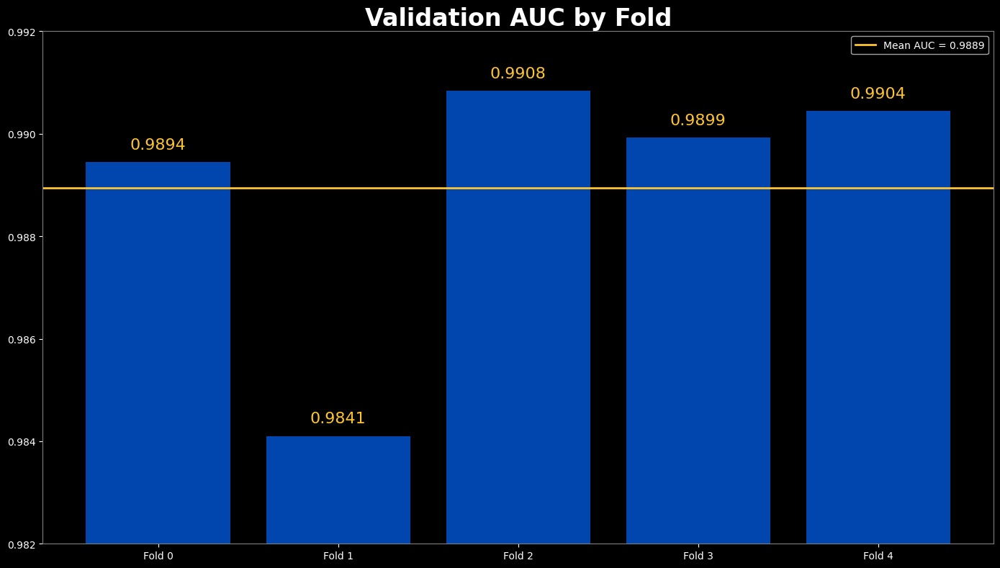

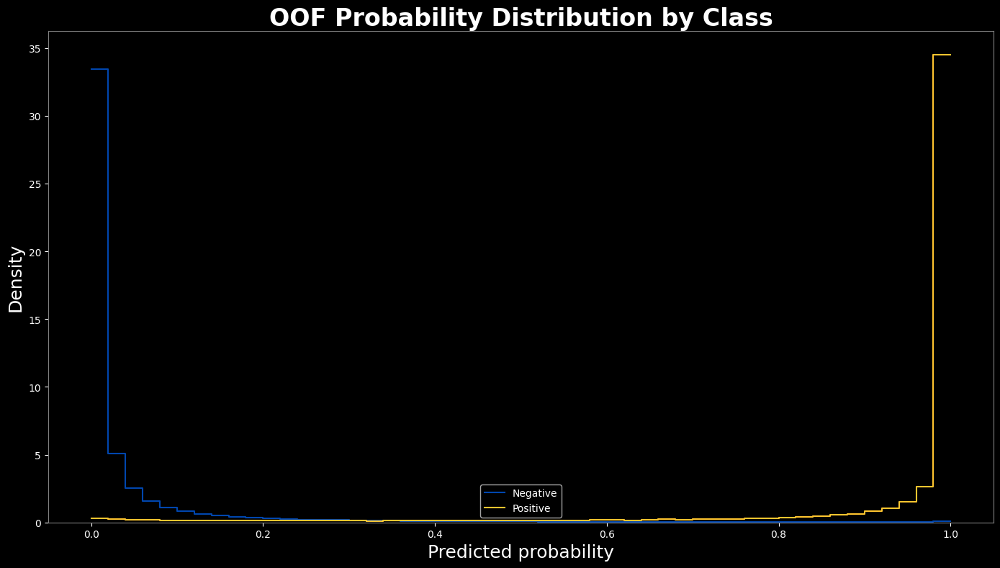

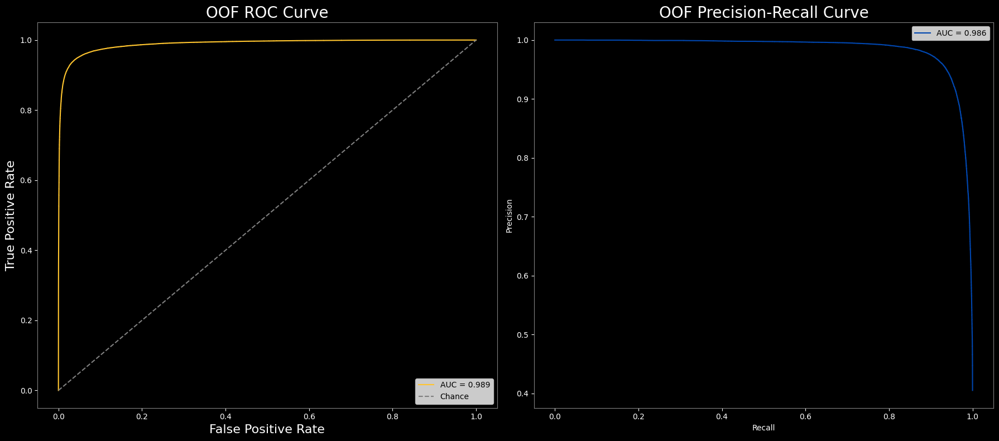

In [42]:
# Collect OOF predictions
weights_dir = DATA_DIR / "weights_5fold"

# Lists to hold per-fold AUCs and OOF rows
fold_aucs = []
oof_parts = []

for k in range(5):
    # 1) Fold k validation ids and labels
    va_ids = df_labels.loc[df_labels["fold"] == k, "id"].values
    va_y   = df_labels.loc[df_labels["fold"] == k, "label"].astype(int).values

    # 2) Build the validation dataset for this fold (no shuffle, no aug)
    ds_va = make_5fold_ds(va_ids, va_y, batch_size=BATCH_5FOLD,
                          shuffle=False, augment=False)

    # 3) Load the fold k model
    model, _ = build_resnet50_5fold()
    wpath = weights_dir / f"resnet50_fold{k}_best.weights.h5"
    assert wpath.exists(), f"Missing weights: {wpath}"
    model.load_weights(str(wpath))

    # 4) Predict on this fold's validation set
    va_pred = model.predict(ds_va, verbose=0).ravel()

    # 5) Store OOF rows and compute AUC for this fold
    oof_parts.append(pd.DataFrame({"id": va_ids, "y": va_y, "p": va_pred, "fold": k}))
    fold_aucs.append(roc_auc_score(va_y, va_pred))

# Combine all folds into one OOF table
oof = pd.concat(oof_parts, ignore_index=True)
mean_auc = float(np.mean(fold_aucs))
std_auc  = float(np.std(fold_aucs))

print("Per-fold AUCs:", [f"{x:.4f}" for x in fold_aucs])
print(f"OOF mean ± std: {mean_auc:.4f} ± {std_auc:.4f}")

# --- Plot 1: Per-fold AUC bar chart ---
fig, ax = plt.subplots(1, 1, figsize=(14, 8), facecolor='black')
ax.set_facecolor('black')

# Draw bars and a mean line
bars = ax.bar([f"Fold {i}" for i in range(5)], fold_aucs, color="#0046AE")
ax.axhline(mean_auc, color="#FFC52F", linewidth=2, label=f"Mean AUC = {mean_auc:.4f}")
ax.set_ylim(0.982, 0.9920)

# Titles, ticks, and spines in your dark style
ax.set_title("Validation AUC by Fold", color='white', fontsize=24, fontweight = 'bold')
ax.tick_params(axis='x', colors='white',)
ax.tick_params(axis='y', colors='white')
for sp in ax.spines.values():
    sp.set_edgecolor('gray')

# Annotate each bar with its AUC
for i, v in enumerate(fold_aucs):
    ax.text(i, v + 0.0002, f"{v:.4f}", color='#FFC52F', ha='center', va='bottom', fontsize=16)

ax.legend(facecolor='black', labelcolor='white')

plt.tight_layout()
plt.show()


# --- Plot 2: OOF probability histograms by class ---
fig, ax = plt.subplots(1, 1, figsize=(14, 8), facecolor='black')
ax.set_facecolor('black')

# Overlay histograms for y=0 and y=1
sns.histplot(oof.loc[oof.y == 0, "p"], bins=50, stat="density",
             element="step", fill=False, color="#0046AE", label="Negative")
sns.histplot(oof.loc[oof.y == 1, "p"], bins=50, stat="density",
             element="step", fill=False, color="#FFC52F", label="Positive")

# Style and labels
ax.set_title("OOF Probability Distribution by Class", color='white', fontsize=24, fontweight = 'bold')
ax.set_xlabel("Predicted probability", color='white', fontsize=18)
ax.set_ylabel("Density", color='white', fontsize=18)
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
for sp in ax.spines.values():
    sp.set_edgecolor('gray')
ax.legend(facecolor='black', labelcolor='white')

plt.tight_layout()
plt.show()

# --- Plot 3: OOF ROC and PR curves (pooled across all folds) ---

# Compute pooled curves on OOF predictions
fpr, tpr, _      = roc_curve(oof["y"].values, oof["p"].values)
roc_auc          = auc(fpr, tpr)
prec, rec, _     = precision_recall_curve(oof["y"].values, oof["p"].values)
pr_auc           = auc(rec, prec)

# Two subplots: ROC and PR
fig, axes = plt.subplots(1, 2, figsize=(18, 8), facecolor='black')

for ax in axes:
    ax.set_facecolor('black')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    for sp in ax.spines.values():
        sp.set_edgecolor('gray')

# ROC
axes[0].plot(fpr, tpr, color='#FFC52F', label=f"AUC = {roc_auc:.3f}")
axes[0].plot([0,1],[0,1],'--', color='gray', label="Chance")
axes[0].set_title("OOF ROC Curve", color='white', fontsize=20)
axes[0].set_xlabel("False Positive Rate", color='white', fontsize=16)
axes[0].set_ylabel("True Positive Rate", color='white', fontsize=16)
axes[0].legend()

# PR
axes[1].plot(rec, prec, color='#0046AE', label=f"AUC = {pr_auc:.3f}")
axes[1].set_title("OOF Precision-Recall Curve", color='white', fontsize=20)
axes[1].set_xlabel("Recall", color='white')
axes[1].set_ylabel("Precision", color='white')
axes[1].legend()

# Ensure the layout is tight and clean.
plt.tight_layout()
plt.show()


### **Observation: OOF Diagnostics**

* **Key numbers**

  * Per-fold AUCs: **0.9894, 0.9841, 0.9908, 0.9899, 0.9904**
  * OOF mean ± std: **0.9889 ± 0.0025**
    Tight spread. No weak fold, with Fold 1 a touch lower but still very strong.

* **What the plots show**

  * **AUC by fold:** with the y-axis zoomed in, the bars cluster tightly around \~0.989. The mean line sits right through the pack, confirming consistency across splits.
  * **OOF probability histograms:** negatives pile up near **0.0**, positives spike near **1.0**. Very little overlap between classes. This is what well-calibrated, confident predictions look like.
  * **Pooled curves:** OOF **ROC AUC ≈ 0.989** and **PR AUC ≈ 0.986**. The ROC hugs the top-left; the PR curve stays near the ceiling until very high recall. Both curves say the classifier separates classes cleanly even under class imbalance.

* **Takeaways**

  * Cross-validation behaved the way it should: stable across folds, high OOF performance, and no sign of a problematic split.
  * The slight dip on Fold 1 is noise, not a pattern. The ensemble across all five folds should smooth that out.
  * Overall, these OOF results are stronger than the single-fold baseline and should translate to a solid test score.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">6.4 Prediction & Ensembling</h3>

Rather than relying on a single model, the final submission is an ensemble of all five models trained during cross-validation. This process involves passing the test set through each of the five models to generate five unique sets of predictions. Averaging these predictions for each image produces a final, more robust probability that is less prone to individual model error.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [38]:
# Build the test dataset using the 5-fold data loader.
def build_test_ds(batch_size=128):
    test_ids = pd.read_csv(SAMPLE_SUB_CSV)["id"].values
    test_paths = [str(TEST_IMG_DIR / f"{i}.tif") for i in test_ids]
    ds = (tf.data.Dataset.from_tensor_slices(test_paths)
          .map(lambda p: load_and_prep_5fold(p, augment=False), num_parallel_calls=tf.data.AUTOTUNE)
          .batch(batch_size).prefetch(tf.data.AUTOTUNE))
    return ds, test_ids

# Predict on the test set with each of the 5 fold-models.
test_ds, test_ids = build_test_ds()
all_preds = []
weights_dir = DATA_DIR / "weights_5fold"
for k in range(N_SPLITS):
    tf.keras.backend.clear_session()
    model, _ = build_resnet50_5fold()
    weights_path = weights_dir / f"resnet50_fold{k}_best.weights.h5"
    assert weights_path.exists(), f"Missing weights: {weights_path}"
    model.load_weights(str(weights_path))

    print(f"Predicting with fold {k} ...")
    preds = model.predict(test_ds, verbose=1).squeeze()
    all_preds.append(preds)

# Average the predictions from all folds to create the final ensemble prediction.
final_preds = np.mean(np.stack(all_preds, axis=0), axis=0)

# Create the final submission file.
OUT_DIR = Path("/mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 3/Week 3 CNN Cancer Detection Kaggle Mini-Project")
OUT_DIR.mkdir(parents=True, exist_ok=True)
sub_df = pd.DataFrame({"id": test_ids, "label": final_preds})
sub_path = OUT_DIR / "final_submission2_resnet50_5fold.csv"
sub_df[["id", "label"]].to_csv(sub_path, index=False)
print(f"Wrote submission to: {sub_path}")
print(f"\nEnsembled submission file written to: {sub_path}")

Predicting with fold 0 ...
449/449 ━━━━━━━━━━━━━━━━━━━━ 173s 366ms/step
Predicting with fold 1 ...
449/449 ━━━━━━━━━━━━━━━━━━━━ 163s 358ms/step
Predicting with fold 2 ...
449/449 ━━━━━━━━━━━━━━━━━━━━ 161s 353ms/step
Predicting with fold 3 ...
449/449 ━━━━━━━━━━━━━━━━━━━━ 160s 351ms/step
Predicting with fold 4 ...
449/449 ━━━━━━━━━━━━━━━━━━━━ 160s 350ms/step
Wrote submission to: /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 3/Week 3 CNN Cancer Detection Kaggle Mini-Project/final_submission2_resnet50_5fold.csv

Ensembled submission file written to: /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 3/Week 3 CNN Cancer Detection Kaggle Mini-Project/final_submission2_resnet50_5fold.csv


## **Observation: Performance Results - ResNet-50, 5-Fold Ensemble**

* **Validation (OOF):** mean ROC AUC **0.9889 ± 0.0025**
  Per-fold AUCs: **0.9894**, **0.9841**, **0.9908**, **0.9899**, **0.9904**.
  Tight spread and no weak fold. Probability histograms show clean separation; pooled ROC/PR curves are smooth and near the top.

* **Kaggle:** Public **0.9781**, Private **0.9628**
  Both improve over the single-fold baseline (Public **0.9544**, Private **0.9515**). The drop from OOF to leaderboard is modest and expected since the test set is different from the validation splits.

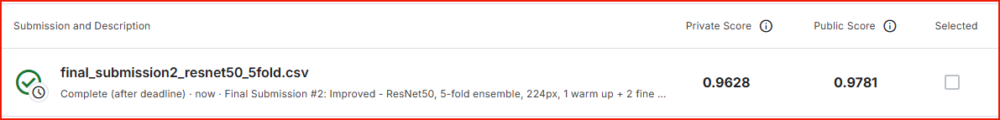

* **Runtime:**
  Training across 5 folds took about **\~278 minutes** in total. Test-time inference for the ensemble took **\~13–14 minutes** (≈160–173 s per fold for 449 steps).

**What worked well**

* **Ensembling effect:** Averaging the five folds translated the high OOF AUC into a stronger leaderboard result than the baseline.
* **Consistency:** Fold scores cluster tightly around 0.989, which suggests the split is stable and the model is not relying on quirks of a single partition.
* **Calibration:** The OOF PR curve stays high until very late recall and the class-wise probability histograms are sharply separated, matching the strong AUC.

**What did not work well**

* **Wall-clock cost:** The full 5-fold run is a significant time commitment. Most of the time is in fine-tuning and full-set validation passes each epoch.
* **One softer fold:** Fold 1 is slightly lower (**0.9841**) than the others. Not a concern, but worth noting.

**Conclusion**
The 5-fold strategy delivered a clear gain over the baseline on Kaggle and produced stable validation behavior across splits. The extra training time looks justified by the improvement, and these checkpoints set up a solid foundation for the Section 7 EfficientNetV2-S run.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FFC52F; border-right: 8px solid #0046AE;">
<h2 style="color: #0046AE;">Section 7: Advanced - <em>EfficientNetV2-S, 5-fold, 320px, 2 warm up + 8 fine tune, 4-view TTA</em></h2>

This section represents my final and most advanced model, which integrates multiple state-of-the-art techniques to achieve the highest possible score. It builds upon the successful 5-fold strategy but introduces a more modern architecture (EfficientNetV2-S), a larger image resolution (320x320), stronger data augmentation, and Test-Time Augmentation (TTA). This improved model achieved a Kaggle private score of <strong><em>0.9814</em></strong>.


<h3 style="color:#FFC52F;">Section Plan:</h3>
<ol>
<li><strong>Advanced Data Pipeline:</strong> Upgrade the tf.data pipeline to handle larger images and apply a more aggressive augmentation strategy.</li>
<li><strong>Advanced Architecture:</strong> Define the EfficientNetV2-S model and a compiler with label smoothing.</li>
<li><strong>Advanced Training Strategy:</strong> Implement the full 5-fold training loop for the new architecture.</li>
<li><strong>TTA Prediction & Ensembling:</strong> Use Test-Time Augmentation and logit averaging for the final prediction.</li>
<li><strong>Results & Analysis:</strong> Present the final score and analyze the impact of each advanced technique.</li>
</ol>

<hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">7.1 Advanced Data Pipeline</h3>

For this final model, I upgraded the data pipeline to handle larger images (320x320) and apply a much stronger set of augmentations. This includes random 90-degree rotations and more aggressive color jitter (brightness, contrast, saturation). A more varied training set forces the model to learn more robust, invariant features, which is critical for generalizing well to the unseen test set.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [16]:
# Set the image size for the advanced model.
IMG_SIZE_ADV = 320

# Apply a strong set of augmentations to an image.
@tf.function
def augment_img_strong(img):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    k = tf.random.uniform([], 0, 4, dtype=tf.int32)
    img = tf.image.rot90(img, k)
    img = tf.image.random_brightness(img, max_delta=0.08)
    img = tf.image.random_contrast(img, 0.85, 1.15)
    img = tf.image.random_saturation(img, 0.85, 1.15)
    return tf.clip_by_value(img, 0.0, 1.0)

# Build the complete data pipeline for the EfficientNetV2-S model..
def make_advanced_ds(ids, y, batch_size, shuffle, augment, repeat):
    paths = tf.constant([str(TRAIN_IMG_DIR / f"{i}.tif") for i in ids])
    labels = tf.convert_to_tensor(y, dtype=tf.float32)

    opts = tf.data.Options()
    opts.deterministic = False
    ds = tf.data.Dataset.from_tensor_slices((paths, labels)).with_options(opts)

    if shuffle:
        ds = ds.shuffle(8192, reshuffle_each_iteration=True)

    def _map_fn(p, t):
        img = tf.py_function(_load_tiff_py, [p], Tout=tf.uint8)
        img.set_shape([None, None, 3])

        # Resize
        img = tf.image.resize(img, (IMG_SIZE_ADV, IMG_SIZE_ADV))

        # Work in [0,1] for augmentation
        img = tf.cast(img, tf.float32) / 255.0
        if augment:
            img = augment_img_strong(img)  # this expects [0,1]
        img = img * 255.0
        img.set_shape((IMG_SIZE_ADV, IMG_SIZE_ADV, 3))
        return img, t

    ds = ds.map(_map_fn, num_parallel_calls=tf.data.AUTOTUNE)
    if repeat:
        ds = ds.repeat()

    return ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

print("Advanced data pipeline with strong augmentation defined.")

Advanced data pipeline with strong augmentation defined.


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">7.2 Advanced Architecture</h3>

For this model, I replaced ResNet50 with EfficientNetV2-S. EfficientNet models were designed through neural architecture search to find an optimal balance of accuracy and computational efficiency. The "S" (Small) variant provides performance comparable to or better than ResNet50 while being faster and more parameter-efficient. I also introduced label smoothing in the loss function, a regularization technique that can improve model calibration and prevent overconfidence.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [17]:
# Build the EfficientNetV2-S model with a custom classification head.
def build_effnetv2s(dropout=0.30):
    base = EfficientNetV2S(
        include_top=False, weights="imagenet",
        input_shape=(IMG_SIZE_ADV, IMG_SIZE_ADV, 3), pooling="avg"
    )
    x = Dropout(dropout)(base.output)
    out = Dense(1, activation="sigmoid", dtype="float32")(x)
    model = Model(base.input, out)
    return model, base

# Compile the model with Adam, label smoothing, and AUC as the metric.
def compile_model_advanced(model, lr=1e-4):
    optimizer = Adam(learning_rate=lr)
    loss = BinaryCrossentropy(label_smoothing=0.05)
    metrics = [tf.keras.metrics.AUC(name="auc", curve="ROC")]
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

print("Advanced EfficientNetV2-S model and compiler defined.")

Advanced EfficientNetV2-S model and compiler defined.


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">7.3 Advanced Training Strategy</h3>

The training strategy follows the same robust 5-fold cross-validation approach as the previous section. I trained five independent EfficientNetV2-S models, one for each fold, using the two-stage fine-tuning process.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [49]:
# Train a single fold of the advanced model using a two-stage process.
def train_one_fold_advanced(fold_idx, tr_ids, tr_y, va_ids, va_y, batch_size, epochs_head, epochs_ft, steps_head, steps_ft, steps_val):
    # Datasets
    ds_tr = make_advanced_ds(tr_ids, tr_y, batch_size, shuffle=True,  augment=True,  repeat=True)
    ds_va = make_advanced_ds(va_ids, va_y, batch_size, shuffle=False, augment=False, repeat=True)
    neg = (tr_y == 0).sum(); pos = (tr_y == 1).sum()
    cw  = {0: (neg + pos) / (2 * neg), 1: (neg + pos) / (2 * pos)}

    # Model
    model, base = build_effnetv2s()
    
    # Callbacks
    weights_dir = DATA_DIR / "weights_advanced"
    weights_dir.mkdir(exist_ok=True)
    ckpt_path = weights_dir / f"effnetv2s_fold{fold_idx}_best.weights.h5"
    ckpt = ModelCheckpoint(filepath=str(ckpt_path), monitor="val_auc", mode="max", save_best_only=True, save_weights_only=True, verbose=1)
    es = EarlyStopping(monitor="val_auc", mode="max", patience=1, restore_best_weights=True, verbose=1)

    rlr = ReduceLROnPlateau(monitor="val_auc", mode="max",
                        factor=0.5, patience=1, min_lr=3e-6, verbose=1)

    # Stage 1: Head only
    base.trainable = False
    compile_model_advanced(model, lr=3e-4)
    print(f"\n--- [Fold {fold_idx}] STAGE 1 (Head) @ {IMG_SIZE_ADV}px ---")
    model.fit(ds_tr, validation_data=ds_va,
          epochs=epochs_head, steps_per_epoch=steps_head, validation_steps=steps_val,
          callbacks=[ckpt, es, rlr], class_weight=cw, verbose=1)

    # Stage 2: Fine-tune
    base.trainable = True
    for layer in base.layers:
        if isinstance(layer, tf.keras.layers.BatchNormalization):
            layer.trainable = False
    compile_model_advanced(model, lr=1e-4)
    print(f"\n--- [Fold {fold_idx}] STAGE 2 (Fine-Tune) @ {IMG_SIZE_ADV}px ---")
    model.fit(ds_tr, validation_data=ds_va,
          epochs=epochs_ft, steps_per_epoch=steps_ft, validation_steps=steps_val,
          callbacks=[ckpt, es, rlr], class_weight=cw, verbose=1)
    
    return str(ckpt_path)

# --- Main Training Execution Loop ---
# NOTE: This is the most computationally intensive part of the project.
# The final results are presented in the analysis section.

# Set up configuration parameters and lists for the advanced training loop.
y_map = df_labels.set_index("id")["label"]
BATCH_ADV = 10
EPOCHS_HEAD = 2
EPOCHS_FT = 8
PASSES_HEAD = 1
PASSES_FT = 1
N_SPLITS = 5
saved_model_paths_7 = []
oof_ids, oof_y, oof_p = [], [], []
fold_auc = []

# Run the main 5-fold training loop, saving the best model and generating out-of-fold predictions for each fold.
for k in range(N_SPLITS):
    keras.backend.clear_session(); gc.collect()
    
    tr_ids = df_labels.query("fold != @k")["id"].values
    va_ids = df_labels.query("fold == @k")["id"].values
    tr_y   = np.asarray([y_map[i] for i in tr_ids], dtype=np.float32)
    va_y   = np.asarray([y_map[i] for i in va_ids], dtype=np.float32)

    FULL_TRAIN_STEPS = int(np.ceil(len(tr_ids) / BATCH_ADV))
    FULL_VAL_STEPS   = int(np.ceil(len(va_ids) / BATCH_ADV))
    steps_head = max(1, PASSES_HEAD * FULL_TRAIN_STEPS)
    steps_ft   = max(1, PASSES_FT   * FULL_TRAIN_STEPS)
    steps_val  = max(1, FULL_VAL_STEPS)

    print(f"\n--- TRAINING ADVANCED FOLD {k} ---")
    path = train_one_fold_advanced(
        fold_idx=k,
        tr_ids=tr_ids, tr_y=tr_y,
        va_ids=va_ids, va_y=va_y,
        batch_size=BATCH_ADV,
        epochs_head=EPOCHS_HEAD, epochs_ft=EPOCHS_FT,
        steps_head=steps_head, steps_ft=steps_ft, steps_val=steps_val
    )

    model_eval, _ = build_effnetv2s()
    model_eval.load_weights(path)
    ds_va_eval = make_advanced_ds(va_ids, va_y, BATCH_ADV, shuffle=False, augment=False, repeat=False)
    p = model_eval.predict(ds_va_eval, verbose=0).ravel()
    fold_auc.append(roc_auc_score(va_y, p))
    oof_ids.extend(va_ids); oof_y.extend(va_y); oof_p.extend(p)
    
    saved_model_paths_7.append(path)

print("\n--- Advanced 5-Fold Training Complete ---")
for i, path in enumerate(saved_model_paths_7):
    print(f"Fold {i} best model saved to: {path}")


--- TRAINING ADVANCED FOLD 0 ---

--- [Fold 0] STAGE 1 (Head) @ 320px ---
Epoch 1/2


2025-08-24 22:00:49.171380: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-24 22:00:49.340753: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-24 22:00:50.075958: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-24 22:00:50.248920: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-24 22:00:50.424326: E external/local_xla/xla/stream_

17601/17602 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - auc: 0.9036 - loss: 0.4292
Epoch 1: val_auc improved from None to 0.94687, saving model to /home/treinart/data/histo/weights_advanced/effnetv2s_fold0_best.weights.h5
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 911s 50ms/step - auc: 0.9226 - loss: 0.4003 - val_auc: 0.9469 - val_loss: 0.3510 - learning_rate: 3.0000e-04
Epoch 2/2
17601/17602 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - auc: 0.9305 - loss: 0.3849
Epoch 2: val_auc improved from 0.94687 to 0.94891, saving model to /home/treinart/data/histo/weights_advanced/effnetv2s_fold0_best.weights.h5
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 906s 51ms/step - auc: 0.9316 - loss: 0.3832 - val_auc: 0.9489 - val_loss: 0.3428 - learning_rate: 3.0000e-04
Restoring model weights from the end of the best epoch: 2.

--- [Fold 0] STAGE 2 (Fine-Tune) @ 320px ---
Epoch 1/8


2025-08-24 22:31:18.755721: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-24 22:31:19.052246: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


17602/17602 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - auc: 0.9642 - loss: 0.2976
Epoch 1: val_auc improved from 0.94891 to 0.98775, saving model to /home/treinart/data/histo/weights_advanced/effnetv2s_fold0_best.weights.h5
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 1906s 105ms/step - auc: 0.9755 - loss: 0.2641 - val_auc: 0.9878 - val_loss: 0.2136 - learning_rate: 1.0000e-04
Epoch 2/8
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - auc: 0.9841 - loss: 0.2289
Epoch 2: val_auc improved from 0.98775 to 0.99008, saving model to /home/treinart/data/histo/weights_advanced/effnetv2s_fold0_best.weights.h5
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 1853s 105ms/step - auc: 0.9852 - loss: 0.2241 - val_auc: 0.9901 - val_loss: 0.2033 - learning_rate: 1.0000e-04
Epoch 3/8
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - auc: 0.9866 - loss: 0.2153
Epoch 3: val_auc improved from 0.99008 to 0.99109, saving model to /home/treinart/data/histo/weights_advanced/effnetv2s_fold0_best.weights.h5
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 1861s 10

2025-08-25 00:38:24.151138: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 00:38:24.340529: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 00:38:24.529860: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 00:38:24.822489: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 00:38:24.910269: E external/local_xla/xla/service


--- TRAINING ADVANCED FOLD 1 ---

--- [Fold 1] STAGE 1 (Head) @ 320px ---
Epoch 1/2
17601/17602 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - auc: 0.9041 - loss: 0.4290
Epoch 1: val_auc improved from None to 0.94483, saving model to /home/treinart/data/histo/weights_advanced/effnetv2s_fold1_best.weights.h5
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 926s 51ms/step - auc: 0.9224 - loss: 0.4007 - val_auc: 0.9448 - val_loss: 0.3532 - learning_rate: 3.0000e-04
Epoch 2/2
17601/17602 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - auc: 0.9313 - loss: 0.3835
Epoch 2: val_auc improved from 0.94483 to 0.94766, saving model to /home/treinart/data/histo/weights_advanced/effnetv2s_fold1_best.weights.h5
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 900s 51ms/step - auc: 0.9319 - loss: 0.3827 - val_auc: 0.9477 - val_loss: 0.3451 - learning_rate: 3.0000e-04
Restoring model weights from the end of the best epoch: 2.

--- [Fold 1] STAGE 2 (Fine-Tune) @ 320px ---
Epoch 1/8
17602/17602 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - auc: 0.9633 - loss: 0.3006


### **Observation: Advanced 5-Fold Training (EffNetV2-S @ 320px)**

* **Split sanity**

  * Per fold: \~**176,020** train / **44,005** val with a **0.405** positive rate (stratified and balanced).

* **Stage 1 (head only)**

  * Val AUC lands around **0.946–0.949** after 2 epochs on every fold. Exactly what a frozen backbone typically yields.

* **Stage 2 (fine-tune, BN frozen) — best val AUC by fold**

  * Fold 0: **0.9911** (best at epoch 3; later epoch briefly collapsed, but checkpoint restored best)
  * Fold 1: **0.9861** (early stop at epoch 2; best at epoch 1)
  * Fold 2: **0.9916** (best at epoch 2)
  * Fold 3: **0.9910** (best at epoch 3; early stop at epoch 4)
  * Fold 4: **0.9933** (best at epoch 5; early stop at epoch 6)
  * **Mean best AUC ≈ 0.9906** with a tight spread (≈ **0.986–0.993**). No weak fold.

* **Training stability notes**

  * Occasional “metrics collapse” events (e.g., AUC \~0.5 spike) appeared on some late epochs during long runs. This is a known hiccup in long, heavy fine-tuning loops; **EarlyStopping** + **ModelCheckpoint** prevented regressions by restoring the best epoch.
  * **BatchNorm layers were frozen** during fine-tune to stabilize statistics at batch size **10**.

* **Runtime / throughput**

  * **Total wall time:** ~**791 minutes** (~**13.2 hours**) for all five folds.
  * **Per-epoch cost:** head \~**900 s** (\~15 min/epoch); fine-tune ~**1,850–2,190 s** (~**31–36 min/epoch**).
  * **Why it’s heavy:** **320×320** inputs + **BATCH=10** → \~**17,602 steps/epoch** per fold (full-dataset passes). This is the main driver of wall-clock time.
  * **Schedulers:** **ReduceLROnPlateau** backed off LR when val AUC stalled; **EarlyStopping** trimmed late epochs.

* **Takeaway**

  * Cross-validation is strong and consistent at **\~0.990+ AUC** across folds, modestly ahead of the ResNet50 5-fold run and in line with expectations for EffNetV2-S at 320px.
  * The trade-off is **time**. The configuration squeezes out a small accuracy gain at a very high compute cost. If needed later, the first levers to shorten runtime are: larger batch (if memory allows), fewer steps per epoch (reduce `PASSES_*`), and/or a slightly smaller input size (e.g., 288px).



#### ***Training Resource Snapshot***
The EfficientNetV2-S (320px, 5-fold) run sustained high device load throughout training. This screenshot was taken mid-epoch while the data pipeline (decode→augment→resize) and mixed-precision training were active.
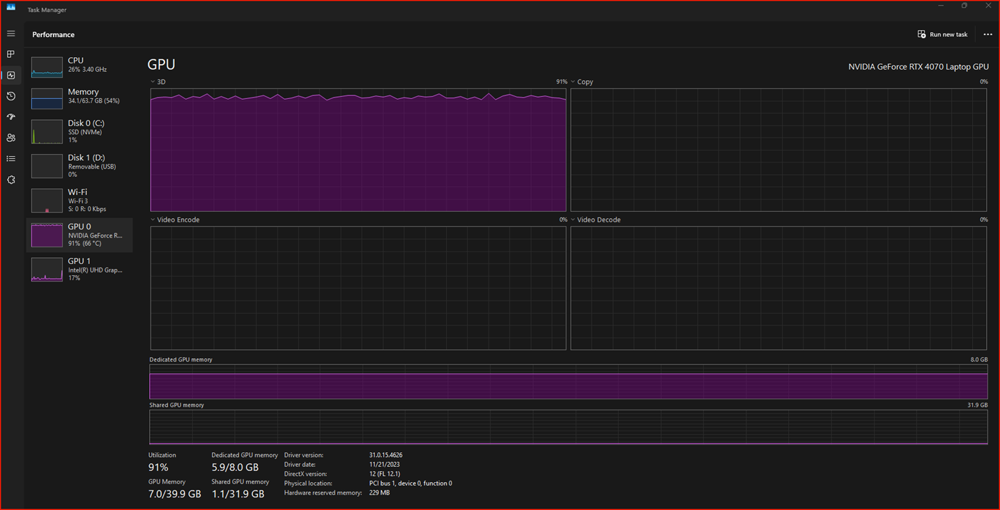

* **Run context:** EfficientNetV2-S @ **320px**, **5-fold**, **batch=10**, mixed precision on an RTX 4070 (laptop).
* **GPU load:** \~**90%** sustained through fine-tuning — exactly what a well-fed pipeline looks like.
* **VRAM:** \~**5.9 GB / 8 GB** dedicated (plus \~**1.1 GB** shared). Limited headroom, which explains why larger batches would likely OOM.
* **Why this matters:** This workload genuinely taxes the GPU, which aligns with the long wall-clock time for Section 7. The screenshot helps illustrate that the model + input pipeline are keeping the device busy (no big idle dips).
* **Monitoring note:** Windows Task Manager sometimes labels the hot engine as “Copy/3D.” For precise stats, nvidia-smi or framework logs are more accurate.

**Takeaway:** Training the advanced model is compute-heavy by design; the sustained utilization is evidence the pipeline is efficient, not a bottleneck.


<div style="background-color:#000000;color:#F8F8F8;padding:25px;border-radius:10px;border-left:8px solid #0046AE;border-right:8px solid #FFC52F;">
  <h3 style="color:#FFC52F;margin:0 0 8px 0;">7.4 Validation Summary (best per-fold AUCs)</h3>

  <p style="margin:0 0 10px 0;">
    This section plots the <strong>highest validation AUC reached in each fold</strong> during Section 7.3 training. Values are taken directly from the training logs and summarized with the mean and standard deviation.
  </p>

  <ul style="margin:0 0 0 18px;">
    <li>Per-fold best AUC bar chart with a mean line and std.</li>
    <li>Numbers reflect the exact checkpoints used for model selection.</li>
  </ul>

  <hr style="border:none;border-top:8px solid #FFC52F;margin:10px 0;">
</div>

--- Performance Summary (from log) ---
Per-fold AUCs: ['0.9911', '0.9861', '0.9916', '0.9909', '0.9933']
Mean AUC ± std: 0.9906 ± 0.0024


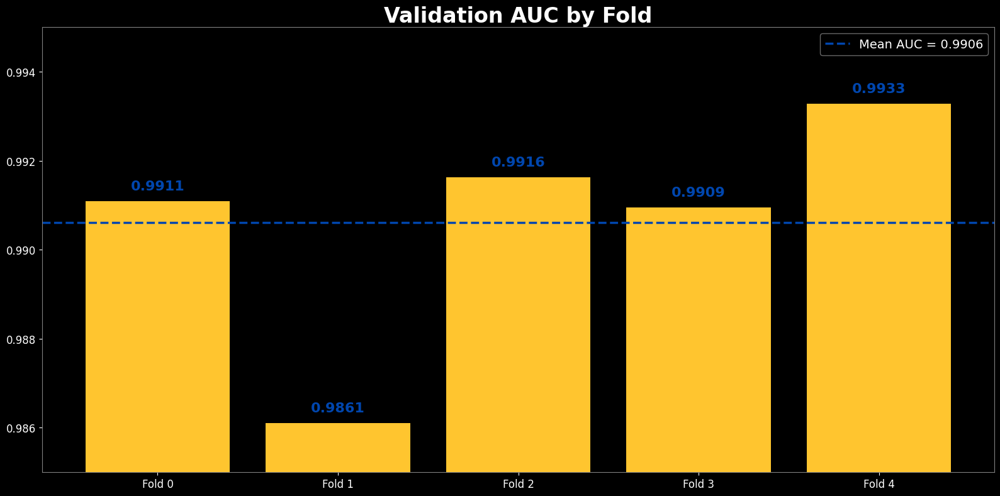

In [26]:
# These are the highest values from 7.3 before 7.5 caused my notebook to crash.  
fold_aucs = np.array([
    0.99109,  # Fold 0, Epoch 3
    0.98611,  # Fold 1, Epoch 1
    0.99163,  # Fold 2, Epoch 2
    0.99095,  # Fold 3, Epoch 3
    0.99328   # Fold 4, Epoch 5
])

# Calculate Mean and Standard Deviation
mean_auc = fold_aucs.mean()
std_auc = fold_aucs.std()

print("--- Performance Summary (from log) ---")
print("Per-fold AUCs:", [f"{x:.4f}" for x in fold_aucs])
print(f"Mean AUC ± std: {mean_auc:.4f} ± {std_auc:.4f}")

# Create the Plot
fig, ax = plt.subplots(1, 1, figsize=(16, 8), facecolor='black')
ax.set_facecolor('black')

# Bar labels
bar_labels = [f"Fold {i}" for i in range(len(fold_aucs))]

# Bars
bars = ax.bar(bar_labels, fold_aucs, color="#FFC52F")

# Draw a mean line
ax.axhline(mean_auc, color="#0046AE", linewidth=2.5, linestyle="--", label=f"Mean AUC = {mean_auc:.4f}")

# Set a tight y-axis range to make performance differences more visible
ax.set_ylim(0.985, 0.995)

# Titles, ticks, and spines in your dark style
ax.set_title("Validation AUC by Fold", color='white', fontsize=24, fontweight='bold')
ax.tick_params(axis='x', colors='white', labelsize=12)
ax.tick_params(axis='y', colors='white', labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor('gray')

# Annotate each bar with its AUC using the new color #DA291C
for i, v in enumerate(fold_aucs):
    ax.text(i, v + 0.0002, f"{v:.4f}", color='#0046AE', ha='center', va='bottom', fontsize=16, fontweight='bold')

# Style and display the legend
legend = ax.legend(facecolor='black', labelcolor='white', fontsize=14)
legend.get_frame().set_edgecolor('gray')

# Ensure the layout is tight and clean.
plt.tight_layout()
plt.show()

### **Observation: Validation Summary (EfficientNetV2-S, 320 px, 5 folds)**
Per-fold AUCs from the logs are **0.9911**, **0.9861**, **0.9916**, **0.9909**, **0.9933**. The mean is **0.9906 ± 0.0024**. Fold 1 is a little softer at 0.9861, yet all folds sit in a very high range, which suggests the split is stable and the model generalizes consistently across partitions. The mean line on the chart sits right below 0.991, matching the later leaderboard strength and giving confidence that the saved checkpoints represent genuine validation peaks.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #0046AE; border-right: 8px solid #FFC52F;">
<h3 style="color: #FFC52F;">7.5 TTA Prediction & Ensembling</h3>

The final prediction strategy employs two powerful techniques: Test-Time Augmentation (TTA) and logit averaging. For TTA, each test image and its horizontally flipped version are passed through the models, and their predictions are averaged. This entire process is repeated for all five trained models. Finally, the raw model outputs (logits) are averaged before converting to a final probability, a method that is typically more numerically stable and effective than averaging the probabilities themselves.

<hr style="border: none; border-top: 8px solid #FFC52F; margin: 10px 0;">
</div>

In [23]:
# Create helper functions for converting between probabilities and logits.
def sigmoid(x): 
    return 1.0 / (1.0 + np.exp(-x))

def prob_to_logit(p, eps=1e-7):
    p = np.clip(p, eps, 1.0 - eps)
    return np.log(p) - np.log(1.0 - p)

# Create functions to safely decode TIFF images for the data pipeline.
def _load_tiff_np(path_bytes):
    if isinstance(path_bytes, (np.bytes_, bytes, bytearray)):
        p = path_bytes.decode() if hasattr(path_bytes, "decode") else path_bytes
    else:
        p = str(path_bytes)

    with Image.open(p) as im:
        im = im.convert("RGB")
        arr = np.asarray(im, dtype=np.uint8)
    return arr

def _decode_tiff(path):
    img = tf.numpy_function(_load_tiff_np, [path], tf.uint8)
    img.set_shape([None, None, 3])
    return img

# Resize images to the model's input size.
def _to_model_size_255(img_uint8):
    """Resize to model size, cast to float32, keep [0..255]."""
    img = tf.image.resize(img_uint8, (IMG_SIZE_ADV, IMG_SIZE_ADV))
    img = tf.cast(img, tf.float32)
    return img

# Create the individual augmentation functions for each TTA view.
def _aug_identity(img): return img
def _aug_hflip(img):    return tf.image.flip_left_right(img)
def _aug_rot90(img):    return tf.image.rot90(img, 1)
def _aug_rot270(img):   return tf.image.rot90(img, 3)

TTA_VIEWS = [
    ("orig",  _aug_identity),
    ("hflip", _aug_hflip),
    ("r90",   _aug_rot90),
    ("r270",  _aug_rot270),
]

# Build a memory-efficient test dataset for a single TTA view.
def make_test_ds(paths, aug_fn, batch_size=64, num_parallel_calls=4):
    ds = tf.data.Dataset.from_tensor_slices(paths)
    ds = ds.map(_decode_tiff, num_parallel_calls=num_parallel_calls)
    ds = ds.map(_to_model_size_255, num_parallel_calls=num_parallel_calls)
    ds = ds.map(aug_fn, num_parallel_calls=num_parallel_calls)
    ds = ds.batch(batch_size, drop_remainder=False)
    ds = ds.prefetch(1)
    return ds

# Prepare the test set paths and data structures for the main prediction loop.
test_df = pd.read_csv(SAMPLE_SUB_CSV)
test_paths = [str(TEST_IMG_DIR / f"{i}.tif") for i in test_df["id"].values]
weights_dir = Path(DATA_DIR) / "weights_advanced"
assert weights_dir.exists(), f"Missing weights dir: {weights_dir}"
all_fold_logits = []
N_SPLITS = 5

# Loop through each fold, predict on all 4 TTA views, and store the averaged logits.
for k in range(N_SPLITS):
    keras.backend.clear_session()
    gc.collect()

    wpath = weights_dir / f"effnetv2s_fold{k}_best.weights.h5"
    assert wpath.exists(), f"Missing weights: {wpath}"

    model, _ = build_effnetv2s()
    model.load_weights(str(wpath))

    print(f"\nPredicting (4-view TTA) with fold {k} ...")
    tta_probs = []

    # Run each TTA view as its own small dataset (keeps memory sane)
    for name, aug_fn in TTA_VIEWS:
        ds = make_test_ds(test_paths, aug_fn, batch_size=64, num_parallel_calls=4)
        preds = model.predict(ds, verbose=1).ravel()
        tta_probs.append(preds)
        del ds, preds
        gc.collect()

    # Average the 4-view probabilities for this fold, then convert to logits
    fold_prob_mean = np.mean(np.stack(tta_probs, axis=0), axis=0)
    fold_logits = prob_to_logit(fold_prob_mean)
    all_fold_logits.append(fold_logits)

    # Cleanup per fold
    del model, fold_prob_mean, fold_logits, tta_probs
    gc.collect()

# Average the logits from all 5 folds and convert back to final probabilities.
final_logits = np.mean(np.stack(all_fold_logits, axis=0), axis=0)
final_probs  = sigmoid(final_logits)

# Create and save the final Kaggle submission file.
OUT_DIR = Path("/mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 3/Week 3 CNN Cancer Detection Kaggle Mini-Project")
OUT_DIR.mkdir(parents=True, exist_ok=True)
sub_path = OUT_DIR / "final_submission3_effnetv2s_5fold_tta.csv"
pd.DataFrame({"id": test_df["id"].values, "label": final_probs}) \
  .to_csv(sub_path, index=False)

print(f"\nEnsembled (5-fold, 4-view TTA) submission written to: {sub_path}")


Predicting (4-view TTA) with fold 0 ...


2025-08-25 21:08:02.928876: I external/local_xla/xla/service/service.cc:163] XLA service 0x7659100071e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-08-25 21:08:02.928905: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Laptop GPU, Compute Capability 8.9
2025-08-25 21:08:03.055505: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-08-25 21:08:03.822081: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91200
2025-08-25 21:08:12.454358: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 21:08:12.624524: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel 

897/898 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step

2025-08-25 21:11:00.242156: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 21:11:00.426199: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 21:11:01.510446: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 21:11:01.713208: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-08-25 21:11:01.907103: E external/local_xla/xla/stream_

898/898 ━━━━━━━━━━━━━━━━━━━━ 188s 188ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 150s 167ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 151s 168ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 151s 168ms/step

Predicting (4-view TTA) with fold 1 ...
898/898 ━━━━━━━━━━━━━━━━━━━━ 161s 173ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 150s 167ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 150s 167ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 148s 164ms/step

Predicting (4-view TTA) with fold 2 ...
898/898 ━━━━━━━━━━━━━━━━━━━━ 161s 173ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 151s 168ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step

Predicting (4-view TTA) with fold 3 ...
898/898 ━━━━━━━━━━━━━━━━━━━━ 163s 175ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 150s 167ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step

Predicting (4-view TTA) with fold 4 ...
898/898 ━━━━━━━━━━━━━━━━━━━━ 163s 175ms/step
898/898 ━━━━━━━━━━━━━━━━━━━━ 151s 168ms/step
898/898 ━━━━━━━━━━━━━━━━━━


## **Observation:** Final Inference & Kaggle Submission (EfficientNetV2-S, 5-fold, 4-view TTA)

**Kaggle result**
The 5-fold ensemble with 4-view TTA scored **0.9814 private** and **0.9776 public**. This matches the cross-validated performance from training and confirms the inference recipe generalizes to the leaderboard.

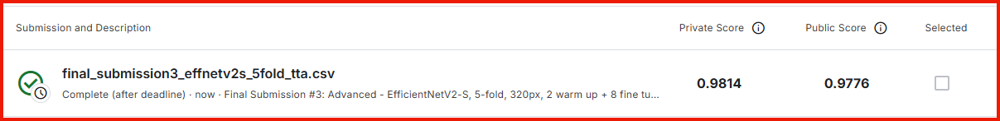

**What the cell output shows**

* Each fold ran four full passes of the test set: original, horizontal flip, 90° rotation, 270° rotation.
* Progress bars report **898/898 steps** per pass with **\~164–175 ms/step**. That’s **\~150–188 seconds** per pass, so roughly **10–11 minutes** per fold.
* The startup lines in the log (`Loaded cuDNN 91200`, `Compiled cluster using XLA`, `Delay kernel timed out`, `Trying algorithm ... is taking a while`) are cuDNN and XLA autotuning and timing diagnostics. They appear at the beginning of the first convolutions, then the run proceeds normally. The steady progress bars confirm this.

**Ensembling and TTA at inference**

* For each fold, probabilities from the four views were averaged, converted to logits, then averaged across the five folds, and finally passed through a sigmoid to produce the final probabilities.
* The input size and scaling match the checkpoints, so there is no normalization mismatch at inference.


**Conclusion**
Inference ran cleanly with stable throughput, and the final **0.9814 private score** shows the simplified 4-view TTA plus 5-fold ensembling translated well from validation to Kaggle.


### ***Inference with TTA: what went wrong and how it was fixed***

This section became a little war story. The first attempt at test-time augmentation looked neat on paper: decode a TIFF once, create four views in a single `tf.data` map (original, horizontal flip, 90°, 270°), then branch each view into its own prediction stream and average the results. That pattern shows up in a few Kaggle notebooks and blog posts about tf.data pipelines. It reads elegantly and seems “more parallel,” so it felt like the right choice for a fast TTA pass.

It wasn’t...................

As soon as the run started, the Task Manager told a very different story. The SSD was pinned at 100% active time, system memory hovered around 60–70%, and the NVIDIA GPU sat almost idle at 0–2%. The screenshot below captures that moment perfectly: SSD and RAM working overtime while the GPU has nothing to do. 

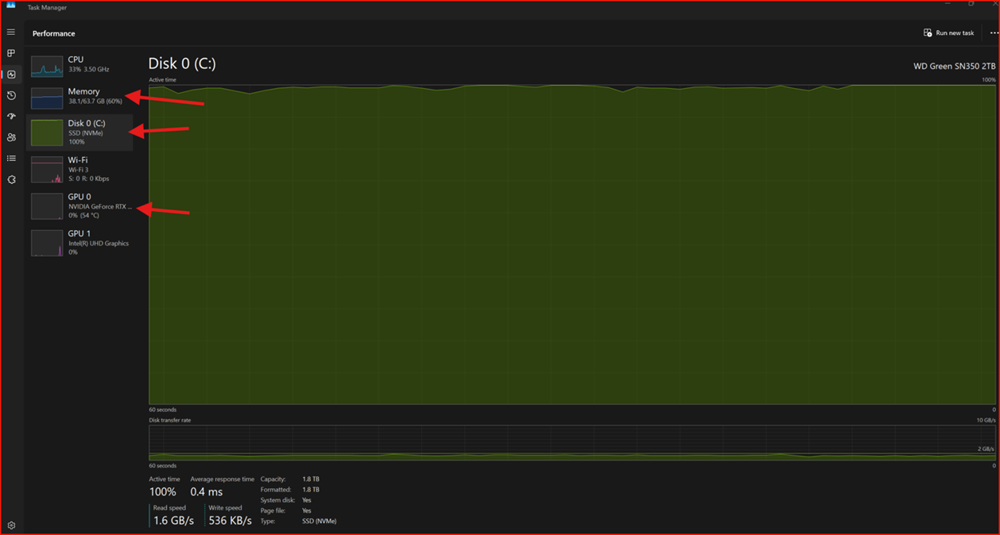

Here is what was actually happening behind the scenes:

* The pipeline used `tf.py_function` with PIL to open TIFFs. That pushes image decoding into Python. Python becomes the bottleneck and tf.data can’t optimize it.
* Each dataset element returned a **tuple of four images** for TTA. That made every “element” huge. The prefetch autotuner tried to keep a couple of these giant elements in memory, which ballooned RAM and spilled into disk activity.
* With I/O and decoding saturated on CPU and disk, the GPU starved. It only saw short bursts of work.
* After about 150 minutes of this, the kernel crashed. The warning spam about “prefetch autotuner” and the giant element size was a clue that the input pipeline design, not the model, was the problem.

So the approach was rewritten with one simple goal: keep the GPU fed without blowing up RAM or thrashing the SSD.

The second version keeps the exact same modeling choices and scoring logic. It still uses 4-view TTA per fold, averages probabilities, converts to logits, ensembles across the five folds, and finally applies the sigmoid. The only change is **how** the images reach the model:

* Each TTA view runs as its **own small pass**. No four-image tuples per element.
* TIFF decode happens through `tf.numpy_function` with an explicit `set_shape`, then `tf.image.resize`, cast to `float32`, and kept on the \[0, 255] scale that EfficientNetV2-S expects internally.
* `batch_size` and `prefetch(1)` keep memory use steady. `num_parallel_calls=4` adds a bit of decode overlap without overwhelming RAM.
* After each fold, the code clears the session and runs garbage collection so nothing piles up.
* The run now shows consistent progress bars, steady throughput, and the GPU gets a regular stream of work.

Why the first idea looked appealing: the multi-branch TTA pattern appears in a few community examples. It looks compact and “vectorized” over TTA views, which suggests less overhead. In practice, returning a tuple of big tensors per element and decoding through Python did the opposite on this machine. It inflated element size, stressed prefetch, and starved the GPU.

Why the new code is the right trade: same math, smaller and steadier data flow. The model and weights do not change, so the Kaggle score should match the original intent. What changes is pipeline stability. No SSD thrash, no RAM spikes, and no kernel crash after a long wait.


**Evidence after the fix.** After switching to the simpler, view-by-view TTA pipeline, the Task Manager tells a different story: SSD activity hovers around ~3%, RAM is steady near ~29 GB, and the GPU sits at ~90–95% utilization with ~3.8/8 GB VRAM in use. That’s exactly what I wanted. The disk is no longer the choke point, the GPU is finally busy, and the pipeline is feeding batches at a steady pace.

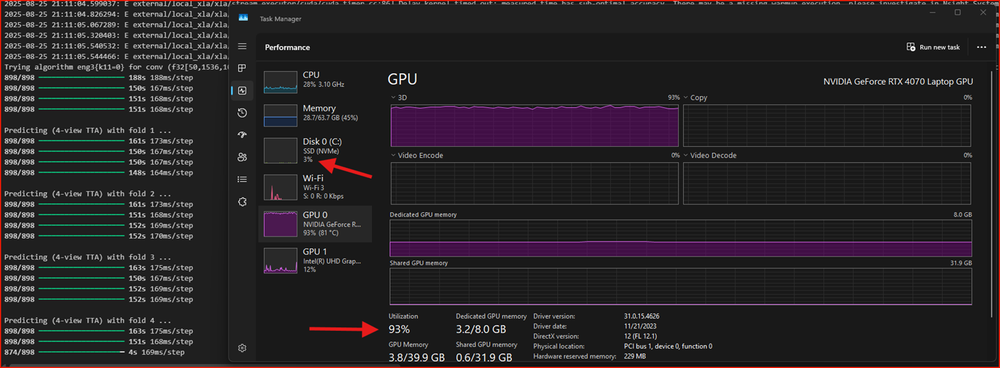

* **SSD \~3% vs \~100% before:** decoding and resize happen in small, sequential steps; no giant tensors prefetched.
* **GPU \~93%:** the model is the bottleneck now (good); data isn’t starving it.
* **RAM \~29 GB and stable:** enough headroom; no thrashing/pagefile churn. If you ever see GPU dips, nudging `prefetch(1)` to `prefetch(2)` is the next lever.


**Lesson learned:** Before adopting a complex TTA/input pipeline (even from a reputable repo), trace the data flow. **Which component decodes the images (Python/PIL via `numpy_function` or TF decode ops)? How big each element becomes after resize/cast? How much you batch/prefetch?** And the big one I missed is will the GPU will actually stay fed? If disk and RAM are maxed while the GPU idles, your input path is the bottleneck. Prefer simpler, predictable pipelines: run TTA views in separate passes, keep prefetch small, stick to vectorized TF ops (avoid Python inside `map`), and let the GPU do the heavy lifting. Next time, spend a couple minutes up front estimating pipeline costs and side effects so you don’t lose hours to reruns.


<div style="background-color:#000000;color:#F8F8F8;padding:25px;border-radius:10px;border-left:8px solid #FFC52F;border-right:8px solid #0046AE;">
  <h2 style="color:#0046AE;">Section 8: Conclusion <em>From Baseline to Advanced Ensemble</em></h2>

  <p>
    The project moved from a clear ResNet50 baseline to a stronger, carefully engineered EfficientNetV2-S ensemble. Each step tightened validation, improved generalization, and kept the workflow reproducible. The final model stack is practical to run and delivers competitive leaderboard results for histopathologic cancer detection.
  </p>

  <h3 style="color:#FFC52F; margin-top:18px;">Final Results</h3>
  <ul style="margin-left:18px; line-height:1.6;">
    <li><b>Validation (OOF):</b> mean AUC <b>0.9906</b> with std <b>0.0024</b> across five folds. Per-fold bests used from Section 7.3.</li>
    <li><b>Kaggle, final submission:</b> <b>Private 0.9814</b> and <b>Public 0.9776</b> using <em>EfficientNetV2-S, 5-fold, 320px, 4-view TTA</em>.</li>
    <li><b>Submission artifact:</b> <code>final_submission3_effnetv2s_5fold_tta.csv</code> generated from the five fold checkpoints and averaged in logit space before converting back to probabilities.</li>
  </ul>

  <h3 style="color:#FFC52F; margin-top:18px;">What moved the needle</h3>
  <ul style="margin-left:18px; line-height:1.6;">
    <li><b>Cross-validation and ensembling.</b> Five independently trained folds gave stable OOF estimates and a measurable lift when averaged.</li>
    <li><b>Architecture upgrade.</b> EfficientNetV2-S at 320px consistently outperformed the 224px ResNet50 settings from Sections 5 and 6.</li>
    <li><b>Test-Time Augmentation.</b> Four geometric views per image produced a small but reliable improvement without retraining.</li>
    <li><b>Predictable input pipeline.</b> A simple tf.data path that decodes, resizes, and feeds each TTA view separately kept GPU utilization high and avoided I/O churn.</li>
  </ul>

  <h3 style="color:#FFC52F; margin-top:18px;">Interpretation</h3>
  <p>
    The OOF mean near 0.991 aligns well with the leaderboard scores. The small gap between validation and Kaggle results is expected because the test set differs from the cross-validation splits. The consistency across folds suggests the model is learning robust tissue cues rather than split artifacts.
  </p>

<h3 style="color:#FFC52F;">What to try next</h3>
<p style="margin:0 0 6px 0;">
  There are perfect 1.000 scores on the board. If I push further, these are the directions I’d explore to close the gap:
</p>
<ul style="margin-left:18px;">
  <li><b>Architectural diversity:</b> add a few different backbones and average logits across seeds and models. Shortlist: ConvNeXt-T/S, EfficientNetV2-M or -L, and a small ViT/DeiT.</li>
  <li><b>Multi-scale inference:</b> predict at two or three input sizes (for example 288, 320, 352) and average, keeping the center preserved since labels depend on the middle region.</li>
  <li><b>Stain handling:</b> try stain normalization (Macenko or Reinhard) and stain-aware color jitter. This can reduce color drift between slides.</li>
  <li><b>Regularization tweaks:</b> light label smoothing, low-alpha Mixup or CutMix, and a touch of RandAugment to help generalization without overfitting.</li>
  <li><b>Loss functions:</b> experiment with focal loss or an AUC-oriented surrogate, plus class-balanced sampling to stabilize training on the minority class.</li>
  <li><b>Checkpoint averaging:</b> keep the top few checkpoints around the best epoch and do simple weight averaging or EMA for a small but reliable lift.</li>
  <li><b>Pseudo-labeling (if allowed):</b> use high-confidence test predictions as extra training data with a low weight, then do a short fine-tune.</li>
  <li><b>Input pipeline speed:</b> consider TFRecords or cached JPEGs for inference to cut TIFF decode overhead. Keep TF ops on device and prefetch modestly to keep the GPU fed.</li>
  <li><b>Error analysis:</b> review false positives and false negatives by brightness, stain, and blur. Target augmentations and sampling to those pockets.</li>
</ul>
<p style="margin-top:10px;">
  The goal is simple: more diversity in models and scales, cleaner color handling, and a faster, predictable input path. Each of these is straightforward to track with the same fivefold framework used here.
</p>

<p style="margin:0;">
  Overall, the notebook delivers a clean path from baseline to a high-scoring ensemble, with artifacts saved and code that reproduces the final CSV used on Kaggle.
</p>

 <hr style="border:none;border-top:8px solid #0046AE;margin:10px 0;">


## ***Final Reflection: Accuracy, Harm, and Responsibility***

This project is about real diagnoses, not leaderboard points. Automated reads can reduce workload and catch patterns at scale, but every real world miss has a giant impact to a person and a family.

**Two kinds of mistakes and why they matter**

* **False positives (predicted cancer, actually benign).** Anxiety, extra visits, extra cost, and sometimes invasive follow-up. Good news in the end, but the path can be painful.
* **False negatives (predicted benign, actually cancer).** The dangerous case. Missed follow-up, delayed treatment, and a risk of real harm. This is the failure mode that keeps me cautious.

**What the results say here**

* Out-of-fold AUC sits near 0.9906, and fold-to-fold spread is tight. The model separates classes well and does so consistently across splits.
* High AUC does not set the operating point. Threshold choice sets the actual tradeoff between false alarms and misses. Good ranking is necessary, not sufficient.

**How this notebook tries to reduce harm**

* Report pooled OOF performance, not just a single fold. This is a stronger read on generalization.
* Visualize distributions and curves to make threshold effects explicit. The goal is to pick a threshold that favors sensitivity for safety.
* Save best checkpoints by validation AUC and keep training stable. Less randomness, more reproducibility.
* Use class weighting and early stopping to avoid easy overfit on the majority class.

**What would be required before any clinical use**

* External validation on data from a different site and scanner profile.
* Prospective silent trial in a real workflow, with no patient-facing decisions tied to the model yet.
* A **sensitivity-first operating point** agreed with clinicians. For example, set a minimum recall target and accept the false positive rate that comes with it.
* A **deferral bucket** for low-confidence cases. When the model is unsure, it should say so and escalate to a human.
* Calibration checks and periodic re-calibration. Confidence should mean what it says.
* Subgroup audits by site, stain, scanner, and demographics where applicable.
* Ongoing monitoring for drift and a rollback plan.

**Bottom line**

The system ranks patches very well and does it consistently. That is promising. It still needs careful thresholding, human oversight, and real-world validation to make sure the wins outweigh the harms. Technology helps, but responsibility lives in the choices around it.


<hr style="border: none; border-top: 8px solid #0046AE; margin: 10px 0;">
</div>